# AIML CAPSTONE PROJECT

## Computer Vision - PNEUMONIA DETECTION CHALLENGE

## FINAL SUBMISSION

### Submitted by
## Gopi Krishna, Haritha, Ankur Saxena, Hari Kumar M, Priya, Shailesh Choudhari and Anand Vatkar

----------

# Part A - 
## DOMAIN: Health Care

## CONTEXT: 

Computer vision can be used in health care for identifying diseases. In Pneumonia detection we need to detect Inflammation
of the lungs. In this challenge, you’re required to build an algorithm to detect a visual signal for pneumonia in medical
images. Specifically, your algorithm needs to automatically locate lung opacities on chest radiographs. 

## DATA DESCRIPTION:

- In the dataset, some of the features are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was
determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the
appearance of true pneumonia. Dicom original images: - Medical images are stored in a special format called DICOM files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data.
- Dataset has been attached along with this project. Please use the same for this capstone project.
- Original link to the dataset : https://www.kaggle.com/c/rsna-pneumonia-detection-challenge/data [ for your reference
only ]. You can refer to the details of the dataset in the above link
- Acknowledgements: https://www.kaggle.com/c/rsna-pneumonia-detection-challenge/overview/acknowledgements.
## PROJECT OBJECTIVE: 

Design a DL based algorithm for detecting pneumonia.

----------

### Define Utility Functions

In [1]:
#This functions runs routine checks to verify the data, returns columnwise missing value percent
import warnings
import logging
import tensorflow as tf
import absl.logging

# Suppress TensorFlow logging
tf.get_logger().setLevel(logging.ERROR)
absl.logging.set_verbosity(absl.logging.ERROR)

# Suppress Python warnings
warnings.filterwarnings('ignore')

import pandas as pd
from sklearn.metrics import precision_recall_fscore_support, accuracy_score
from time import time

# Initialize the DataFrame to store the results
results_df = pd.DataFrame(columns=[ "Description", "Threshold", "Accuracy", "Precision", "Recall", 
                                   "F1 Score", "Model", "Execution Time"])
sub_result_df = pd.DataFrame(columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1'])

def studydf(df):
    import pandas as pd
    
    nx=[]
    printshape(df)
    print("\nTop & Bottom 5 Rows of the Dataset")
    display(df.head())
    display(df.tail())
    
    print("\nMeta data of the dataset")
    df.info()
    nulls= N_nulls(df)
    if( nulls > 0):
        print("\n%d missing values detected" %nulls)
        print("\nPercent of missing values per column are as follows")
        
        mp = percentMissing(df)
        nx = mp[mp>0]
        print(nx)
    else:
        print("\nNo missing values detected")
    n_dups = duplicates_detected(df)
    if(n_dups>0):
        print("\n%d Duplicates Detected." %n_dups)
    else:
        print("\nNo Duplicates Detected.")

    return nx

#Following are standard utility fiunctions. self explanatory
def N_nulls(df):
    #check for null/nan value
    return len(df[df.isna().any(axis=1)])

def percentMissing(df):
    #Print Feature-wise percentage of Null values
    return df.isnull().sum() * 100 / len(df) 

def eliminate_duplicates(df):
    df.drop_duplicates(keep='first', inplace=True)
    return df

def duplicates_detected(df):
    return len(df[df.duplicated()])

def printshape(df):
    #Check shape of all sets
    print('\nData set shape:\tRows = %.0f,\tColumns = %.0f' %df.shape)

#Handy function for summarising raw data. Usefule when we want to decide if a column is categorical, or numerical
def studyAllCols(df):
    import numpy as np
    import pandas as pd
    #get all the categorical column names in the dataframe
    allcol = np.array(df.columns)
    objdf = pd.DataFrame(columns=['CatFeature', 'ClassCount','DType','ClassUniqueValues','ClassUniqueValueCount'])
    i=0
    for feature in allcol: # Loop through all columns in the dataframe
        n_cl_txt=np.array(df[feature].unique())
        n_cl_txt = n_cl_txt[~pd.isna(n_cl_txt)]
        x=df[feature].value_counts()
        c_cl=np.array(x[n_cl_txt])
        n_cl = len(n_cl_txt)
        typ=df[feature].dtype.name
        #print the number
        objdf.loc[i] = [feature, n_cl,typ,n_cl_txt,c_cl] # store no & values of unique values in the column in the new dataframe
        i+=1
    #find outlier to guess if the column is not categorical. True if categorical, False if not
    l = np.array(objdf['ClassCount'])   
    d = np.abs(l - np.median(l))
    mdev = np.median(d)
    objdf['LikelyCategorical'] = d / (mdev if mdev else 1.) < 6. 
    
    return objdf

# describe function with additional features
def desc(df):
    d = df.describe().T                             #can add percentiles=[0.1,0.25,0.5,0.75,0.9]
    d['cv']  = d['std']/d['mean']                   #coefficient of variation
    d['Skew'] = 3*(d['mean']-d['50%'])/d['std']     #Skew = 3*(Mean – Median)/Standard Deviation
    d['IQR'] = d['75%'] - d['25%']                  #Inter Quartile Range 
    d['LFence'] = d['25%'] - 1.5*d['IQR']           #Lower Fence
    d['UFence'] = d['75%'] + 1.5*d['IQR']           #Upper Fence
    d['OL%'] = (d['max'] - d['min'])/(d['UFence'] - d['LFence']) #Outliers = Range/(Fence range)
    return d.T

# Prints Loss and Accuracy from training history
import re

def plot_loss_and_metrics(history):
    his_keys = list(history.history.keys())
    n_items = int(len(his_keys) / 2)  # total number of metrics including loss

    fig, axs = plt.subplots(1, n_items, figsize=(6 * n_items, 4))  # create subplots for each metric

    for i in range(n_items):
        # train metric
        axs[i].plot(history.history[his_keys[i]], label='train', color='blue')

        # validation metric
        axs[i].plot(history.history[his_keys[i + n_items]], label='validate', color='red')

        # remove all digits and underscores for ylabel
        formatted_label = re.sub(r'[_\d]', ' ', his_keys[i])
        axs[i].set_title(formatted_label)
        axs[i].set_xlabel("epochs")

        axs[i].set_ylabel(formatted_label)
        axs[i].legend()

    plt.tight_layout()
    plt.show()
    
# Prints Confusion Matrix and Classification Report
def fancy_cm(y_test, y_pred, y_proba=None, lbl=[0,1], clmn=['No_Opacity', 'Opacity'], average='binary'):
    # calculate accuracy measures and confusion matrix
    from sklearn import metrics
    from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
    from sklearn.metrics import roc_auc_score
    import matplotlib.pyplot as plt
    import seaborn as sns
    # calculate accuracy measures and confusion matrix
    # metrics
    print("Classification Report")
    print(classification_report(y_test, y_pred, labels=lbl, target_names=clmn))
    
    print("\n Confusion Matrix")
    cm=confusion_matrix(y_test, y_pred, labels= lbl)
    pclmn = ["Pred " + sub for sub in clmn]
    df_cm = pd.DataFrame(cm, index = [i for i in clmn],
                  columns = [i for i in pclmn])
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=True, fmt='d')
    plt.show()
    accuracy = accuracy_score(y_test, y_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')
    return accuracy, precision, recall, f1
    
# This function Prints Confusion Matrix and Classification Report, Precision - Recall Curve, ROC-AUC curve, and ,arks
# Given set of threshold on precision-recall curve
import numpy as np
def plot_precision_recall(y_probs, y_test, thresholds=np.arange(0.2, 0.9, 0.1), lbl=[0,1], clmn=['No_Opacity', 'Opacity'], mode=''):
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import confusion_matrix, precision_recall_curve
    from sklearn.metrics import roc_curve, auc, roc_auc_score
    import numpy as np
    # Initialize an empty DataFrame to store results
    sub_result_df = pd.DataFrame(columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1'])
    
    # Calculate precision and recall for different threshold values
    precision, recall, thresholds_pr = precision_recall_curve(y_test, y_probs)
    
    for threshold in thresholds:
        y_pred = [1 if prob > threshold else 0 for prob in y_probs]
        print(f"Threshold = {threshold:.1f}:")
        s_accuracy, s_precision, s_recall, s_f1 = fancy_cm(y_test, y_pred, y_probs, lbl=lbl, clmn=clmn)
        # Append these metrics to the result DataFrame
        sub_result_df = sub_result_df.append({'Threshold': threshold, 
                                              'Accuracy': s_accuracy, 
                                              'Precision': s_precision, 
                                              'Recall': s_recall, 
                                              'F1': s_f1}, 
                                             ignore_index=True)
    if mode != 'bin':    
        # Plot the precision-recall curve for each threshold
        plt.figure(figsize=(8, 8))
        plt.plot(recall, precision, label='PR Curve')
        i = 0
        for threshold in thresholds:
            y_pred = [1 if prob > threshold else 0 for prob in y_probs]
            # find nearest threshold
            close_threshold = np.argmin(np.abs(thresholds_pr - threshold))
            plt.plot(recall[close_threshold], precision[close_threshold], '^', markersize=10+i,
                     label=f"threshold {threshold:.1f}", fillstyle="none", c='k', mew=2)
            i += 1
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title('Precision-Recall Curve')
        plt.legend(loc='lower left')
        plt.show()

        # Plot ROC-AUC Curve
        if (len(clmn)<=2):
            roc_auc = roc_auc_score(y_test, y_probs)
            print("ROC_AUC score = %.4f" %roc_auc)
            fpr, tpr, _ = roc_curve(y_test, y_probs)
            plt.figure()
            lw = 2
            plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
            plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('Receiver operating characteristic example')
            plt.legend(loc="lower right")
            plt.show()
    return sub_result_df

# This function Prints Confusion Matrix and Classification Report, Precision - Recall Curve, ROC-AUC curve, and ,arks
# Given set of threshold on precision-recall curve where probabilities are generated from the actual and predicted mask

def plot_precision_recall_mask(y_probs, y_test, thresholds=np.arange(0.1, 0.9, 0.1), lbl=[0,1], clmn=['No_Opacity', 'Opacity']):
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import confusion_matrix, roc_curve, auc
    import numpy as np
    
    # Initialize an empty DataFrame to store results
    sub_result_df = pd.DataFrame(columns=['Threshold', 'Accuracy', 'Precision', 'Recall', 'F1'])

    # Initialize lists to store precision, recall, and false positive rates
    thresholds_pr = []
    precisions = []
    recalls = []
    fprs = []
    tprs = []
    epsilon = 1e-7
    for threshold in np.arange(0.0, 1.01, 0.005):
        # Convert the probabilities into binary predictions and check if any object has been predicted
        y_pred = [1 if np.any((prob >= (threshold-epsilon)).astype(np.float32) != 0) else 0 for prob in y_probs]

        # Compute confusion matrix
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

        # Calculate precision and recall, add small epsilon to avoid division by zero
        precision = (tp + epsilon) / (tp + fp + epsilon)
        recall = (tp + epsilon) / (tp + fn + epsilon)

        precisions.append(precision)
        recalls.append(recall)

        # Calculate false positive rate and true positive rate for ROC curve
        tpr = recall  # TPR is same as recall
        fpr = (fp + epsilon) / (fp + tn + epsilon)

        fprs.append(fpr)
        tprs.append(tpr)
        thresholds_pr.append(threshold)

        if np.round(threshold,3) in thresholds:
            # give performance params
            print(f'Threshold: {threshold:.1f}')
            s_accuracy, s_precision, s_recall, s_f1 = fancy_cm(y_test, y_pred)
            # Append these metrics to the result DataFrame
            sub_result_df = sub_result_df.append({'Threshold': np.round(threshold,3), 
                                                  'Accuracy': s_accuracy, 
                                                  'Precision': s_precision, 
                                                  'Recall': s_recall, 
                                                  'F1': s_f1}, 
                                                 ignore_index=True)
        
    # Sort fprs and tprs based on fprs to make sure fprs are in increasing order
    sorted_indices = np.argsort(recalls)
    precisions = [precisions[i] for i in sorted_indices]
    recalls = [recalls[i] for i in sorted_indices]
    # Plot precision-recall curve
    plt.figure(figsize=(8, 6))
    plt.plot(recalls, precisions, linestyle='--', label='PR Curve')
    
    for i, threshold in enumerate(thresholds):
        # find nearest threshold
        close_threshold = np.argmin(np.abs(np.array(thresholds_pr) - threshold))
        print(f'{close_threshold}, {threshold}, {recalls[close_threshold]}')
        plt.plot(recalls[close_threshold], precisions[close_threshold], '^', markersize=10+i,
                 label=f"threshold {threshold:.1f}", fillstyle="none", c='k', mew=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower left")
    plt.grid()
    plt.show()
    
    # Sort fprs and tprs based on fprs to make sure fprs are in increasing order
    sorted_indices = np.argsort(fprs)
    fprs = [fprs[i] for i in sorted_indices]
    tprs = [tprs[i] for i in sorted_indices]

    # Calculate AUC (Area under the ROC Curve)
    roc_auc = auc(fprs, tprs)

    # Plot the ROC curve
    plt.figure()
    plt.plot(fprs, tprs, color='darkorange', label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', linestyle='-')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()
    return sub_result_df

# This function is for results book keeping
def update_results(sub_res, Desc, Saved_Model, difftime):
    results_list = []

    for row in sub_res.values:
        # Create a dictionary with the results
        results = {
            "Model": Saved_Model,
            "Threshold": row[0],
            "Accuracy": row[1],
            "Precision": row[2],
            "Recall": row[3],
            "F1 Score": row[4],
            "Description": Desc,
            "Execution Time": difftime,
        }
        # Add the results to the list
        results_list.append(results)

    # Convert the results list to a DataFrame and append it to the existing results_df
    #new_results_df = pd.DataFrame(results_list)
    #results_df = pd.concat([results_df, new_results_df], ignore_index=True)
        
    return results_df.append(results_list, ignore_index=True)
        
# Get clssification metrics
def get_metrics(y_test, y_prob, thresh=0.5):
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

    y_pred = (y_prob > thresh).astype(int)
    acc = accuracy_score(y_test, y_pred)*100
    precision = precision_score(y_test, y_pred)*100
    recall = recall_score(y_test, y_pred)*100
    f1 = f1_score(y_test, y_pred)*100
    auc = roc_auc_score(y_test, y_prob)*100
    cm = confusion_matrix(y_test, y_pred)

    return acc, precision, recall, f1, auc

# Get regression metrics
def get_reg_metrics(y_test, y_prob, thresh=0.5):
    from sklearn.metrics import mean_squared_error, mean_absolute_error
    import numpy as np

    y_pred = (y_prob > thresh).astype(int)
    
    # Add regression metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    
    return mse, rmse, mae

## PROJECT TASK: [ Score: 100 points]
### 1. Milestone 1: [ Score: 40 points]
####  Input: Context and Dataset
###  Process:
####  Step 1: Import the data. [ 3 points ]


In [2]:
# Additional Package Dependencies for the project

# conda install -c conda-forge pydicom v'2.3.1'
# conda install -c conda-forge tqdm v4.65.0
# conda install -c anaconda scikit-image v'0.19.3'
# conda install -c anaconda wget
# Additional installations required imgaug, git

In [3]:
import numpy as np
import pandas as pd
import pydicom
import os
from tqdm import tqdm
import pickle

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
# importing the zipfile module
from zipfile import ZipFile
def unzipfile(zipf):
    with ZipFile(zipf, 'r') as zObject:
        # Get the list of files names in the zip
        list_of_file_names = zObject.namelist()
        
        # Iterate over the list of file names in this case 'list_of_file_names'
        for file_name in tqdm(list_of_file_names, desc="Extracting "+zipf):
            # Extract each file in progress_bar
            zObject.extract(member=file_name)


In [5]:
# load labels from input files
train_labels = pd.read_csv('stage_2_train_labels.csv')
test_labels = pd.read_csv('stage_2_sample_submission.csv')
class_info = pd.read_csv('stage_2_detailed_class_info.csv')

# Define constants
ORIG_SIZE = 1024 # DICOM image original size
image_size = 224  # Size of input images
batch_size = 16 # set batch_size parameter
EPOCHS_SET = 12 # number of epochs to run

# Define paths for image io as per zip file
train_images_path = 'stage_2_train_images' 
test_images_path = 'stage_2_test_images'

set_color = 'RGB' #'L'
n_classes = 2
id_str = str(image_size)+str(set_color)+str(n_classes)
# Define paths for image io for converted PNG files to make them suitable for flow from directory
train_png_images_path = 'train_images'+id_str
val_png_images_path = 'val_images'+id_str
test_png_images_path = 'test_images'+id_str

lbl2 = ['No_Opacity', 'Opacity']
lbl3 = ['Normal', 'No_Opacity_Not_Normal', 'Opacity']

# unzip dicom images

# Check if the directory exists before unzipping
if not os.path.exists(train_images_path):
    unzipfile(train_images_path+'.zip')

# Check if the directory exists before unzipping
if not os.path.exists(test_images_path):
    unzipfile(test_images_path+'.zip')

In [6]:
# load sample 5 dicom images from each set

# Generate train labels by stripping the .dcm extension from each filename
train_images = [pydicom.dcmread(os.path.join(train_images_path, f"{img_id}.dcm")) 
                for img_id in tqdm(train_labels['patientId'].unique()[:5], desc="Loading "+train_images_path)]

# Generate test labels by stripping the .dcm extension from each filename
test_images = [pydicom.dcmread(os.path.join(test_images_path, f"{img_id}.dcm")) 
               for img_id in tqdm(test_labels['patientId'].unique()[:5], desc="Loading "+test_images_path)]


Loading stage_2_test_images: 100%|██████████████████████████████████████████████████████| 5/5 [00:00<00:00, 615.31it/s]


In [7]:
class_info.head(10)

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
6,00569f44-917d-4c86-a842-81832af98c30,No Lung Opacity / Not Normal
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,No Lung Opacity / Not Normal
8,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity


In [8]:
# get the distribution of targets to study if class imbalance exists

class_info['class'].value_counts()

No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: class, dtype: int64

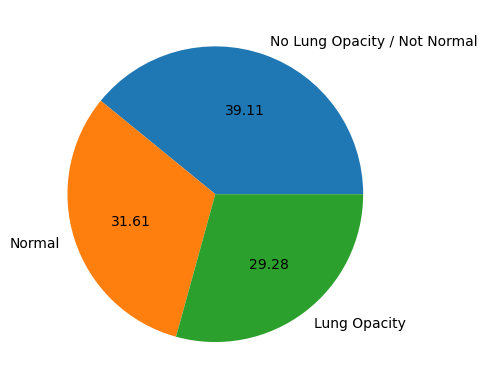

In [9]:
# find out the unique classes in the set and their distribution

plt.pie(class_info['class'].value_counts(),autopct='%.2f',labels=class_info['class'].unique());

#### Oservations
1. Stage_2_detailed_class_info.csv assigns one of three classes 'No Lung Opacity / Not Normal', 'Normal', 'Lung Opacity' to each image
2. Some images are assigned classes multiple times (e.g. images at index 4, 5)
3. If we consider 3 classes class imbalance is not sever


In [10]:
train_labels.head(10)

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1
6,00569f44-917d-4c86-a842-81832af98c30,NaN,NaN,NaN,NaN,0
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,NaN,NaN,NaN,NaN,0
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1


In [11]:
# get the distribution of targets to study if class imbalance exists

train_labels['Target'].value_counts()

0    20672
1     9555
Name: Target, dtype: int64

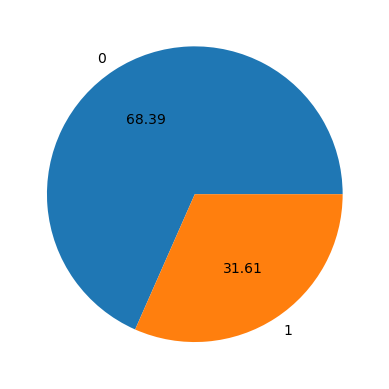

In [12]:
# find out the unique Targets in the set and their distribution

plt.pie(train_labels['Target'].value_counts(),autopct='%.2f',labels=train_labels['Target'].unique());

### Oservations
1. This dataframe (from stage_2_train_labels.csv) specifies the region of interest bounding box for each image.
2. If we compare it with class_info we can conclude that, with 'No Lung Opacity / Not Normal', 'Normal' diagnosis, no bounding boxes are specified. In this case Target variable is set to 0
3. But when 'Lung Opacity' is the diagnosis, then the bounding rectangle coordinates are specified and Target is set to 1.
4. There can be multiple regions in which lung opacity is detected in a single image. Hence the multiple instances of same patientID exist, in both class_info and train_labels dataframe.


In [13]:
# Study the shapes
print(f'Train labels = {train_labels.shape}, Test labels = {test_labels.shape}, classes = {class_info.shape}')

Train labels = (30227, 6), Test labels = (3000, 2), classes = (30227, 2)


In [14]:
nTranRecs = train_labels['patientId'].nunique()
nInfoRecs = class_info['patientId'].nunique()
print(f'Unique images in train_labels = {nTranRecs} and in class_info = {nInfoRecs}')

Unique images in train_labels = 26684 and in class_info = 26684


### Observations
1. Total number of train images is 26684
2. Total number of test images is 3000
3. Both train_labels and class_info has 30227 length which is greater than number of images. It implies that there are multiple bounding boxes exist in some images.
4. Both train_labels and class_info have records for 26684 number of unique images. This matches with number of training images.
5. stage_2_sample_submission.csv - Just contains the test images and specifies the format in which output is expected

### Actions 
1. we will create dictionaries for mapping information (target, class label and bounding boxes) in class_info and train_labels to the train_images. We shall create a metadata dataframe which creates single place where all information is collated. 

####  Step 2: Map training and testing images to its classes. [ 4 points ]


In [15]:
# Step 2: Map training images to its classes

# Create a dictionary to map patientId to its class (Target)
train_class_dict = train_labels.groupby('patientId')['Target'].apply(list).to_dict()

# Create a dictionary to map patientId to its class info
train_class_info_dict = class_info.groupby('patientId')['class'].apply(list).to_dict()

In [16]:
import itertools
def first5of(dic):
    # Print the first 5 items
    first_five_items = pd.DataFrame(itertools.islice(dic.items(), 5))
    display(first_five_items)

In [17]:
first5of(train_class_dict)

,0,1
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,[0]
1,000924cf-0f8d-42bd-9158-1af53881a557,[0]
2,000db696-cf54-4385-b10b-6b16fbb3f985,"[1, 1]"
3,000fe35a-2649-43d4-b027-e67796d412e0,"[1, 1]"
4,001031d9-f904-4a23-b3e5-2c088acd19c6,"[1, 1]"


In [18]:
first5of(train_class_info_dict)

,0,1
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,[No Lung Opacity / Not Normal]
1,000924cf-0f8d-42bd-9158-1af53881a557,[Normal]
2,000db696-cf54-4385-b10b-6b16fbb3f985,"[Lung Opacity, Lung Opacity]"
3,000fe35a-2649-43d4-b027-e67796d412e0,"[Lung Opacity, Lung Opacity]"
4,001031d9-f904-4a23-b3e5-2c088acd19c6,"[Lung Opacity, Lung Opacity]"


####  Step 3: Map training and testing images to its annotations. [ 4 points ]

In [19]:
# Step 3: Map training images to its annotations

# Create a dictionary to map patientId to its bounding boxes (x, y, width, height)
# We first create a DataFrame where each row contains a list [x, y, width, height]
bounding_boxes = train_labels.dropna()\
                             .groupby('patientId')[['x', 'y', 'width', 'height']]\
                             .apply(lambda x: x.values.tolist()).reset_index()
# Rename the column
bounding_boxes = bounding_boxes.rename(columns={0: "bboxes"})

# The column name after rename operation is "bboxes", so we need to refer to that instead of ['x', 'y', 'width', 'height']
train_anno_dict = dict(zip(bounding_boxes['patientId'], bounding_boxes["bboxes"]))

In [20]:
first5of(train_anno_dict)

,0,1
0,000db696-cf54-4385-b10b-6b16fbb3f985,"[[316.0, 318.0, 170.0, 478.0], [660.0, 375.0, ..."
1,000fe35a-2649-43d4-b027-e67796d412e0,"[[570.0, 282.0, 269.0, 409.0], [83.0, 227.0, 2..."
2,001031d9-f904-4a23-b3e5-2c088acd19c6,"[[66.0, 160.0, 373.0, 608.0], [552.0, 164.0, 3..."
3,001916b8-3d30-4935-a5d1-8eaddb1646cd,"[[198.0, 375.0, 114.0, 206.0]]"
4,0022073f-cec8-42ec-ab5f-bc2314649235,"[[575.0, 232.0, 246.0, 528.0], [161.0, 230.0, ..."


### To perform preprocessing and visualization, we'll use the following steps:

#### Preprocessing: 
Since the images are stored as DICOM files, they can be used as it is or converted into a more usable format (e.g., arrays of pixel intensities). Also, since the pixel intensities might vary across different images, we need to normalize the values.

### **PS: Important**

    It was observed that the kernel usually crashes if all the images are loaded in memory! Be it on PC, Kaggle or Google Colab. Hence it was decided to explore suitable methods which will enable training of model on all images without exhausting resources. The efforts are elaborated in **Case1 & Case2** below. **Case1** tries to train the model on subset of images in DICOM format. In **Case2** DICOM images are converted to PNG format are placed suitably to work with flow from directory function. The images are separated in test train and validation set at this stage itself and each name is assigned the set_name accordingly. Conclusion of the same shall be noted in observation below.

In either case, to streamline and explore the solutions, metadata dataframe will be created which will collect data from class info, train labels csv files as well as data from the DICOM images. The metadata shall be saved in csv format. The dataframe shall have 1 entry for each unique image. It will hold available informaiton for both train and test images, list of bounding boxes, labels as per Target (2) and Class info (3). Further each image shall be assigned a set name, either training, validation or test set. To enable easy slicing of the dataframe.

#### Brief on DICOM images:
DICOM (Digital Imaging and Communications in Medicine) is a standard used for storing and transmitting medical images. The DICOM standard was developed by the National Electrical Manufacturers Association (NEMA) in conjunction with the American College of Radiology (ACR).

DICOM images can contain patient information, as well as information about the image itself such as the modality (e.g., CT, MRI, ultrasound, etc.), image dimensions, the date the image was taken, and much more.

In addition to the imaging data, DICOM files often contain a large amount of metadata. This metadata includes details about the patient (like name, age, and sex), details about the equipment used to capture the image, and specifics about how the image was captured (like the angle, duration of exposure, etc.).

A key feature of the DICOM format is that it allows for patient information to be linked with the image data. This linking allows for better organization and retrieval of the images in a healthcare setting. This information can be extremely beneficial in a clinical workflow, where multiple medical professionals may need to access the image and understand the context in which it was taken.

One important thing to note is that while the DICOM standard provides a common format for medical images, the images themselves can vary widely. Differences in the equipment used, the settings selected by the technician, and even the specific patient can all result in differences in the images. As such, working with DICOM images can sometimes be a complex task.

#### Visualization: 
We'll display a few images from each class ('Lung Opacity', 'No Lung Opacity / Not Normal', 'Normal') to get an understanding of what each class looks like.

####  Step 4: Preprocessing and Visualisation of different classes [4 Points]

In [21]:
# Define helper functions usefule in creation of metadata dataframe

# Function to join all strings in the list [use for converting list in a column to text]
def join_strings(class_info):
    if class_info is not None:
        return ' '.join(class_info)
    return None

# Function to map 'class_info_text' to a label
def map_to_label(class_info_text):
    if class_info_text == 'Normal':
        return 0
    elif class_info_text == 'No Lung Opacity / Not Normal':
        return 1
    elif class_info_text is None:
        return None
    else:
        return 2

### Creation of meta data 
Here we collect all data in to one dataframe. Logic is to it will have unique records, each for train and test image. If the image has multiple bounding boxes then the list of all the boxes will be in the dataframe. The data frame will also hold test images. The data which is not available are kept as None and will be populated as per the output of our trained model. Metadata with also hold additional information from dicom images, as detailed below.

In [22]:
# let's see the header of typical dicom image
train_images[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

## Observations
1. Patient's Sex and Age wasstudied as part of interim report submission.
2. Function of other parameters shall be explored for improving accuracy below.
3. As per the details below, 
    a. the Dicom images in our dataset are already lossy compressed, hence changing the format to PNG will not result in significant loss of informatition.
    b. Photometric Interpretation for our images is Monochrome2, inwhich minimum pixel value is supposed represent black while displaying. Hence in normalising the image, we need to take care of this. Further details regarding the parameter significance is discussed below.

## Research on Dicom parameters
#### Pixel Spacing
Physical distance in the Patient between the center of each pixel, specified by a numeric pair - adjacent row spacing (delimiter) adjacent column spacing in mm. See Section 10.7.1.1 and Section 10.7.1.3. Required if the image has been calibrated. May be present otherwise.

If Pixel Spacing Calibration Type (0028,0A02) and Imager Pixel Spacing (0018,1164) and Nominal Scanned Pixel Spacing (0018,2010) are absent, then it cannot be determined whether or not correction or calibration have been performed.

#### Pixel Representation
Data representation of the pixel samples. Each sample shall have the same pixel representation.
| Enumerated Values |  |
|:---|:---|
| **0000H** unsigned integer | **0001H** 2's complement |

#### Bits Stored
Number of bits stored for each pixel sample. Each sample shall have the same number of bits stored. See PS3.5 for further explanation.

#### Bits Allocated, Bits Stored, and High Bit
For Ophthalmic Photography 8 bit images, the Enumerated Value of Bits Allocated (0028,0100) (Image Pixel Module, Section C.7.6.3) shall be 8; the Enumerated Value of Bits Stored (0028,0101) shall be 8; and the Enumerated Value of High Bit (0028,0102) shall be 7.

#### Lossy Image Compression
Specifies whether the Source Images have undergone lossy compression (at a point in their lifetime).
| Enumerated Values |  |
|:---|:---|
| **00** Image has NOT been subjected to lossy compression | **01** Image has been subjected to lossy compression |

#### Lossy Image Compression Method
Lossy Image Compression Method (0028,2114) may be multi-valued if successive lossy compression steps have been applied; the value order shall correspond to the values of Lossy Image Compression Ratio (0028,2112), if present.

| Defined Terms for Lossy Image Compression Method (0028,2114) |
|:---|
| **ISO_10918_1** JPEG Lossy Compression [ISO/IEC 10918-1] |
| **ISO_14495_1** JPEG-LS Near-lossless Compression [ISO/IEC 14495-1] |
| **ISO_15444_1** JPEG 2000 Irreversible Compression [ISO/IEC 15444-1] |
| **ISO_13818_2** MPEG2 Compression [ISO/IEC 13818-2] |
| **ISO_14496_10** MPEG-4 AVC/H.264 Compression [ISO/IEC 14496-10] |
| **ISO_23008_2** HEVC/H.265 Lossy Compression [ISO/IEC 23008-2] |

#### Photometric Interpretation
The value of Photometric Interpretation (0028,0004) specifies the intended interpretation of the image pixel data.

Defined Terms:
**MONOCHROME1**
Pixel data represent a single monochrome image plane. The minimum sample value is intended to be displayed as white after any VOI gray scale transformations have been performed. See PS3.4. This value may be used only when Samples per Pixel (0028,0002) has a value of 1. May be used for pixel data in a Native (uncompressed) or Encapsulated (compressed) format; see Section 8.2 in PS3.5 .

**MONOCHROME2**
Pixel data represent a single monochrome image plane. The minimum sample value is intended to be displayed as black after any VOI gray scale transformations have been performed. See PS3.4. This value may be used only when Samples per Pixel (0028,0002) has a value of 1. May be used for pixel data in a Native (uncompressed) or Encapsulated (compressed) format; see Section 8.2 in PS3.5 .

**RGB**
Pixel data represent a color image described by red, green, and blue image planes. The minimum sample value for each color plane represents minimum intensity of the color. This value may be used only when Samples per Pixel (0028,0002) has a value of 3. Planar Configuration (0028,0006) may be 0 or 1. May be used for pixel data in a Native (uncompressed) or Encapsulated (compressed) format; see Section 8.2 in PS3.5 .

#### Body Part Examined
Text description of the part of the body examined. See Annex L “Correspondence of Anatomic Region Codes and Body Part Examined Defined Terms” in PS3.16 for Defined Terms.

#### View Position
Radiographic view associated with Patient Position (0018,5100).
| For humans |  |
|:---|:---|
| **AP** Anterior/Posterior | **PA** Posterior/Anterior |
| **LL** Left Lateral | **RL** Right Lateral |
| **RLD** Right Lateral Decubitus | **LLD** Left Lateral Decubitus |
| **RLO** Right Lateral Oblique | **LLO** Left Lateral Oblique |

#### Conversion Type
Describes the kind of image conversion.

| Defined Terms |  | |  |
|:---|:---|:---|:---|
| **DV** Digitized Video | **DI** Digital Interface | **DF** Digitized Film | **WSD** Workstation |
| **SD** Scanned Document | **SI** Scanned Image | **DRW** Drawing | **SYN** Synthetic Image |

#### Modality
Type of device, process or method that originally acquired the data used to create the Instances in this Series.

| Defined Terms |  |  |  |
|:---|:---|:---|:---|
| **ANN** Annotation | **AR** Autorefraction | **ASMT** Content Assessment Results | **AU** Audio |
| **BDUS** Bone Densitometry (ultrasound) | **BI** Biomagnetic imaging | **BMD** Bone Densitometry (X-Ray) | **CR** Computed Radiography |
| **CT** Computed Tomography | **CTPROTOCOL** CT Protocol (Performed) | **DMS** Dermoscopy | **DG** Diaphanography |
| ... | ... | ... | ... |
| **TG** Thermography | **US** Ultrasound | **VA** Visual Acuity | **XA** X-Ray Angiography |
| **XAPROTOCOL** XA Protocol (Performed) | **XC** External-camera Photography |  |  |

**Note:** The term "PLAN" denotes Series describing planned activities. It is not be confused with radiotherapy treatment plans.


### Covert images to png format and save them to folders suitable for flow_from _directory funciton
#### Create metadata from the csv Data provided and the informatin from the image header

In [23]:
import os
import shutil
import pandas as pd
import numpy as np
from pydicom import dcmread
from PIL import Image
from skimage import exposure

# function for Coverting images to png format and save them to folders suitable for flow_from _directory funciton
def convert_save(filename, ds, n_classes, label, dataset, img_dims=(image_size, image_size), color='L'):
    #ds = dcmread(os.path.join(source_folder, filename + '.dcm'))  # Assuming filenames are without .dcm extension

    # Convert to grayscale, resize, and normalize pixel values
    img = Image.fromarray(ds.pixel_array).convert(color)
    
    # Resize the image
    img = img.resize(img_dims)
    
    # Standardize the image (for both grayscale and RGB)
    img = (img - np.min(img)) / 255.  #(np.max(img) - np.min(img))

    # Decide where to put th conveted image based on label and which set it belongs to...
    # This way we can access the images using flow from directory function
    if n_classes == 2:
        if label is not None:  # 1.0 corresponds to 'Opacity'
            class_dir = os.path.join(train_png_images_path if dataset == 'train' else val_png_images_path, lbl2[label])
        else:
            class_dir = os.path.join(test_png_images_path)
    else:
        if label is not None:  # 1.0 corresponds to 'Opacity'
            class_dir = os.path.join(train_png_images_path if dataset == 'train' else val_png_images_path, lbl3[label])
        else:
            class_dir = os.path.join(test_png_images_path)     

    # Create class directories if they don't exist
    if not os.path.exists(class_dir):
        os.makedirs(class_dir)

    # Save as PNG
    Image.fromarray((img * 255).astype(np.uint8)).save(os.path.join(class_dir, filename + '.png'))  
    # Saving with original filename
    
    return class_dir


In [24]:
# Create metadata from the csv Data provided and the informatin from the image header
import os
import pandas as pd
from PIL import Image
import pydicom
import gc
from pydicom import dcmread
from sklearn.model_selection import train_test_split

val_ratio=0.2

# Initialize ViewPosition column if it doesn't exist
if 'ViewPosition' not in train_labels.columns:
    train_labels['ViewPosition'] = np.nan

# Prepare the metadata dictionary
metadata = {'patientId': [], 'patientSex': [], 'patientAge': [], 'width': [], 'height': [], 
            'class': [], 'num_boxes': [], 'boxes': [], 'class_info': [], 'class_info_text': [], 
            'label2': [], 'label3': [], 'set_name': [], 'folder': [], 'Modality': [], 
            'BodyPartExamined': [], 'ViewPosition': [], 'ConversionType': [], 'PixelSpacing': [], 
            'PhotometricInterpretation': [], 'SamplesperPixel': [], 'LossyImageCompression': [], 
            'LossyImageCompressionMethod': [], 'PixelRepresentation': [] }

# Assuming train_labels is your DataFrame
unique_train_labels = train_labels.drop_duplicates(subset='patientId', keep='first')

# Now, 'X' will be unique 'patientId's
train_filenames = unique_train_labels['patientId']

# And 'y' will be corresponding 'Target'
labels = unique_train_labels['Target']

test_filenames = test_labels['patientId']

# Split filenames into training and validation sets
train_files, val_files, train_lbls, val_lbls = train_test_split(
        train_filenames, labels, stratify=labels, test_size=val_ratio, random_state = 42)

for set_name, image_list in [('train', train_files), ('val', val_files), ('test', test_filenames)]:
    for filename in tqdm(image_list, desc=set_name):
        img_path = train_images_path if set_name != 'test' else test_images_path
        image = dcmread(os.path.join(img_path, filename + '.dcm'))  

        # Extract width, height and number of color channels (=1 as they are all grayscale)
        height, width = image.Rows, image.Columns

        # Append the computed metadata to the lists in the dictionary
        metadata['patientId'].append(image.PatientID)
        metadata['patientSex'].append(image.PatientSex)
        metadata['patientAge'].append(image.PatientAge)
        metadata['width'].append(height)
        metadata['height'].append(width)
        
        metadata['Modality'].append(image.Modality)
        metadata['LossyImageCompression'].append(pd.to_numeric(image.LossyImageCompression))
        metadata['LossyImageCompressionMethod'].append(image.LossyImageCompressionMethod)
        metadata['BodyPartExamined'].append(image.BodyPartExamined)
        metadata['ViewPosition'].append(image.ViewPosition)
        metadata['ConversionType'].append(image.ConversionType)
        metadata['SamplesperPixel'].append(image.SamplesPerPixel)
        metadata['PhotometricInterpretation'].append(image.PhotometricInterpretation)
        metadata['PixelSpacing'].append(str.format("{:4.3f}",image.PixelSpacing[0]))
        metadata['PixelRepresentation'].append(image.PixelRepresentation)       
        
        # Assign the class label and the number of bounding boxes
        if set_name != 'test':
            class_label = train_class_dict[image.PatientID]
            class_inf = train_class_info_dict[image.PatientID]
            class_inf_text = join_strings(list(set(list(class_inf))))
            num_boxes = len(train_anno_dict.get(image.PatientID, []))
            boxes = train_anno_dict.get(image.PatientID, [])
            label2 = class_label[0]
            label3 = map_to_label(class_inf_text)
            
            # Update 'ViewPosition' in train_labels only when processing training images
            train_labels.loc[train_labels['patientId']== image.PatientID, 'ViewPosition'] = image.ViewPosition
        else:
            # For test images, we don't have the class label and the bounding boxes
            class_label = None
            class_inf = None
            class_inf_text = None
            num_boxes = None
            label2 = None
            label3 = None
            boxes = None

        metadata['class'].append(class_label)
        metadata['num_boxes'].append(num_boxes)
        metadata['boxes'].append(boxes)
        metadata['class_info'].append(class_inf)
        metadata['class_info_text'].append(class_inf_text)
        metadata['label2'].append(label2)
        metadata['label3'].append(label3)
        metadata['set_name'].append(set_name)
        if n_classes == 2:
            metadata['folder'].append(convert_save(filename, image, n_classes, label2, set_name, 
                                                   img_dims=(image_size, image_size), color=set_color))
        else:
            metadata['folder'].append(convert_save(filename, image, n_classes, label3, set_name, 
                                                   img_dims=(image_size, image_size), color=set_color))
        
# Convert the dictionary to a pandas DataFrame
metadata_df = pd.DataFrame(metadata)

test: 100%|████████████████████████████████████████████████████████████████████████| 3000/3000 [00:53<00:00, 55.93it/s]


In [25]:
metadata_df

,patientId,patientSex,patientAge,width,height,class,num_boxes,boxes,class_info,class_info_text,...,Modality,BodyPartExamined,ViewPosition,ConversionType,PixelSpacing,PhotometricInterpretation,SamplesperPixel,LossyImageCompression,LossyImageCompressionMethod,PixelRepresentation
0,9c71c1ec-b6e6-46b1-89e1-398f921d7485,M,25,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
1,817a8977-7598-427a-92f7-57833c22e5fa,M,60,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
2,08fa5211-04ae-4150-b006-9683187f67d3,M,57,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
3,ec55e4ab-ecdd-4265-a5fa-d84ee0af1e0d,F,62,1024,1024,"[1, 1]",2.0,"[[168.0, 362.0, 153.0, 170.0], [576.0, 224.0, ...","[Lung Opacity, Lung Opacity]",Lung Opacity,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
4,6b10737e-ec37-4f37-8db3-a95434db6016,M,54,1024,1024,[0],0.0,[],[No Lung Opacity / Not Normal],No Lung Opacity / Not Normal,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29679,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,F,10,1024,1024,None,NaN,None,None,None,...,CR,CHEST,AP,WSD,0.139,MONOCHROME2,1,1,ISO_10918_1,0
29680,c1ec035b-377b-416c-a281-f868b7c9b6c3,M,74,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29681,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,M,58,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
29682,c1ef6724-f95f-40f1-b25b-de806d9bc39d,M,36,1024,1024,None,NaN,None,None,None,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0


In [26]:
# Save the Metadata for future use below
metadatfilename = 'Metadata'+id_str+'.csv'
metadata_df.to_csv(metadatfilename, index = False)

## EDA Section

We shall get acquanited with data. Visualisation is aimed at answering following questions...
1. How targets are distributed? Since we are presented with option for making the problem either a binary classification or 3 class classification, we can explore pros and cons of each. It was decided after interim report to use binary classfication. The same has been followed below. Imbalance has been handled 1. data augmentation and 2. by adding recall as a metric while training.
2. Can the information from DICOM image (patient's sex and age) header be used in classification?
3. How number of bounding boxes are distributed?
4. Is the format of images same?
5. Are there any abnormalities in data which will affect model training?
6. What is the effect and importance of ViewPosition?

In [27]:
# Slice the training images
metadata_train = metadata_df[metadata_df['set_name']!='test']

### Binary Target Distribution

In [28]:
metadata_train['label2'].value_counts()

0.0    20672
1.0     6012
Name: label2, dtype: int64

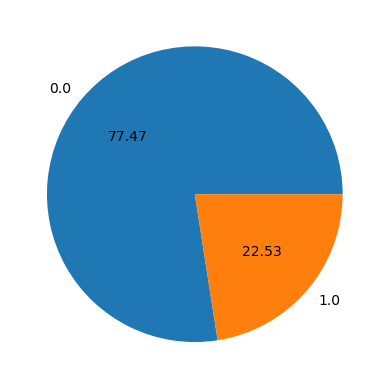

In [29]:
# find out the unique Target classes in the set and their distribution

plt.pie(metadata_train['label2'].value_counts(), autopct='%.2f', labels=metadata_train['label2'].unique());

### View Position Distribution

In [30]:
metadata_train['ViewPosition'].value_counts()

PA    14511
AP    12173
Name: ViewPosition, dtype: int64

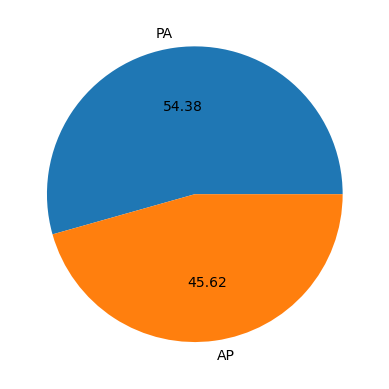

In [31]:
# find out the unique Target classes in the set and their distribution

plt.pie(metadata_train['ViewPosition'].value_counts(), autopct='%.2f', labels=metadata_train['ViewPosition'].unique());

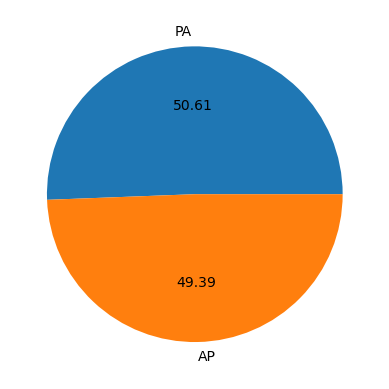

In [32]:
# find out the unique Target classes in the set and their distribution

plt.pie(train_labels['ViewPosition'].value_counts(), autopct='%.2f', labels=train_labels['ViewPosition'].unique());

### 3 Class Target Distribution

In [33]:
metadata_train['class_info_text'].value_counts()

No Lung Opacity / Not Normal    11821
Normal                           8851
Lung Opacity                     6012
Name: class_info_text, dtype: int64

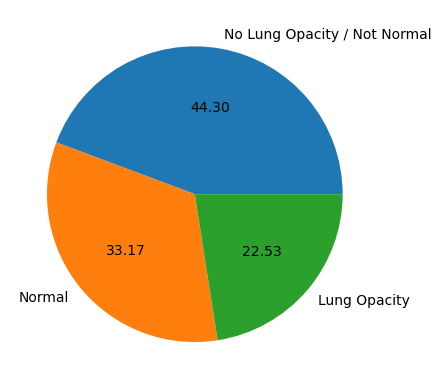

In [34]:
# find out the unique diagnosis classes in the set and their distribution

plt.pie(metadata_train['class_info_text'].value_counts(), autopct='%.2f', \
        labels=metadata_train['class_info_text'].value_counts().index)
plt.show()

### Dependence of Boundung box distribution view position
For the class Lung Opacity, corresponding to values of Target = 1, we plot the density of x, y, width and height.

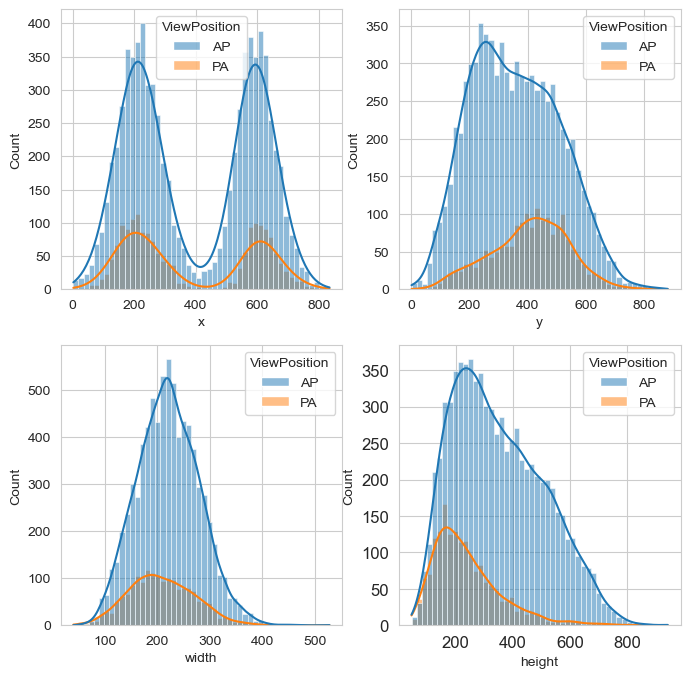

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only data points with Target==1
target1 = train_labels[train_labels['Target'] == 1]

# Set style for seaborn plots
sns.set_style('whitegrid')

# Create subplots
fig, ax = plt.subplots(2, 2, figsize=(8, 8))

# Create a histogram for each variable of interest
sns.histplot(data=target1, x='x', kde=True, bins=50, hue="ViewPosition", ax=ax[0, 0])
sns.histplot(data=target1, x='y', kde=True, bins=50, hue="ViewPosition", ax=ax[0, 1])
sns.histplot(data=target1, x='width', kde=True, bins=50, hue="ViewPosition", ax=ax[1, 0])
sns.histplot(data=target1, x='height', kde=True, bins=50, hue="ViewPosition", ax=ax[1, 1])

# Modify tick parameters
plt.tick_params(axis='both', which='major', labelsize=12)

# Display the plot
plt.show()


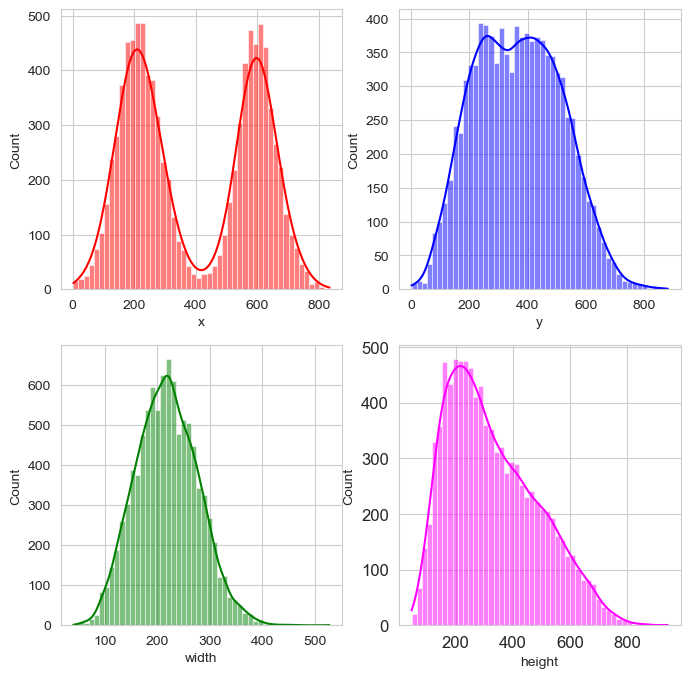

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only data points with Target==1
target1 = train_labels[train_labels['Target'] == 1]

# Set style for seaborn plots
#sns.set_style('whitegrid')

# Create subplots
fig, ax = plt.subplots(2, 2, figsize=(8, 8))

# Create a histogram for each variable of interest
sns.histplot(data=target1, x='x', kde=True, bins=50, color="red", ax=ax[0, 0])
sns.histplot(data=target1, x='y', kde=True, bins=50, color="blue", ax=ax[0, 1])
sns.histplot(data=target1, x='width', kde=True, bins=50, color="green", ax=ax[1, 0])
sns.histplot(data=target1, x='height', kde=True, bins=50, color="magenta", ax=ax[1, 1])

# Modify tick parameters
plt.tick_params(axis='both', which='major', labelsize=12)

# Display the plot
plt.show()


We will show a sample of center points superposed with the corresponding sample of the rectangles. The rectangles are created using the method described in Kevin's Kernel

## Visualization of distribution of bounding boxes for different ViewPositions

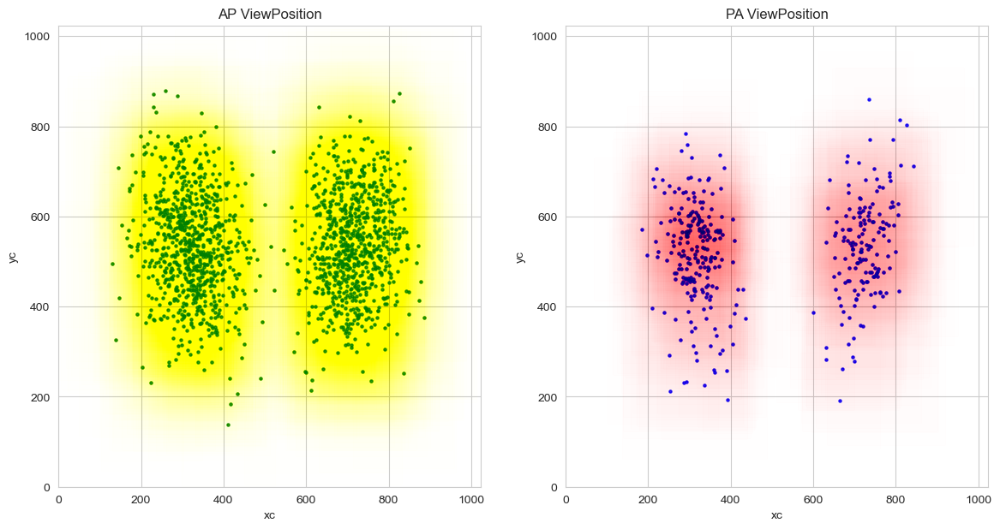

In [38]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Sample 5000 points from the target
target_sample = target1.sample(2000)

# Calculate the center of the rectangles
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2

# Split the samples by ViewPosition
target_sample_AP = target_sample[target_sample['ViewPosition'] == 'AP']
target_sample_PA = target_sample[target_sample['ViewPosition'] == 'PA']

# Create a new figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 7))

# Plot the samples with ViewPosition == 'AP'
axs[0].set_title("AP ViewPosition")
target_sample_AP.plot.scatter(x='xc', y='yc', xlim=(0, 1024), ylim=(0, 1024), ax=axs[0], alpha=0.8, marker=".", color="green")
for i, crt_sample in target_sample_AP.iterrows():
    axs[0].add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                           width=crt_sample['width'],
                           height=crt_sample['height'],
                           alpha=3.5e-3, color="yellow"))
    
# Plot the samples with ViewPosition == 'PA'
axs[1].set_title("PA ViewPosition")
target_sample_PA.plot.scatter(x='xc', y='yc', xlim=(0, 1024), ylim=(0, 1024), ax=axs[1], alpha=0.8, marker=".", color="blue")
for i, crt_sample in target_sample_PA.iterrows():
    axs[1].add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                           width=crt_sample['width'],
                           height=crt_sample['height'],
                           alpha=3.5e-3, color="red"))
    
# Display the plot
plt.show()


## Visualization of distribution of bounding boxes for all ViewPositions

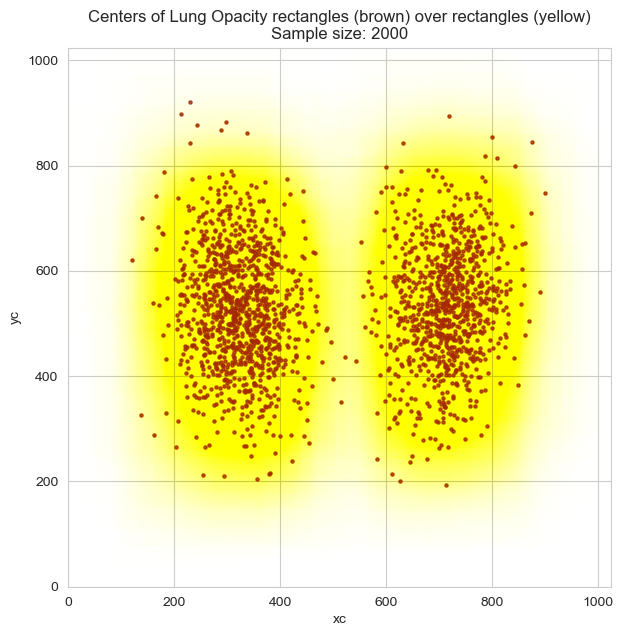

In [39]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Create a new figure and a new subplot
fig, ax = plt.subplots(1, 1, figsize=(7, 7))

# Sample 2000 points from the target
target_sample = target1.sample(2000)

# Calculate the center of the rectangles
target_sample['xc'] = target_sample['x'] + target_sample['width'] / 2
target_sample['yc'] = target_sample['y'] + target_sample['height'] / 2

# Set the title of the plot
plt.title("Centers of Lung Opacity rectangles (brown) over rectangles (yellow)\nSample size: 2000")

# Plot the centers of the rectangles
target_sample.plot.scatter(x='xc', y='yc', xlim=(0, 1024), ylim=(0, 1024), ax=ax, alpha=0.8, marker=".", color="brown")

# Draw the rectangles
for i, crt_sample in target_sample.iterrows():
    ax.add_patch(Rectangle(xy=(crt_sample['x'], crt_sample['y']),
                           width=crt_sample['width'],
                           height=crt_sample['height'],
                           alpha=3.5e-3, color="yellow"))
    
# Display the plot
plt.show()


## Observations
1. For binary classification the class imbalance is significant
2. For 3 Class classfication, imbalance is tolerable
3. Detected lung opacity window has different distribution based on ViewPosition
4. Bounding box distribution is different for different viewpositions. After research it was determined that the CNN are able to learn and predict Viewposition with 99% accuracy based on images alone, hence the influence of Viewposition will not affect the results significanty.


### Data Analysis

In [40]:
# Isolate columns where ever entry is a list for studying the columns of Metadata dataframe
columns = list(metadata_df.columns)

remove_columns = ['class', 'boxes', 'class_info']

columns = [col for col in columns if col not in remove_columns]


In [41]:
nx = studydf(metadata_df[columns])


Data set shape:	Rows = 29684,	Columns = 21

Top & Bottom 5 Rows of the Dataset


,patientId,patientSex,patientAge,width,height,num_boxes,class_info_text,label2,label3,set_name,...,Modality,BodyPartExamined,ViewPosition,ConversionType,PixelSpacing,PhotometricInterpretation,SamplesperPixel,LossyImageCompression,LossyImageCompressionMethod,PixelRepresentation
0,9c71c1ec-b6e6-46b1-89e1-398f921d7485,M,25,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
1,817a8977-7598-427a-92f7-57833c22e5fa,M,60,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
2,08fa5211-04ae-4150-b006-9683187f67d3,M,57,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
3,ec55e4ab-ecdd-4265-a5fa-d84ee0af1e0d,F,62,1024,1024,2.0,Lung Opacity,1.0,2.0,train,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
4,6b10737e-ec37-4f37-8db3-a95434db6016,M,54,1024,1024,0.0,No Lung Opacity / Not Normal,0.0,1.0,train,...,CR,CHEST,AP,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0


,patientId,patientSex,patientAge,width,height,num_boxes,class_info_text,label2,label3,set_name,...,Modality,BodyPartExamined,ViewPosition,ConversionType,PixelSpacing,PhotometricInterpretation,SamplesperPixel,LossyImageCompression,LossyImageCompressionMethod,PixelRepresentation
29679,c1e88810-9e4e-4f39-9306-8d314bfc1ff1,F,10,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,AP,WSD,0.139,MONOCHROME2,1,1,ISO_10918_1,0
29680,c1ec035b-377b-416c-a281-f868b7c9b6c3,M,74,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29681,c1ef5b66-0fd7-49d1-ae6b-5af84929414b,M,58,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.168,MONOCHROME2,1,1,ISO_10918_1,0
29682,c1ef6724-f95f-40f1-b25b-de806d9bc39d,M,36,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0
29683,c1f55e7e-4065-4dc0-993e-a7c1704c6036,M,57,1024,1024,NaN,None,NaN,NaN,test,...,CR,CHEST,PA,WSD,0.143,MONOCHROME2,1,1,ISO_10918_1,0



Meta data of the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29684 entries, 0 to 29683
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   patientId                    29684 non-null  object 
 1   patientSex                   29684 non-null  object 
 2   patientAge                   29684 non-null  object 
 3   width                        29684 non-null  int64  
 4   height                       29684 non-null  int64  
 5   num_boxes                    26684 non-null  float64
 6   class_info_text              26684 non-null  object 
 7   label2                       26684 non-null  float64
 8   label3                       26684 non-null  float64
 9   set_name                     29684 non-null  object 
 10  folder                       29684 non-null  object 
 11  Modality                     29684 non-null  object 
 12  BodyPartExamined             29684 non-null  obj

In [42]:
metadata_df['patientAge'] = metadata_df['patientAge'].astype('int64')

In [43]:
studyAllCols(metadata_df[columns])

,CatFeature,ClassCount,DType,ClassUniqueValues,ClassUniqueValueCount,LikelyCategorical
0,patientId,29684,object,"[9c71c1ec-b6e6-46b1-89e1-398f921d7485, 817a897...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",False
1,patientSex,2,object,"[M, F]","[16880, 12804]",True
2,patientAge,98,int64,"[25, 60, 57, 62, 54, 72, 33, 13, 51, 22, 49, 5...","[346, 642, 695, 541, 724, 274, 427, 115, 643, ...",False
3,width,1,int64,[1024],[29684],True
4,height,1,int64,[1024],[29684],True
5,num_boxes,5,float64,"[0.0, 2.0, 1.0, 3.0, 4.0]","[20672, 3266, 2614, 119, 13]",True
6,class_info_text,3,object,"[No Lung Opacity / Not Normal, Lung Opacity, N...","[11821, 6012, 8851]",True
7,label2,2,float64,"[0.0, 1.0]","[20672, 6012]",True
8,label3,3,float64,"[1.0, 2.0, 0.0]","[11821, 6012, 8851]",True
9,set_name,3,object,"[train, val, test]","[21347, 5337, 3000]",True


In [44]:
desc(metadata_df).T

,count,mean,std,min,25%,50%,75%,max,cv,Skew,IQR,LFence,UFence,OL%
patientAge,29684.0,47.032206,16.951208,1.0,34.0,49.0,59.0,412.0,0.360417,-0.348257,25.0,-3.5,96.5,4.11
width,29684.0,1024.000000,0.000000,1024.0,1024.0,1024.0,1024.0,1024.0,0.000000,NaN,0.0,1024.0,1024.0,NaN
height,29684.0,1024.000000,0.000000,1024.0,1024.0,1024.0,1024.0,1024.0,0.000000,NaN,0.0,1024.0,1024.0,NaN
num_boxes,26684.0,0.358080,0.712231,0.0,0.0,0.0,0.0,4.0,1.989028,1.508275,0.0,0.0,0.0,inf
label2,26684.0,0.225304,0.417790,0.0,0.0,0.0,0.0,1.0,1.854342,1.617824,0.0,0.0,0.0,inf
label3,26684.0,0.893607,0.738716,0.0,0.0,1.0,1.0,2.0,0.826668,-0.432074,1.0,-1.5,2.5,0.50
SamplesperPixel,29684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0,0.000000,NaN,0.0,1.0,1.0,NaN
LossyImageCompression,29684.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0,0.000000,NaN,0.0,1.0,1.0,NaN
PixelRepresentation,29684.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,NaN


## Observations
1. All images have same size
2. Number of bounding boxes vary from none to 4
3. Age data is wrong in some case as max age is 412
4. Metadata has been formed successfully as discussed above.
5. All images have single Modality, Body Part Examined, ConversionType, SamplesperPixel, LossyImageCompression, PixelRepresentation, LossyImageCompressionMethod and PhotometricInterpretation as indicated above
6. ViewPosition have two value AP (Anterior/Posterior) and PA (Posterior/Anterior), as some 13555 chest xrays are taken from front AP and some 16129 from back PA
7. PixelSpacing has 7 unique values, which will need not to be accounted for while converting and resizing DICOM images as CNN are usually scale invariant.
8. Photometric Interpretation Monochrome2 implied that minimum pixel value is to be treated as black pixel. The same has been taken care while normalising the image

### Discussion of DICOM images metadata for the images in our Datasets

#### Photometric Interpretation
MONOCHROME2
Pixel data represent a single monochrome image plane. The minimum sample value is intended to be displayed as black after any VOI gray scale transformations have been performed. See PS3.4. This value may be used only when Samples per Pixel (0028,0002) has a value of 1. May be used for pixel data in a Native (uncompressed) or Encapsulated (compressed) format; see Section 8.2 in PS3.5 .

#### Lossy Image Compression
01
Image has been subjected to lossy compression.

#### Lossy Image Compression Method
ISO_10918_1
JPEG Lossy Compression [ISO/IEC 10918-1]

#### Pixel Spacing
Physical distance in the Patient between the center of each pixel, specified by a numeric pair - adjacent row spacing (delimiter) adjacent column spacing in mm. See Section 10.7.1.1 and Section 10.7.1.3. Required if the image has been calibrated. May be present otherwise.

If Pixel Spacing Calibration Type (0028,0A02) and Imager Pixel Spacing (0018,1164) and Nominal Scanned Pixel Spacing (0018,2010) are absent, then it cannot be determined whether or not correction or calibration have been performed.

#### Pixel Representation
0000H
unsigned integer.

#### Sample per Pixel
1
single image plane- one sample per pixel means that each composite pixel value is identical to the single Pixel Data value

#### Modality
CR
Computed Radiography
Type of device, process or method that originally acquired the data used to create the Instances in this Series.

#### Body Part Examined
CHEST
Text description of the part of the body examined. 

#### View Position
Radiographic view associated with Patient Position 
Defined Terms:

AP
Anterior/Posterior

PA
Posterior/Anterior

#### Conversion Type

WSD
Workstation

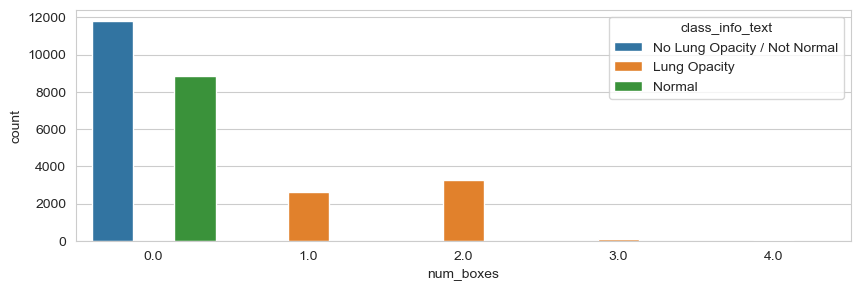

In [45]:
# Plot to see in which case and how many bounding boxes can be there per image

import seaborn as sns
import matplotlib.pyplot as plt

def countplotX(feature):
    plt.figure(figsize=(10, 3))
    sns.countplot(x='num_boxes', data=metadata_train, hue=feature)
    plt.show()
countplotX('class_info_text')

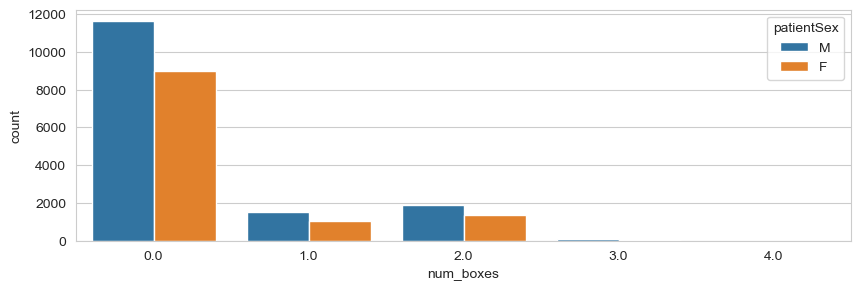

In [46]:
countplotX('patientSex')

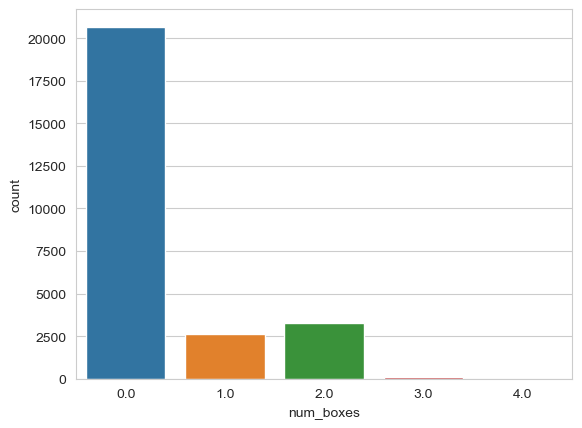

In [47]:
sns.countplot(x = metadata_train['num_boxes']);

## Observations
1. Bounding boxes are specified only in the case of Lung opacity
2. Males are more likely to have their chest x-ray taken than females

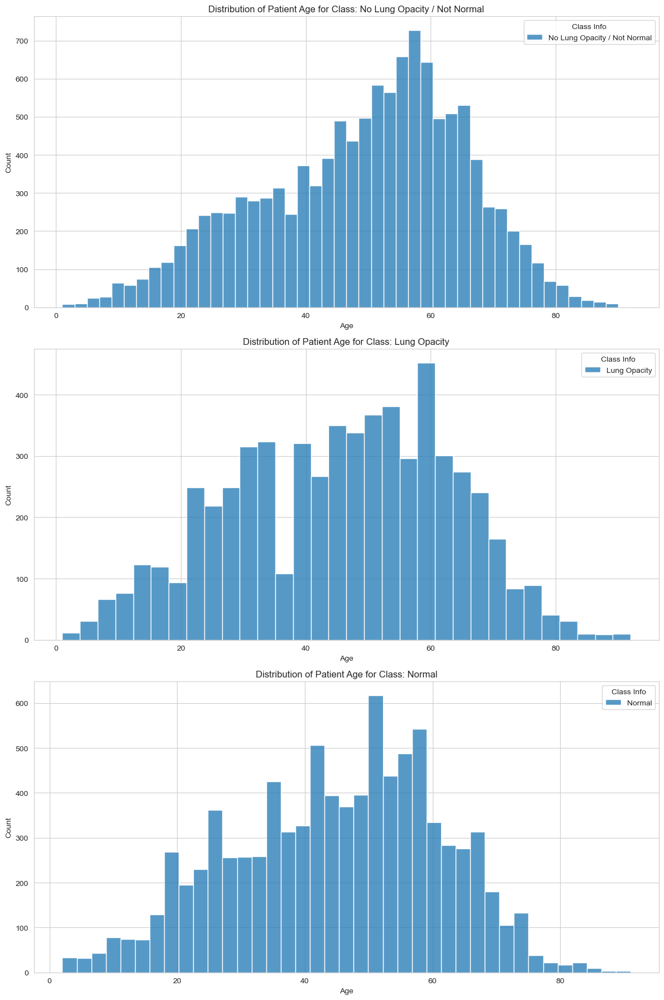

In [48]:
# Find out distribution of number of cases with patient's age in each type of diagnosis 

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming metadata_df['patientAge'] is already of integer type
slicedmt = metadata_df[metadata_df['patientAge'] <100]

# Get unique classes excluding None and count
classes = [cls for cls in slicedmt['class_info_text'].unique() if cls is not None]
num_classes = len(classes)

# Create subplots
fig, axs = plt.subplots(num_classes, 1, figsize=(12,6*num_classes))  # Adjust figure size here

for i, cls in enumerate(classes):
    sns.histplot(data=slicedmt[slicedmt['class_info_text'] == cls], x='patientAge', label=cls, ax=axs[i])
    axs[i].set_xlabel('Age')
    axs[i].set_ylabel('Count')
    axs[i].set_title(f'Distribution of Patient Age for Class: {cls}')
    axs[i].legend(title='Class Info')

plt.tight_layout()
plt.show()


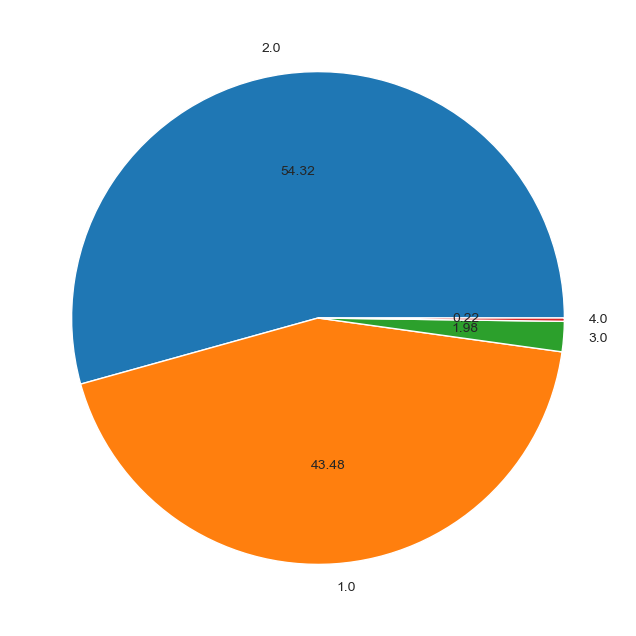

In [49]:
# Plot distribution of number of bounding boxes in case of Lung opacity images

plt.figure(figsize=(8,8))
plt.pie(metadata_train.loc[metadata_train['class_info_text'] == 'Lung Opacity']['num_boxes'].value_counts(),
        labels=metadata_train.loc[metadata_train['class_info_text'] == 'Lung Opacity']['num_boxes'].value_counts().index,
        autopct='%.2f');

### Observations
1. Upto 4 bounding boxes can be there if the diagnosis is 'Lung Opacity'
2. No bounding boxes are specified for other cases
3. Roughly (22.5%) Images are with 'Lung Opacity'
4. Hence class imbalance is tolerable with respect to othe classes.
5. All images are 1024x1024 grey scale images
6. Male cases slightly dominate the female ones
7. Distibution of ages for show negative skew to the left. every class Peaks at the age of 55-60
8. Some Age values are wrong. But since we are not using this info for training, we can ignore the same. 

####  Step 5: Display DICOM images with bounding box. [ 5 points ]

In [50]:
# Importing necessary libraries
import numpy as np
import pydicom

# Function to convert single-channel grayscale DICOM images to 3-channel RGB images
def dcm2rgb(dcm_file):
    """
    This function takes the file path to a DICOM image as input and returns a 3-channel RGB image.

    Args:
    dcm_file (str): The file path to the DICOM image.

    Returns:
    numpy.ndarray: The resulting 3-channel RGB image.
    """

    if type(dcm_file) == str:
        # Read DICOM file using pydicom
        dcm_data = pydicom.read_file(dcm_file)
    else:
        dcm_data = dcm_file
    
    # Extract pixel array from DICOM data
    im = dcm_data.pixel_array

    # Convert from single-channel grayscale to 3-channel RGB by stacking the grayscale images
    im = np.stack([im] * 3, axis=2)
    
    # Resize the image to the desired size (224x224)
    #im = cv2.resize(im, (224, 224))

    # As you need a single channel image, you can convert the RGB image to grayscale
    im = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

    return im


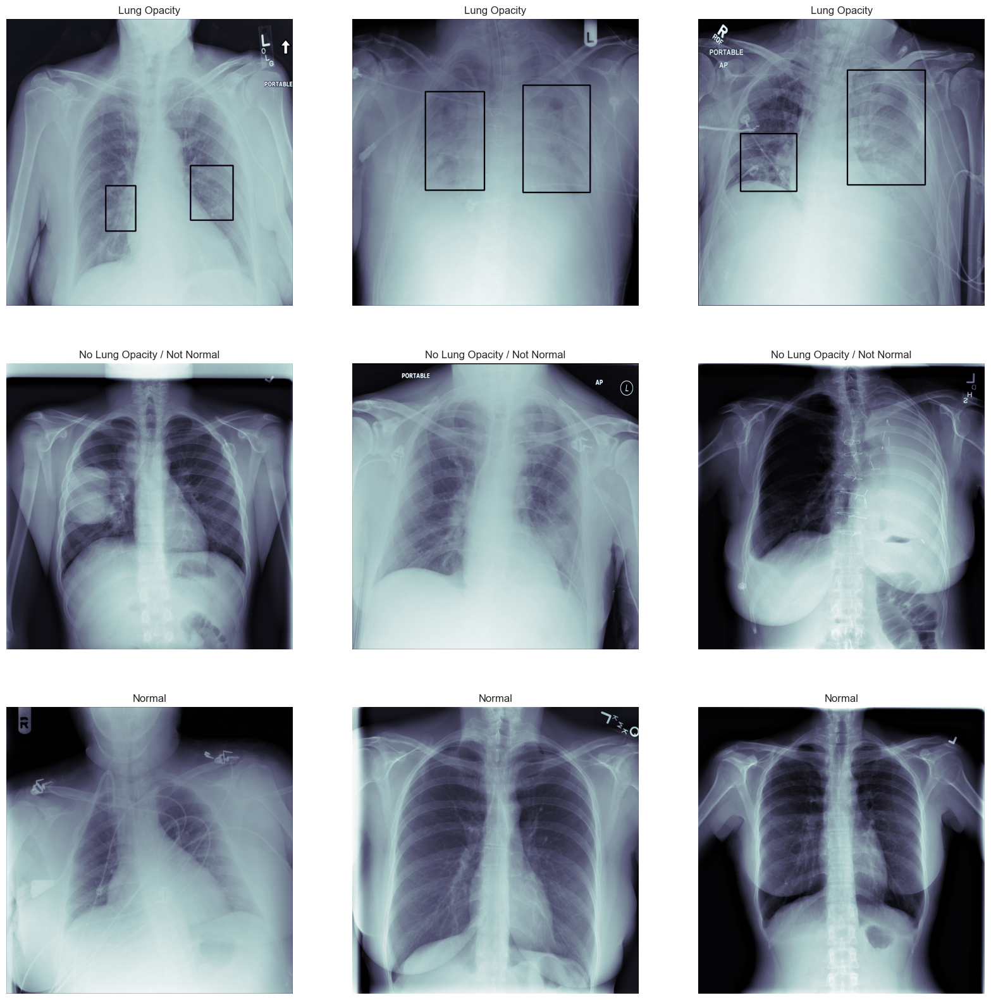

In [51]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def draw_boxes(image, box, scale_factor):
    # scale coordinates
    x = int(box[0] * scale_factor)
    y = int(box[1] * scale_factor)
    w = int(box[2] * scale_factor)
    h = int(box[3] * scale_factor)
        
    cv2.rectangle(image, (x, y), (x+w, y+h), color=0, thickness=int(3* scale_factor+0.5))
        
    return image
# get some sample images from each class
sample_patients = class_info.groupby('class')['patientId'] \
                            .apply(lambda x: list(np.random.choice(x, 3, replace=False))) \
                            .to_dict()

# define scale factor for DICOM Images
scale_factor = 1024 / 1024

# initialize subplots in a grid 3x3
fig, ax = plt.subplots(3, 3, figsize=(20,20))

for i, cls in enumerate(['Lung Opacity', 'No Lung Opacity / Not Normal', 'Normal']):
    for j in range(3):
        patientId = sample_patients[cls][j]
        dcm_file = f'{train_images_path}/{patientId}.dcm'
        im = dcm2rgb(dcm_file)
        
        if cls == 'Lung Opacity':
            boxes = train_anno_dict.get(patientId)
            if boxes is not None:
                for box in boxes:
                    im = draw_boxes(im, box, scale_factor)

        ax[i, j].imshow(im, cmap=plt.cm.bone)
        ax[i, j].axis('off')
        ax[i, j].set_title(cls)

plt.show()


In [52]:
import os

def load_image(patientId, metadata_df):
    # Get the folder name for the given patientId
    folder_name = metadata_df.loc[metadata_df['patientId'] == patientId, 'folder'].values[0]

    # Create the full path to the image
    image_path = os.path.join(folder_name, patientId + '.png')

    # Load the image (you'll need an appropriate library like PIL or matplotlib to do this)
    # For example, using PIL:
    from PIL import Image
    img = Image.open(image_path)
    img = np.array(img)
    return img


####  Step 5: Display PNG images with bounding box. [ 5 points ]

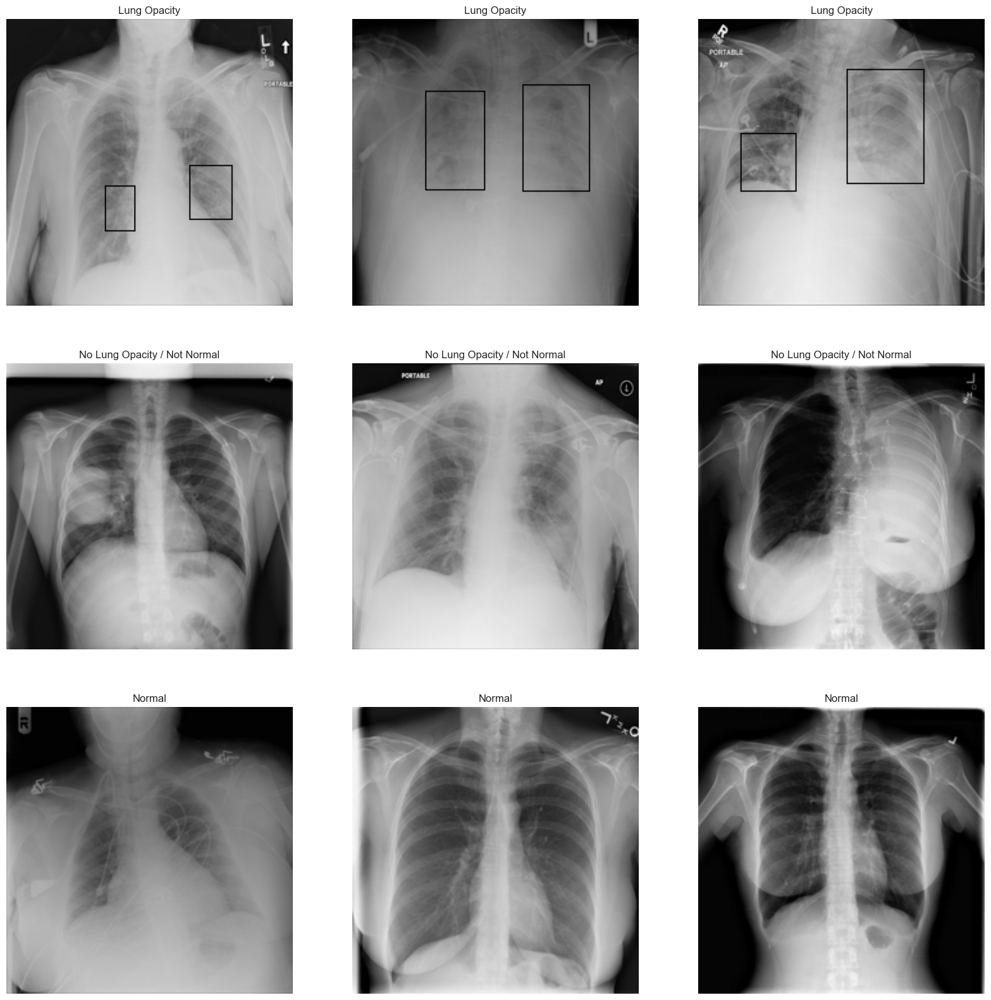

In [53]:

# define scale factor for DICOM Images
scale_factor = image_size / 1024

# initialize subplots in a grid 3x3
fig, ax = plt.subplots(3, 3, figsize=(20,20))

for i, cls in enumerate(['Lung Opacity', 'No Lung Opacity / Not Normal', 'Normal']):
    for j in range(3):
        patientId = sample_patients[cls][j]
        
        im = load_image(patientId, metadata_df)
        
        if cls == 'Lung Opacity':
            boxes = train_anno_dict.get(patientId)
            if boxes is not None:
                for box in boxes:
                    im = draw_boxes(im, box, scale_factor)

        ax[i, j].imshow(im, cmap=plt.cm.bone)
        ax[i, j].axis('off')
        ax[i, j].set_title(cls)

plt.show()


## Observations

By visually comparing DICOM Images and the PNG images, they seem to be identical. All features seem to have been captured, despite rescaling and conversion

# MILESTONE 2 Work

## Brief about Input from Milestone 1
1. We created a metadata DataFrame to collect all the information provided in one place.
2. Converted DICOM images and stored them in a directory structure suitable for the "flow from directory" method of ImageDataGenerator.
3. Ran base CNN models to study the performance parameters obtained from the images provided.
4. As the dataset size is huge and training the models on all data proved to be difficult (the kernels were crashing), image conversion and the use of the "flow from directory" method were explored and successfully demonstrated.

## Milestone 2
### Following additions and actions were taken in the Milestone 2 submission:
1. DICOM images were studied in detail, and image header data was researched for gaining insights into whether any preprocessing is required to improve efficiency and eliminate sources of errors.
2. More data from the image header was added to the metadata DataFrame.
3. This necessitated further improvements to the EDA section. The view position was found to have a significant influence on bounding box location distribution. The relation was studied, and research indicated that CNNs are able to account for the difference during training. Other parameters like pixel spacing, bit allocated, modality have no significant influence on the result. The DICOM data is already preprocessed and stored as lossy JPEG format in our case. The MONOCHROME2 parameter indicates that the minimum pixel value is intended to be shown as black; hence, this information was used to suitably standardize the image during conversion by using the following code:
    **im = (im - np.min(im)) / (np.max(im) - np.min(im))**
    
4. Improvements to the base model were made by changing architecture, hyperparameter tuning, threshold management.
5. Additional models were developed for:
    a. Transfer learning models based on VGG16
    b. Object Detection - Mask predictions (based on ResNet architecture used in Mask R-CNN)
    c. Object Detection - Mask and bounding box predictions (Using Mask R-CNN Matterport derived implementation)
6. As for the medical field, it was recognized that Recall is an important parameter; hence, the models were trained exclusively for Recall, as well as Recall and Accuracy. Further, the effect of the threshold on performance was also studied.

### Following table indicates all the models trained:

|    | List of Models trained below                                               |
|:----|:----------------------------------------------------------------------------|
| **A)** | **Using a Limited Number of DICOM Images in Memory (14,000 images used):** |
| 1  | CNN for classification - with Recall                                      |
| 2  | CNN for classification - with Recall & Accuracy                           |
| 3  | VGG16 for classification with Recall & Accuracy                           |
| 4  | VGG16 for classification with Recall                                      |
| 5  | Mask R-CNN, ResNet-based for mask prediction                              |
| **B)** | **Using All Images Converted to PNG Format (All images used):**           |
| 6  | VGG16 for classification - with Recall & Accuracy                         |
| 7  | CNN for classification - with Recall                                      |
| 8  | Mask R-CNN for classification, mask, and bounding box prediction          |

#### Conclusion
1. The last section discusses the results obtained and the scope of improvement.


## A) with limited Number Dicom images used directly for training and evaluation
This method involves reading the DICOM training images in memory and convert the numpy array and use that for training. It was observed that memory requirement is high and the kernel usually dies. Hence only limited number of (14000) images are loaded. The decision was made to go for binary classification based on **Target** column of stage_2_train_labels.csv

In [21]:
# Usual Imports
import tensorflow as tf
import numpy as np
import pydicom
import os

from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

from keras import backend as K
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras import losses, optimizers

from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Layer, Convolution2D, Dense, RandomRotation, RandomFlip, Resizing, Rescaling
from tensorflow.keras.layers import Concatenate, UpSampling2D, Conv2D, Reshape, GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Dense, Activation, Flatten, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import Input, ReLU, AveragePooling2D, Flatten
from tensorflow.keras.layers import SeparableConv2D, MaxPool2D
from tensorflow.keras.layers import Dropout, RandomRotation

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler

from tensorflow.keras.regularizers import l2,  l1  # L2 regularization
from tensorflow.keras.metrics import Recall

from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [22]:
# Read the Metadat prepared from the provided csv files
metadatfilename = 'Metadata'+id_str+'.csv'
metadata_df = pd.read_csv(metadatfilename)

In [23]:
# Following code sets various parameters for model building. 
# This gives us flexibility of trying binary or multiclass classification with minimal changes to the code
# Only setting n_classes and c_mode gives us the flexibility of building the models witth appropriate parameters 

classes2use = 'label'+str(n_classes)
c_mode='binary'

# Select model paarameeters based on the selected training requirements

if n_classes == 2:
    if c_mode == 'binary':
        lbl = lbl2
        cls_mode = 'binary'
        actvn = 'sigmoid'
        lss = 'binary_crossentropy'
        num_classes  = 1
    else:
        lbl = lbl2
        cls_mode = 'categorical'
        actvn = 'softmax'
        lss = 'categorical_crossentropy'
        num_classes  = 2
else:
    lbl = lbl3
    cls_mode = 'categorical'
    actvn = 'softmax'
    lss = 'categorical_crossentropy'
    num_classes  = 3
    
# code below can also run for greyscale or color images
n_channels = len(set_color)


In [24]:
# Filter metadata to get only the training examples
train_metadata = metadata_df[metadata_df['set_name'] != 'test']

In [25]:
# Filter metadata to get only first 14000 training examples
train_metadata  = train_metadata[:14000]

In [26]:
# Class distributions in the training data
train_metadata[classes2use].value_counts()

0.0    10913
1.0     3087
Name: label2, dtype: int64

In [29]:
len(train_metadata)

14000

In [30]:
# Rescale annotation from 1024 to current image size
def rescale_annotations(annotations, scale_factor):
    rescaled_annotations = []
    for annotation in annotations:
        # Assuming annotation is a bounding box represented as (x, y, width, height)
        x, y, width, height = annotation
        # Rescale the coordinates using the scale factor
        new_x = x * scale_factor
        new_y = y * scale_factor
        new_width = width * scale_factor
        new_height = height * scale_factor
        rescaled_annotations.append((int(new_x), int(new_y), int(new_width), int(new_height)))
    return rescaled_annotations

In [31]:
# Extract the image data from the dicom images and convert it to numpy array, resize it store it in imgs
import cv2
ALPHA = 1
IMAGE_HEIGHT = image_size
IMAGE_WIDTH = image_size
scale_factor = image_size/ORIG_SIZE

X = []
annot = []
masks = np.zeros((int(train_metadata.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH, 1))  # Add an additional dimension for channel

for index, patid in enumerate(tqdm(train_metadata['patientId'])):
    # Read Images and populate them and load them in memory
    im = pydicom.dcmread(os.path.join(train_images_path, f"{patid}.dcm"))
    im = im.pixel_array
    im = np.stack((im,) * n_channels, -1)

    im = np.array(im).astype(np.uint8)
    im = cv2.resize(im, (image_size, image_size), interpolation = cv2.INTER_LINEAR)

    # Standardize the image (for both grayscale and RGB)
    im = (im - np.min(im)) / (np.max(im) - np.min(im))
   
    X.append(im)
    
    # Read & Resize boxes and populate them and load them in memory
    boxes = train_anno_dict.get(patid, [])
    ann = rescale_annotations(boxes, scale_factor)
    annot.append(ann)
    for box in ann:
        x1 = box[0]
        y1 = box[1]
        x2 = box[2] + x1
        y2 = box[3] + y1
        masks[index][y1:y2, x1:x2, 0] = 1  # Add the mask to the corresponding channel

100%|███████████████████████████████████████████████████████████████████████████| 14000/14000 [01:30<00:00, 154.96it/s]


In [32]:
# Create X and Y for training

#X = X.reshape((X.shape[0], X.shape[1], X.shape[2], n_channels))

X = np.array(X)

print(f"Train shape {X.shape}")

from tensorflow.keras.utils import to_categorical
if c_mode == 'binary':
    Y = train_metadata[classes2use]
else:
    Y = to_categorical(train_metadata[classes2use])
    
print("Target shape ", Y.shape)

print("Mask shape ", masks.shape)

Train shape (14000, 224, 224, 3)
Target shape  (14000,)
Mask shape  (14000, 224, 224, 1)


In [33]:
from sklearn.model_selection import train_test_split

# Split the data into temp training and test sets
X_train, X_test, Y_train, Y_test, Ym_train, Ym_test = train_test_split(
    X, Y, masks, test_size=0.2, random_state=42, stratify=Y, shuffle=True)


In [34]:
# Split the temporary training set into final train and validation sets
X_train, X_val, Y_train, Y_val, Ym_train, Ym_val = train_test_split(
    X_train, Y_train, Ym_train, test_size=0.25, random_state=42, stratify=Y_train, shuffle=True)


### Milestone 1- Step 6: Design, train and test basic CNN models for classification. (Improved as follows)
### Milestone 2- Step 1: Fine tune the trained basic CNN models for classification.
For improving the performance of the models following common actions were taken
1. Architecture of the constructed CNN models were tweeked
2. Binary classification with softmax output layer was selected
3. Recall and [Recall, Accuracy] metrics were tried for traiining the models.
4. Threshold management was also tried to improve the recall. 
5. Results for sample threshold are presentyed for each model
6. PR Curve and ROC and AUC also plotted

# 1. CNN for classification - with recall

In [35]:

img_dims = image_size
inputs = Input(shape=(img_dims, img_dims, n_channels))

# First conv block
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPool2D(pool_size=(2, 2))(x)

# Second conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)

# Third conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.2)(x)

# Fourth conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.3)(x)

# Fifth conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.4)(x)

# Sixth conv block
x = SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.5)(x)

# FC layer
x = Flatten()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(rate=0.7)(x)
x = Dense(units=256, activation='relu')(x)
x = Dropout(rate=0.5)(x)
x = Dense(units=128, activation='relu')(x)
x = Dropout(rate=0.3)(x)

# Output layer
output = Dense(units=num_classes, activation=actvn)(x)

# Creating model and compiling
model = tf.keras.Model(inputs=inputs, outputs=output)
model.compile(optimizer=Adam(learning_rate=0.0001), loss=lss, metrics=[Recall()])

model.summary()

Desc = 'CNN for classification - with recall'
Saved_Model = 'CNN- DICOM 224r.h5'
start_time = time()

# Callbacks
checkpoint = ModelCheckpoint(Saved_Model, save_best_only=True, save_weights_only=True, verbose =1)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, verbose=2, mode='min')
early_stop = EarlyStopping(monitor='val_loss', min_delta=0.1, patience=10, mode='min', restore_best_weights = True)

# Add data augmentation
datagen = ImageDataGenerator(rotation_range=0.05, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15)
datagen.fit(X_train)

history = model.fit(datagen.flow(X_train, Y_train, batch_size=batch_size), 
                  epochs = EPOCHS_SET, 
                  validation_data = (X_val, Y_val), callbacks=[checkpoint, lr_reduce, early_stop])
end_time = time()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 128)     3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 128)     147584    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 128)    0         
 )                                                               
                                                                 
 separable_conv2d (Separable  (None, 112, 112, 256)    34176     
 Conv2D)                                                         
                                                                 
 separable_conv2d_1 (Separab  (None, 112, 112, 256)    68096 

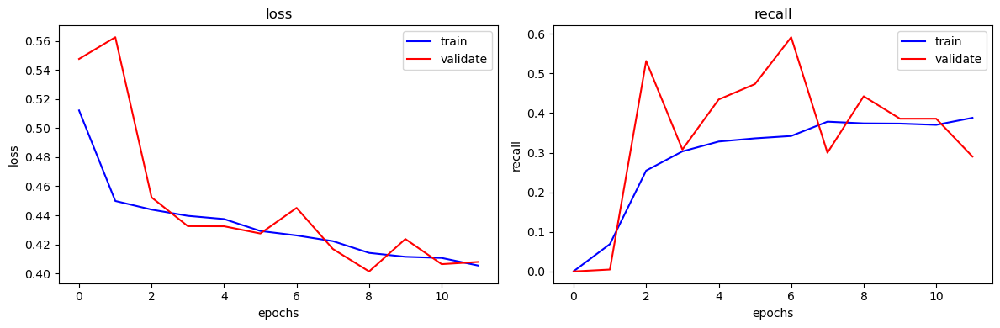

In [36]:
plot_loss_and_metrics(history)


88/88 [==============================] - 4s 42ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.91      0.78      0.84      2183
     Opacity       0.48      0.72      0.58       617

    accuracy                           0.77      2800
   macro avg       0.69      0.75      0.71      2800
weighted avg       0.81      0.77      0.78      2800


 Confusion Matrix


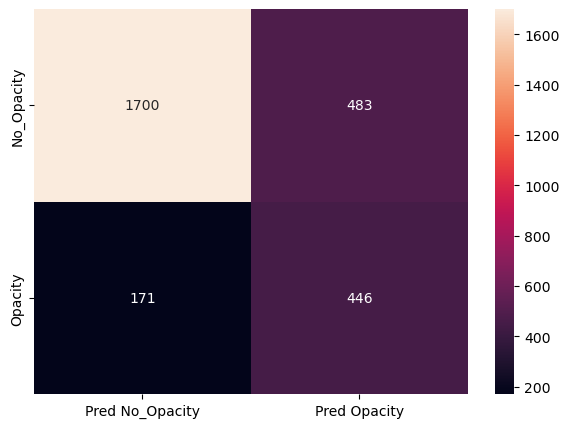

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.82      0.96      0.89      2183
     Opacity       0.68      0.28      0.39       617

    accuracy                           0.81      2800
   macro avg       0.75      0.62      0.64      2800
weighted avg       0.79      0.81      0.78      2800


 Confusion Matrix


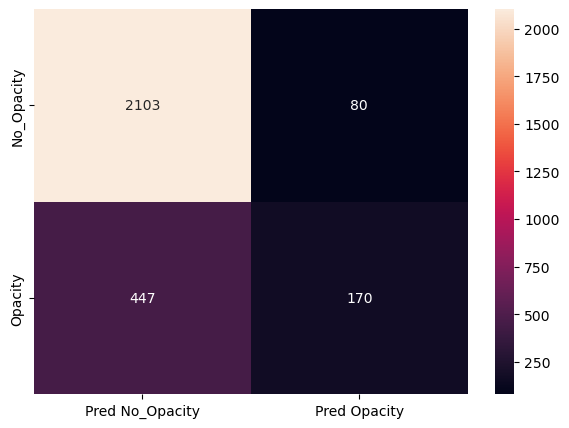

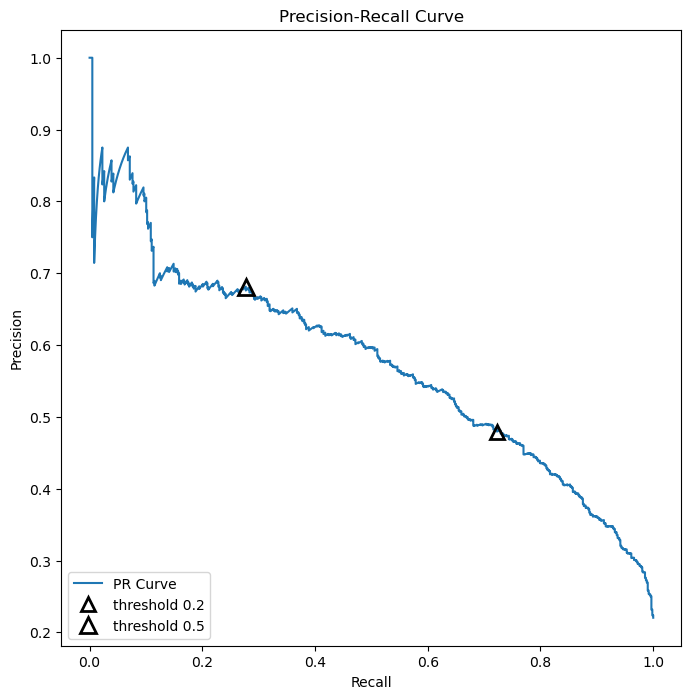

ROC_AUC score = 0.8310


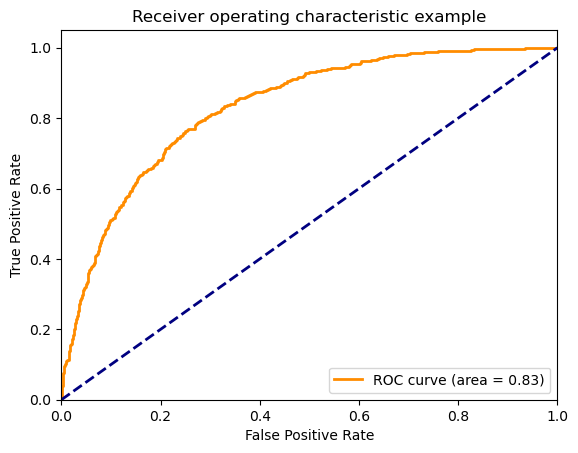

In [37]:
y_probs = model.predict(X_test)
sub_result_df = plot_precision_recall(y_probs, Y_test, [0.2, 0.5])
results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

In [38]:
results_df

,Description,Threshold,Accuracy,Precision,Recall,F1 Score,Model,Execution Time
0,CNN for classification - with recall,0.2,0.766429,0.480086,0.722853,0.576973,CNN- DICOM 224r.h5,560.580348
1,CNN for classification - with recall,0.5,0.811786,0.680000,0.275527,0.392157,CNN- DICOM 224r.h5,560.580348


# 2. CNN for classification - with recall & accuracy

In [39]:

ADJUSTED_IMAGE_SIZE = image_size
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, n_channels)

model = Sequential()
#model.add(RandomRotation(factor=0.15))
#model.add(Rescaling(1./255))
model.add(Conv2D(32, (3, 3), input_shape=input_shape)) # (3, 3) - conv kernel

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(64, (3, 3)))

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(128, (3, 3)))

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(256, (3, 3)))

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes))
model.add(Activation(actvn))

# Add data augmentation
datagen = ImageDataGenerator(rotation_range=2, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15)
datagen.fit(X_train)

model.compile(loss=lss,
              optimizer=Adam(learning_rate=0.001, decay=0.001/100),
              metrics=['accuracy', Recall()] # ,f1_m'accuracy' for i in range(num_classes), decay=0.004
             )
model.summary()

Desc = 'CNN for classification - with recall & accuracy'
Saved_Model = 'CNN- DICOM 224-ra.h5'
start_time = time()

# Callbacks

history = model.fit(datagen.flow(X_train, Y_train, batch_size=batch_size), 
                  epochs = EPOCHS_SET, 
                  validation_data = (X_val, Y_val),
                    callbacks=[
                        ModelCheckpoint(Saved_Model, save_best_only=True, verbose = 1, save_weights_only=True),
                        EarlyStopping(monitor = "val_loss", patience = 10, restore_best_weights = True),
                        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, mode='min')
                    ]
                   )
end_time = time()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 dropout_7 (Dropout)         (None, 111, 111, 32)      0         
                                                                 
 conv2d_3 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 activation_1 (Activation)   (None, 109, 109, 64)      0         
                                                        

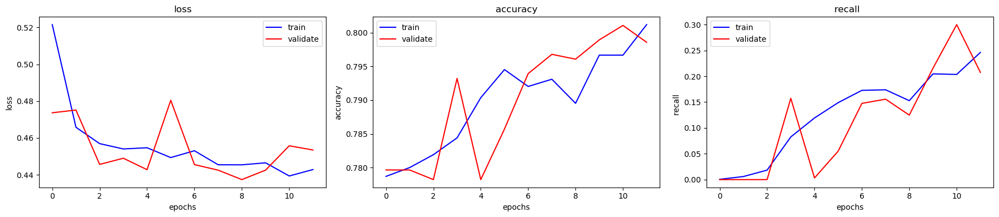

88/88 [==============================] - 1s 7ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.93      0.43      0.59      2183
     Opacity       0.31      0.89      0.45       617

    accuracy                           0.53      2800
   macro avg       0.62      0.66      0.52      2800
weighted avg       0.79      0.53      0.56      2800


 Confusion Matrix


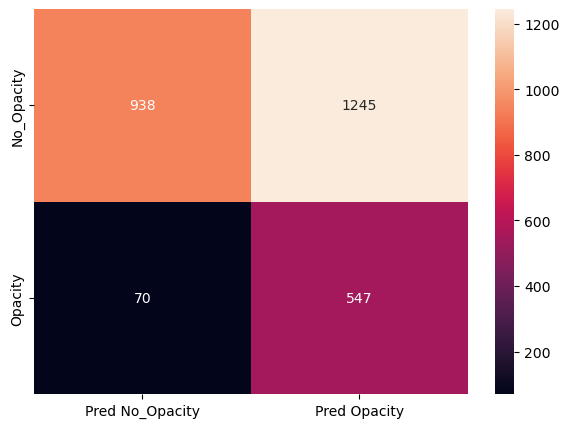

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.81      0.96      0.88      2183
     Opacity       0.63      0.21      0.32       617

    accuracy                           0.80      2800
   macro avg       0.72      0.59      0.60      2800
weighted avg       0.77      0.80      0.76      2800


 Confusion Matrix


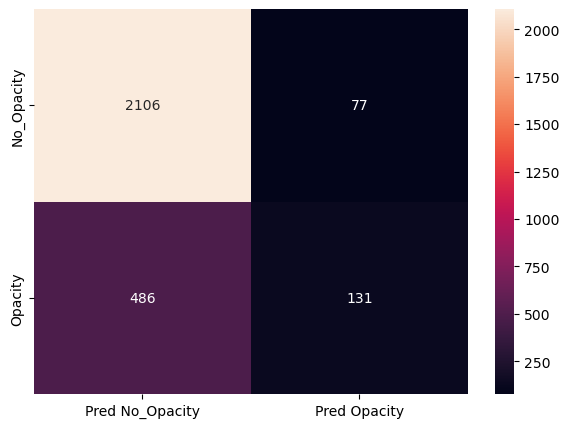

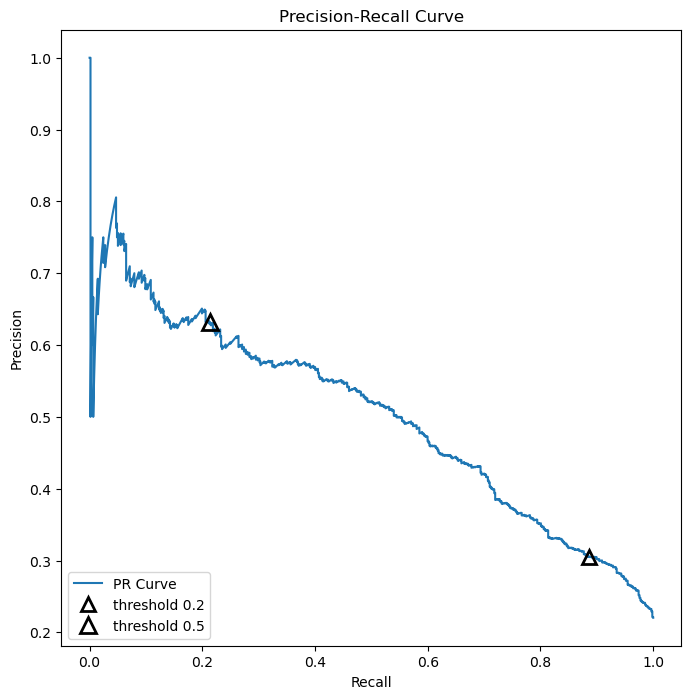

ROC_AUC score = 0.7759


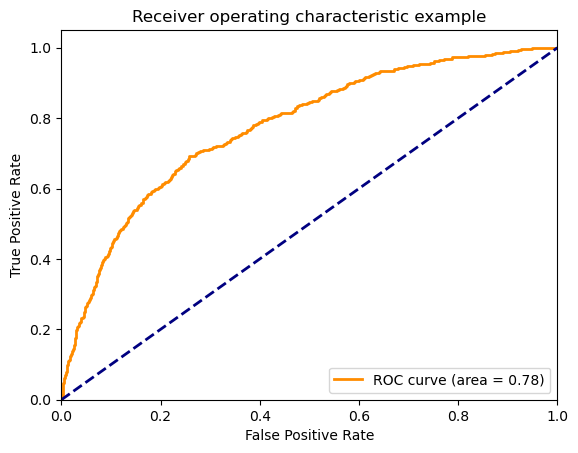

In [40]:
plot_loss_and_metrics(history)

y_probs = model.predict(X_test)
sub_result_df = plot_precision_recall(y_probs, Y_test, [0.2, 0.5])
results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

## Step 2: Apply Transfer Learning model for classification [4 points]

In [41]:
results_df

,Description,Threshold,Accuracy,Precision,Recall,F1 Score,Model,Execution Time
0,CNN for classification - with recall,0.2,0.766429,0.480086,0.722853,0.576973,CNN- DICOM 224r.h5,560.580348
1,CNN for classification - with recall,0.5,0.811786,0.680000,0.275527,0.392157,CNN- DICOM 224r.h5,560.580348
2,CNN for classification - with recall & accuracy,0.2,0.530357,0.305246,0.886548,0.454130,CNN- DICOM 224-ra.h5,495.309162
3,CNN for classification - with recall & accuracy,0.5,0.798929,0.629808,0.212318,0.317576,CNN- DICOM 224-ra.h5,495.309162


# 3. TRANSFER LEARNING for classification - VGG16 with recall & accuracy

In [42]:

ADJUSTED_IMAGE_SIZE = image_size
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, n_channels)
base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False
# Set last 3 layers to be trainable
for layer in base_model.layers[-3:]:
    layer.trainable = True

inputs = tf.keras.Input(shape=input_shape, name='inputLayer')
#x = augment(inputs)
pretrain_out = base_model(inputs, training=False)
x = layers.Flatten()(pretrain_out)
x = layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01))(x) # Add L2 regularization
x = layers.Dropout(0.5)(x)  # Add dropout
x = layers.Dense(num_classes, name='outputLayer')(x)
outputs = layers.Activation(activation=actvn, dtype=tf.float32, name='activationLayer')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005, decay=0.001/100),
              loss=lss,
              metrics=[Recall(), 'accuracy'])

# Add data augmentation
datagen = ImageDataGenerator(rotation_range=2, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15)
datagen.fit(X_train)

model.summary()

Desc = 'VGG16 with recall & accuracy'
Saved_Model = 'VGG16- DICOM 224 ra.h5'
start_time = time()

          
history = model.fit(datagen.flow(X_train, Y_train, batch_size=batch_size),
                    epochs = EPOCHS_SET,
                    validation_data=(X_val, Y_val),
                    callbacks=[
                        ModelCheckpoint(Saved_Model, save_best_only=True, verbose = 1, save_weights_only=True),
                        EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True, mode='min'),
                        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, mode='min')
                    ])

end_time = time()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dense_6 (Dense)             (None, 64)                1605696   
                                                                 
 dropout_12 (Dropout)        (None, 64)                0         
                                                                 
 outputLayer (Dense)         (None, 1)                 65        
                                                                 
 activationLayer (Activation  (None, 1)                0   

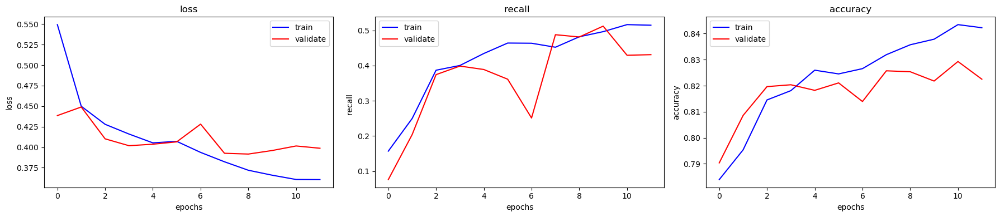

88/88 [==============================] - 3s 35ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.94      0.74      0.83      2183
     Opacity       0.47      0.82      0.60       617

    accuracy                           0.76      2800
   macro avg       0.70      0.78      0.71      2800
weighted avg       0.83      0.76      0.78      2800


 Confusion Matrix


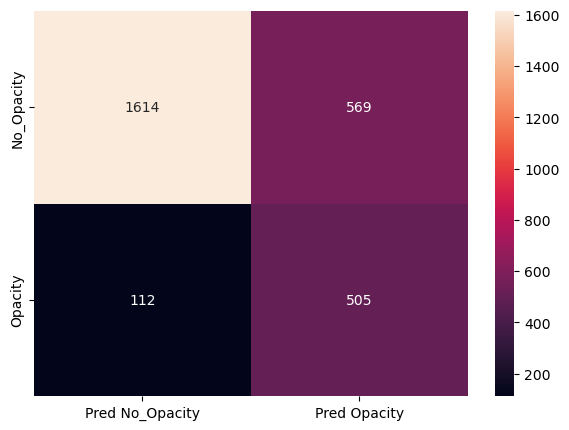

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.86      0.94      0.90      2183
     Opacity       0.67      0.45      0.54       617

    accuracy                           0.83      2800
   macro avg       0.77      0.70      0.72      2800
weighted avg       0.82      0.83      0.82      2800


 Confusion Matrix


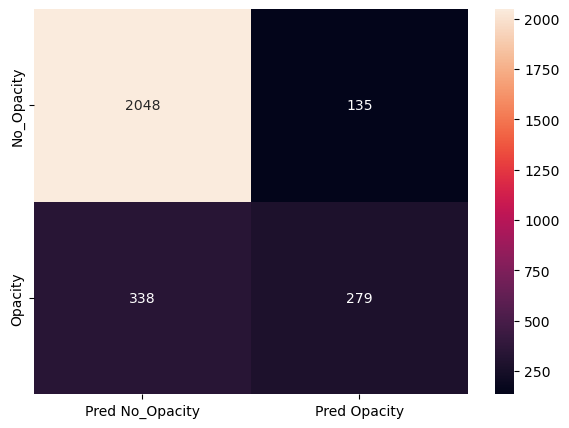

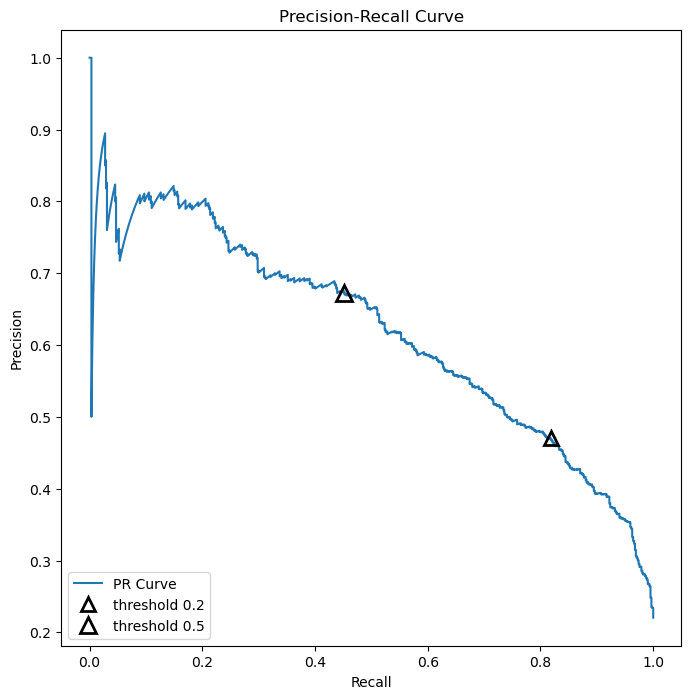

ROC_AUC score = 0.8548


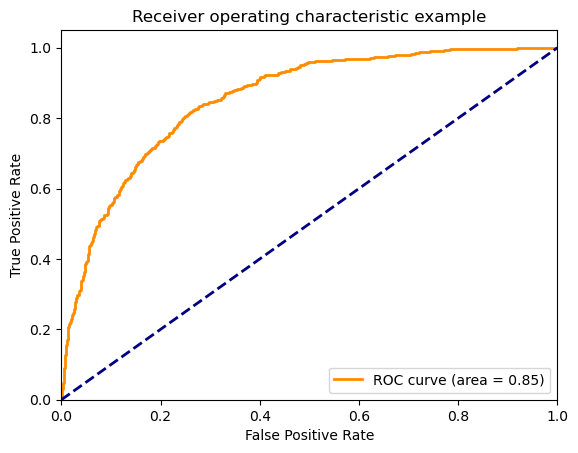

In [43]:
plot_loss_and_metrics(history)

y_probs = model.predict(X_test)
sub_result_df = plot_precision_recall(y_probs, Y_test, [0.2, 0.5])
results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

# 4. TRANSFER LEARNING for classification - VGG16 with recall

In [44]:
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
ADJUSTED_IMAGE_SIZE = image_size
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, n_channels)
base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, BatchNormalization): # set BatchNorm layers as not trainable
        layer.trainable = False

inputs = tf.keras.Input(shape=input_shape, name='inputLayer')
#x = augment(inputs)
pretrain_out = base_model(inputs, training=False)
x = layers.Flatten()(pretrain_out)
x = layers.Dense(64, activation='relu', kernel_regularizer=l2(0.01))(x) # Add L2 regularization
x = layers.Dropout(0.5)(x)  # Add dropout
x = layers.Dense(num_classes, name='outputLayer')(x)

outputs = layers.Activation(activation=actvn, dtype=tf.float32, name='activationLayer')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
              loss=lss,
              metrics=[Recall()])

# Add data augmentation
datagen = ImageDataGenerator(rotation_range=2, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15)#
datagen.fit(X_train)

model.summary()

Desc = 'VGG16 with recall'
Saved_Model = 'VGG16- DICOM 224 r.h5'
start_time = time()

history = model.fit(datagen.flow(X_train, Y_train, batch_size=16),
                    epochs = EPOCHS_SET,
                    validation_data=(X_val, Y_val),
                    callbacks=[
                        ModelCheckpoint(Saved_Model, save_best_only=True, verbose = 1, save_weights_only=True),
                        EarlyStopping(monitor="val_loss", patience=7, restore_best_weights=True, mode='min'),
                        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
                    ])
end_time = time()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 dense_7 (Dense)             (None, 64)                1605696   
                                                                 
 dropout_13 (Dropout)        (None, 64)                0         
                                                                 
 outputLayer (Dense)         (None, 1)                 65        
                                                                 
 activationLayer (Activation  (None, 1)                0   

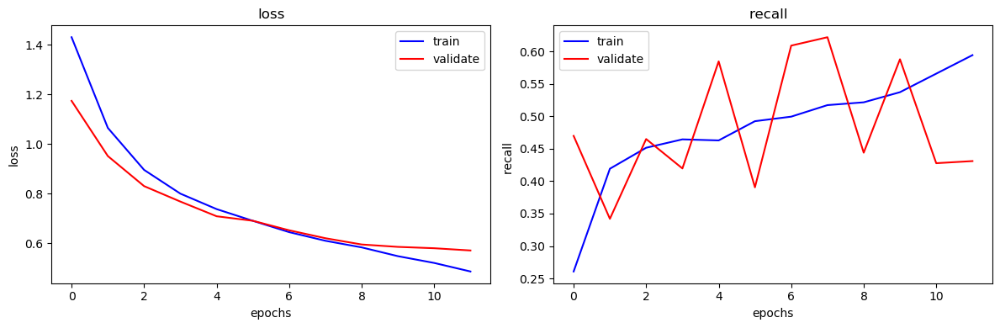

88/88 [==============================] - 3s 35ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.91      0.85      0.88      2183
     Opacity       0.56      0.71      0.63       617

    accuracy                           0.82      2800
   macro avg       0.74      0.78      0.75      2800
weighted avg       0.83      0.82      0.82      2800


 Confusion Matrix


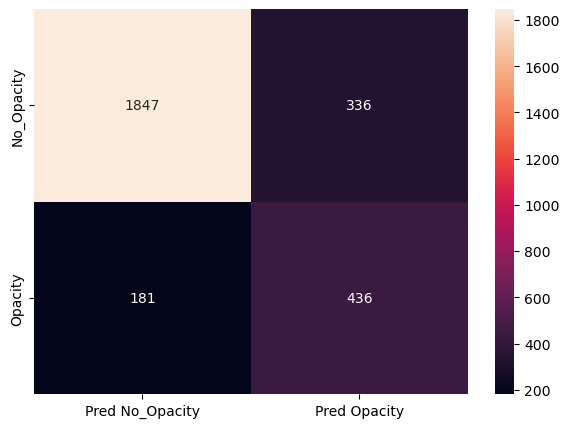

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.86      0.95      0.90      2183
     Opacity       0.73      0.46      0.56       617

    accuracy                           0.84      2800
   macro avg       0.79      0.70      0.73      2800
weighted avg       0.83      0.84      0.83      2800


 Confusion Matrix


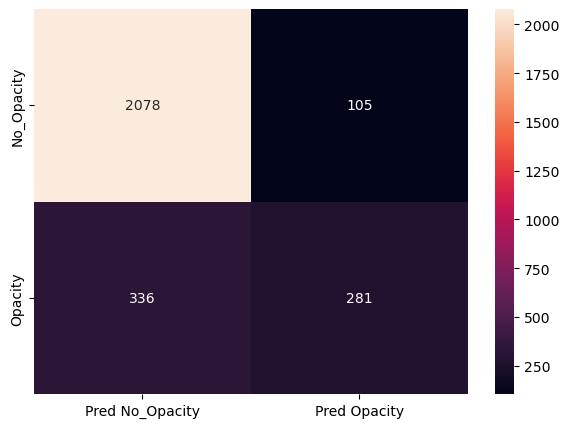

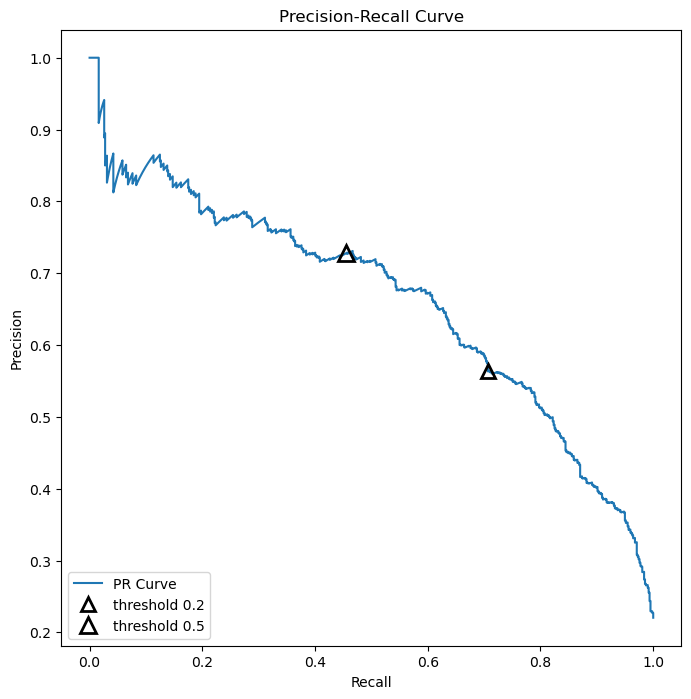

ROC_AUC score = 0.8690


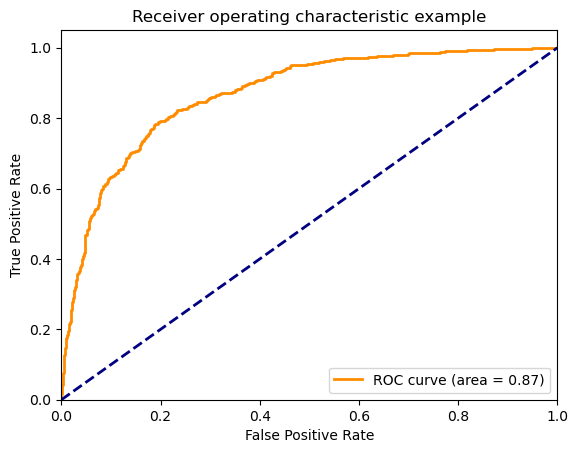

In [45]:
plot_loss_and_metrics(history)

y_probs = model.predict(X_test)
sub_result_df = plot_precision_recall(y_probs, Y_test, [0.2, 0.5])

results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

## Step  3:  Design,  train  and  test  RCNN  &  its  hybrids  based  object  detection  models

# 5. Object Detection- Mask Prediction

In [46]:
# Visualise the masks

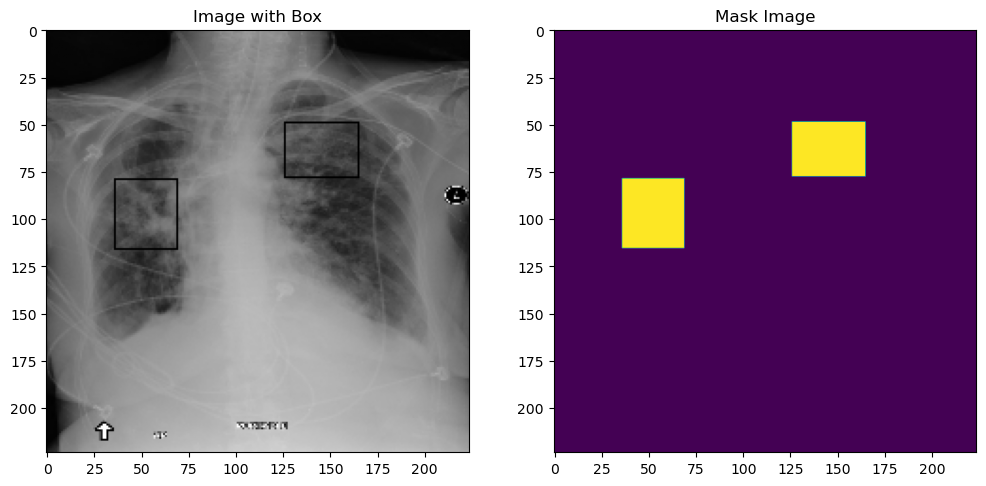

In [47]:
import matplotlib.pyplot as plt
import copy
# Start the plot
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot the Original image
imx = copy.deepcopy(X[3])
for box in annot[3]:
    x1 = int(box[0])
    y1 = int(box[1])
    x2 = int(box[2] + x1)
    y2 = int(box[3] + y1)
    imx = cv2.rectangle(imx, (x1, y1), (x2, y2), color=0, thickness=1)
axs[0].imshow(imx)
axs[0].set_title('Image with Box')
axs[0].grid(False)  # Remove grid lines

# Plot the Mask image
axs[1].imshow(masks[3])
axs[1].set_title('Mask Image')
axs[1].grid(False)  # Remove grid lines
# Show the plot
plt.show()


## MODEL Definition

Following code describes a convolutional neural network (CNN) that includes elements of a residual network (ResNet). 

The code contains downsample layers and residual blocks, making it more similar to a variant of the ResNet model rather than the Mask R-CNN. Specifically, it appears to have a ResNet-style architecture with additional batch normalization and leaky ReLU activation functions, as well as a final layer that applies a sigmoid activation function to a 1x1 convolution, followed by upsampling.

In [49]:
# create 1 downsample layer, each containing 4 layers in it
def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

# creates 1 residual layer, each containing 6 layers in it.
def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

# Model creator
# Depth = number of layers in the model
def create_network(input_size, channels, n_blocks=2, depth=4):
    # input layers - 2 layer
    inputs = keras.Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, n_channels))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    print("After Conv2D:", x.shape)

    # residual blocks (4*4 downsample + 4*2*6 resblock = 64 layers)
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        print(f"After downsample {d + 1}:", x.shape)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
            print(f"After resblock {d + 1}.{b + 1}:", x.shape)

    # output - 4 layers
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [50]:
# define iou or jaccard loss function
def iou_loss(y_true, y_pred):
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

# combine bce loss and iou loss
def iou_bce_loss(y_true, y_pred):
    return 0.25 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.75 * iou_loss(y_true, y_pred)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)  # Ensure predictions are binary (0 or 1)
    
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2])
    union = tf.reduce_sum(y_true + y_pred, axis=[1, 2]) - intersection

    iou = (intersection + tf.keras.backend.epsilon()) / (union + tf.keras.backend.epsilon())

    return tf.reduce_mean(iou)


In [51]:
from tensorflow import keras
# create network and compiler
model = create_network(input_size=(IMAGE_HEIGHT, IMAGE_WIDTH, n_channels), channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam',
              loss=iou_bce_loss,
              metrics=[Recall(), 'accuracy', mean_iou])
model.summary()

After Conv2D: (None, 224, 224, 32)
After downsample 1: (None, 112, 112, 64)
After resblock 1.1: (None, 112, 112, 64)
After resblock 1.2: (None, 112, 112, 64)
After downsample 2: (None, 56, 56, 128)
After resblock 2.1: (None, 56, 56, 128)
After resblock 2.2: (None, 56, 56, 128)
After downsample 3: (None, 28, 28, 256)
After resblock 3.1: (None, 28, 28, 256)
After resblock 3.2: (None, 28, 28, 256)
After downsample 4: (None, 14, 14, 512)
After resblock 4.1: (None, 14, 14, 512)
After resblock 4.2: (None, 14, 14, 512)
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                     

 leaky_re_lu_6 (LeakyReLU)      (None, 56, 56, 128)  0           ['batch_normalization_11[0][0]'] 
                                                                                                  
 conv2d_13 (Conv2D)             (None, 56, 56, 128)  147456      ['leaky_re_lu_6[0][0]']          
                                                                                                  
 batch_normalization_12 (BatchN  (None, 56, 56, 128)  512        ['conv2d_13[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_7 (LeakyReLU)      (None, 56, 56, 128)  0           ['batch_normalization_12[0][0]'] 
                                                                                                  
 conv2d_14 (Conv2D)             (None, 56, 56, 128)  147456      ['leaky_re_lu_7[0][0]']          
          

 )                                                                                                
                                                                                                  
 batch_normalization_21 (BatchN  (None, 14, 14, 512)  2048       ['max_pooling2d_13[0][0]']       
 ormalization)                                                                                    
                                                                                                  
 leaky_re_lu_16 (LeakyReLU)     (None, 14, 14, 512)  0           ['batch_normalization_21[0][0]'] 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 14, 14, 512)  2359296     ['leaky_re_lu_16[0][0]']         
                                                                                                  
 batch_normalization_22 (BatchN  (None, 14, 14, 512)  2048       ['conv2d_23[0][0]']              
 ormalizat

In [52]:
# cosine learning rate annealing
# changes learning rate based on the number of epocs passed


def cosine_annealing(x):
    lr = 0.0007
    epochs = EPOCHS_SET
    return lr* (np.cos(np.pi*x/epochs)+1.) /2

learning_rate = LearningRateScheduler(cosine_annealing)

Desc = 'Object Detection- Mask R-CNN'
Saved_Model = 'Mask R-CNN- DICOM 224.h5'

# Saves training time once the best model is achieved.
checkpoint = ModelCheckpoint(Saved_Model, verbose = 1, save_best_only = True, save_weights_only=True)

# Keep monitoring val_loss to see if there is any improvement.
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.0005, patience=15, 
                                                  restore_best_weights=True, verbose=1, mode='auto')

# Add data augmentation
datagen = ImageDataGenerator(rotation_range=2, zoom_range=0.15, width_shift_range=0.15, height_shift_range=0.15)#
datagen.fit(X_train)


In [53]:
start_time = time()
#training the model
history = model.fit(datagen.flow(X_train, Ym_train, batch_size=batch_size),
                    epochs = EPOCHS_SET,
                    validation_data=(X_val, Ym_val),
                    callbacks=[learning_rate, checkpoint, early_stopping])
end_time = time()


Epoch 1/12
525/525 [==============================] - ETA: 0s - loss: 0.7268 - recall_4: 0.2309 - accuracy: 0.9471 - mean_iou: 0.5168
Epoch 1: val_loss improved from inf to 0.68662, saving model to Mask R-CNN- DICOM 224.h5
525/525 [==============================] - 49s 90ms/step - loss: 0.7268 - recall_4: 0.2309 - accuracy: 0.9471 - mean_iou: 0.5168 - val_loss: 0.6866 - val_recall_4: 0.4514 - val_accuracy: 0.9404 - val_mean_iou: 0.5348 - lr: 7.0000e-04
Epoch 2/12
525/525 [==============================] - ETA: 0s - loss: 0.7001 - recall_4: 0.3024 - accuracy: 0.9508 - mean_iou: 0.5718
Epoch 2: val_loss did not improve from 0.68662
525/525 [==============================] - 44s 84ms/step - loss: 0.7001 - recall_4: 0.3024 - accuracy: 0.9508 - mean_iou: 0.5718 - val_loss: 0.6913 - val_recall_4: 0.5337 - val_accuracy: 0.9274 - val_mean_iou: 0.4805 - lr: 6.8807e-04
Epoch 3/12
525/525 [==============================] - ETA: 0s - loss: 0.6821 - recall_4: 0.3362 - accuracy: 0.9553 - mean_iou: 0

In [54]:
print("validation accuracy and IOU ", model.evaluate(X_test, Ym_test)) 

88/88 [==============================] - 3s 38ms/step - loss: 0.5967 - recall_4: 0.4755 - accuracy: 0.9671 - mean_iou: 0.7350
validation accuracy and IOU  [0.596737802028656, 0.47545185685157776, 0.9671436548233032, 0.7349817156791687]


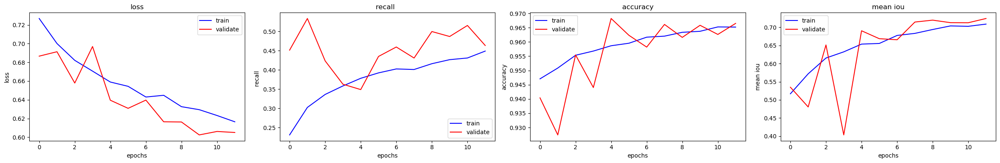

In [55]:
plot_loss_and_metrics(history)


88/88 [==============================] - 3s 35ms/step
Threshold: 0.2
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.90      0.85      0.88      2183
     Opacity       0.56      0.66      0.61       617

    accuracy                           0.81      2800
   macro avg       0.73      0.76      0.74      2800
weighted avg       0.82      0.81      0.82      2800


 Confusion Matrix


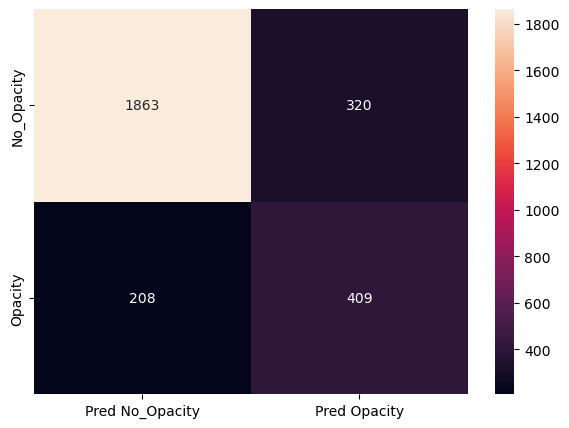

Threshold: 0.5
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.89      0.88      0.88      2183
     Opacity       0.59      0.60      0.59       617

    accuracy                           0.82      2800
   macro avg       0.74      0.74      0.74      2800
weighted avg       0.82      0.82      0.82      2800


 Confusion Matrix


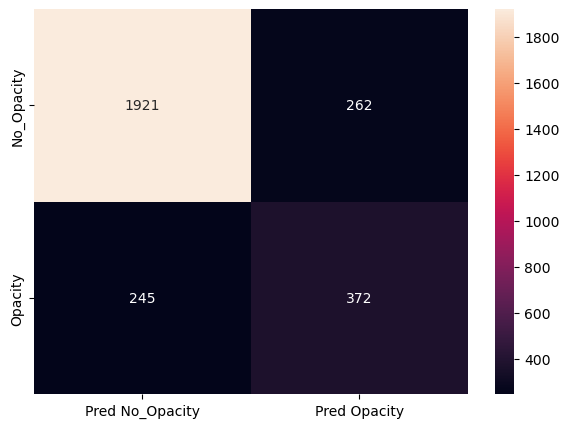

40, 0.2, 0.5445705025049319
100, 0.5, 0.6029173420416666


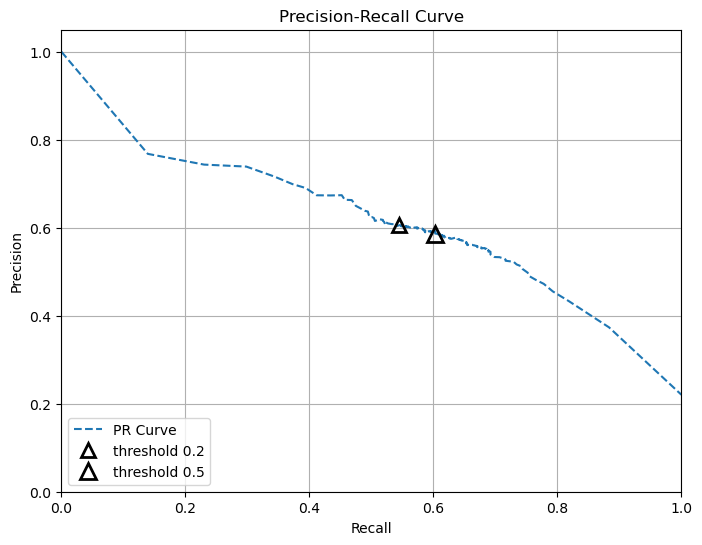

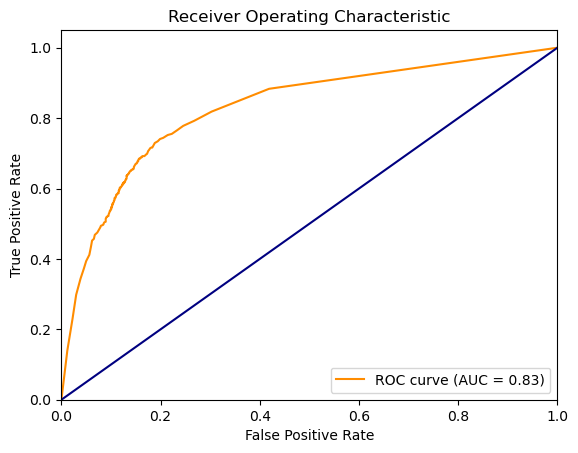

In [56]:
y_probs = model.predict(X_test)

sub_result_df = plot_precision_recall_mask(y_probs, Y_test, [0.2, 0.5])

results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

In [57]:
y_probs.shape, Ym_test.shape

((2800, 224, 224, 1), (2800, 224, 224, 1))

In [58]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random

# Assuming you have the following variables defined:
# x_val: input images
# y_val: ground truth masks
# model: your trained model
# IMAGE_HEIGHT, IMAGE_WIDTH: desired height and width of the images

# Function to resize an image and its mask
def resize_image_and_mask(image, mask):
    resized_image = cv2.resize(image, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH))
    resized_mask = cv2.resize(mask, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH))
    return resized_image, resized_mask

def generate_grid(x_val, y_val, model, n_rows=4, n_columns=4):
    num_images = n_rows * n_columns

    plt.figure(figsize=(5 * n_columns, 5 * n_rows))

    for i in range(num_images):
        nimg = random.randint(0, len(x_val) - 1)

        # Get the image, input mask, and ground truth mask
        sample_image = x_val[nimg]
        out_image = y_val[nimg]

        # Resize the image and ground truth mask
        image, out_image = resize_image_and_mask(sample_image, out_image)

        # Generate the predicted mask using the model
        pred_mask = cv2.resize(1.0 * (model.predict(np.array([image]), verbose=0)[0] > 0.65), (IMAGE_WIDTH, IMAGE_HEIGHT))

        # Prepare the image masks
        out_image_mask = np.zeros_like(image)
        pred_mask_mask = np.zeros_like(image)

        # Apply color to the masks: green for the ground truth, red for the predicted
        out_image_mask[..., 1] = out_image  # green
        pred_mask_mask[..., 0] = pred_mask  # red

        # Superimpose the masks onto the original image
        mask_gt = cv2.addWeighted(image, 0.7, out_image_mask, 0.3, 0)
        mask_pred = cv2.addWeighted(mask_gt, 0.7, pred_mask_mask, 0.3, 0)

        # Plot the predicted mask in a grid
        plt.subplot(n_rows, n_columns, i + 1)
        plt.imshow(mask_pred)
        plt.axis('off')  # turn off axis labels

    plt.tight_layout()
    plt.show()


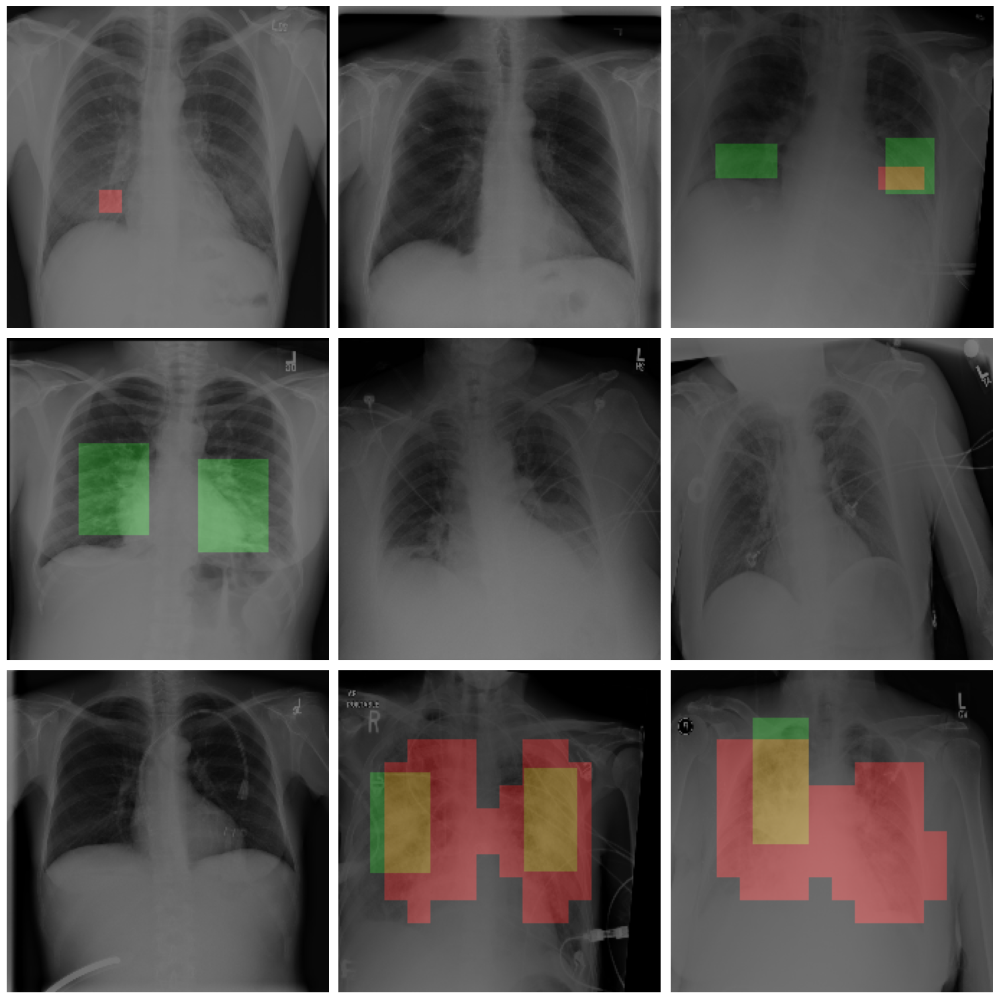

In [59]:
# Call the function to generate the horizontal row
generate_grid(X_test, Ym_test, model, 3, 3)

In [60]:
#save the model
model.save("maskrcnn_model_dcm_21k.h5")
results_df.to_csv('Results DICOM.csv', index = False)

In [61]:
metadata_df.to_csv(metadatfilename, index = False)

In [62]:
#!pip freeze > requirements.txt

In [63]:
# Free up the memory
del X_train, X_test, Y_train, Y_test, X_val, Y_val,Ym_train, Ym_test, Ym_val, masks, history, X, Y

## B) with converted Dicom images in PNG format used for training and evaluation

This method involves converting the DICOM training images to png format and relocating them folders suitable for flow_from_directory method in keras. This way training can be done all images without putting undue stress on memory requirements and make code unworkable. Here again we go for binary classification based on **Target** column of stage_2_train_labels.csv

## 6. VGG16 with PNG files used with flow from directory from Image Data Generator

In [64]:
# Create a dictionary to map set_color to color_mode
color_mode_dict = {'L': 'grayscale', 'RGB': 'rgb'}


In [65]:
# Importing Deep Learning Libraries

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen_train = ImageDataGenerator(rescale=1./255, zoom_range = 0.2, vertical_flip =True, rotation_range=2)# 

train_set = datagen_train.flow_from_directory(train_png_images_path,
                                              target_size = (image_size, image_size),
                                              color_mode = color_mode_dict[set_color],
                                              batch_size = batch_size,
                                              class_mode = cls_mode,
                                              classes = lbl,
                                              shuffle = True)

datagen_validation = ImageDataGenerator(rescale=1./255)

validation_set = datagen_validation.flow_from_directory(val_png_images_path,
                                              target_size = (image_size, image_size),
                                              color_mode = color_mode_dict[set_color],
                                              batch_size = batch_size,
                                              class_mode = cls_mode,#'categorical'
                                              classes = lbl,
                                              shuffle = True)

Found 21347 images belonging to 2 classes.
Found 5337 images belonging to 2 classes.


In [66]:

ADJUSTED_IMAGE_SIZE = image_size
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, n_channels)

base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

for layer in base_model.layers:
    layer.trainable = False
    
# Set last 3 layers to be trainable
for layer in base_model.layers[-3:]:
    layer.trainable = True

inputs = Input(shape=input_shape, name='inputLayer')
#x = augment(inputs)
pretrain_out = base_model(inputs, training=False)
x = layers.Flatten()(pretrain_out)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(num_classes, name='outputLayer')(x)
outputs = layers.Activation(activation=actvn, dtype=tf.float32, name='activationLayer')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=Adam(learning_rate=0.0005),
              loss=lss,
              metrics=['accuracy', Recall()])

model.summary()

Desc = 'VGG16- Improvements using PNG'
Saved_Model = 'VGG16- PNG 224-ra.h5'
start_time = time()

history = model.fit(train_set, validation_data= validation_set,
                    epochs = EPOCHS_SET,
                    callbacks=[
                        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, mode='min'),
                        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min'),
                        ModelCheckpoint(Saved_Model, verbose = 1, save_best_only = True, save_weights_only=True)

                    ])


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputLayer (InputLayer)     [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 64)                1605696   
                                                                 
 outputLayer (Dense)         (None, 1)                 65        
                                                                 
 activationLayer (Activation  (None, 1)                0         
 )                                                               
                                                           

In [67]:
datagen_validationtest = ImageDataGenerator(rescale=1./255)

validationtest_set = datagen_validationtest.flow_from_directory(val_png_images_path,
                                              target_size = (image_size, image_size),
                                              color_mode = color_mode_dict[set_color],
                                              batch_size = batch_size,
                                              class_mode = cls_mode,
                                              classes = lbl,
                                              shuffle = False)

Found 5337 images belonging to 2 classes.


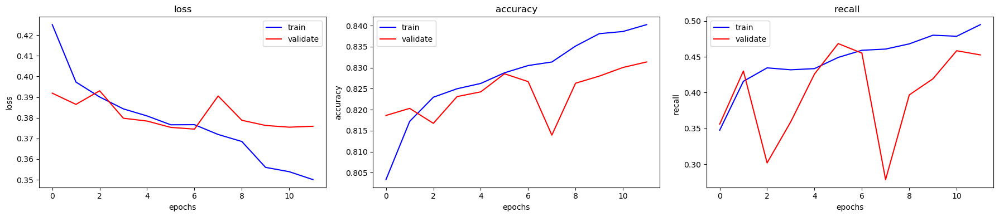

334/334 [==============================] - 6s 18ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.94      0.73      0.82      4135
     Opacity       0.47      0.84      0.60      1202

    accuracy                           0.75      5337
   macro avg       0.70      0.78      0.71      5337
weighted avg       0.83      0.75      0.77      5337


 Confusion Matrix


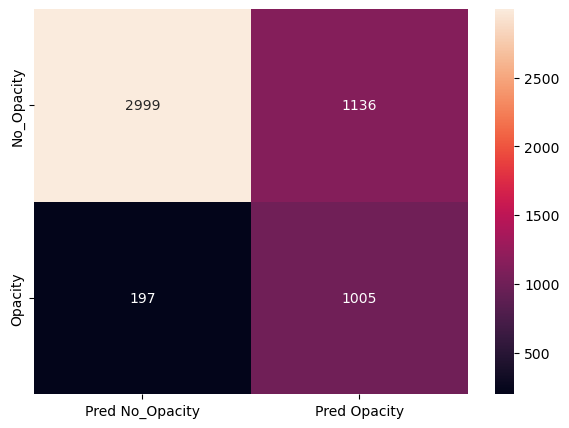

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.86      0.93      0.89      4135
     Opacity       0.67      0.46      0.54      1202

    accuracy                           0.83      5337
   macro avg       0.76      0.69      0.72      5337
weighted avg       0.81      0.83      0.81      5337


 Confusion Matrix


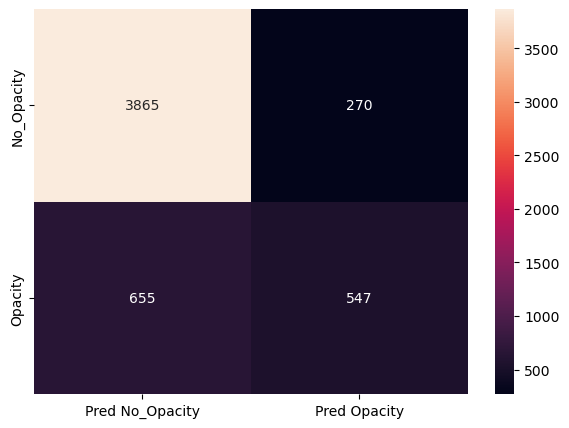

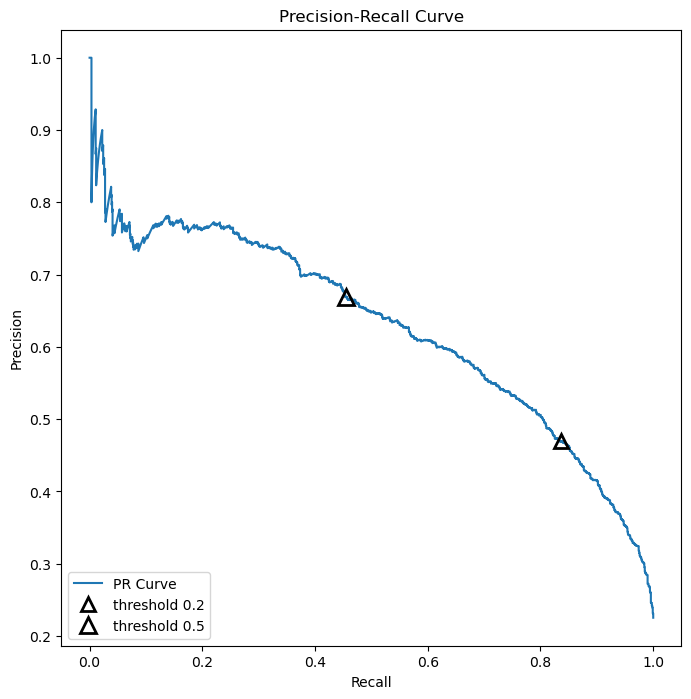

ROC_AUC score = 0.8598


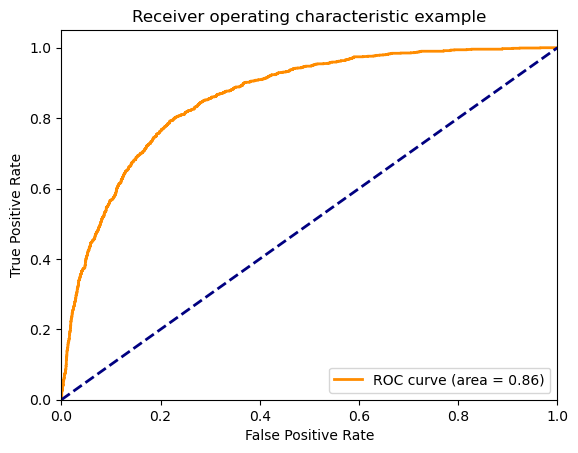

In [68]:
plot_loss_and_metrics(history)
y_probs = model.predict(validationtest_set)
y_test = validationtest_set.classes
sub_result_df = plot_precision_recall(y_probs, y_test, [0.2, 0.5])
results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)

## 7. CNN- Improvements using PNG

In [69]:

img_dims = image_size
inputs = Input(shape=(img_dims, img_dims, n_channels))

# First conv block
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
x = Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPool2D(pool_size=(2, 2))(x)

# Second conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)

# Third conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.2)(x)

# Fourth conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.3)(x)

# Fifth conv block
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=256, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.4)(x)

# Sixth conv block
x = SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = SeparableConv2D(filters=512, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.5)(x)

# FC layer
x = Flatten()(x)
x = Dense(units=512, activation='relu')(x)
x = Dropout(rate=0.7)(x)
x = Dense(units=256, activation='relu')(x)
x = Dropout(rate=0.5)(x)
x = Dense(units=128, activation='relu')(x)
x = Dropout(rate=0.3)(x)

# Output layer
output = Dense(units=num_classes, activation=actvn)(x)

# Creating model and compiling
model = tf.keras.Model(inputs=inputs, outputs=output)
model.compile(optimizer=Adam(learning_rate=0.0001), loss=lss, metrics=[Recall()])

model.summary()

Desc = 'CNN- Improvements using PNG'
Saved_Model = 'CNN- PNG 224-r.h5'
start_time = time()

# Callbacks
checkpoint = ModelCheckpoint(filepath=Saved_Model, save_best_only=True, save_weights_only=True, verbose=1)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, verbose=2, mode='min')
early_stop = EarlyStopping(monitor='val_loss', min_delta=0.0004, patience=5, restore_best_weights = True)

history = model.fit(train_set, 
                    validation_data = validation_set, epochs = EPOCHS_SET, 
                    callbacks=[checkpoint, lr_reduce, early_stop])
end_time = time()


Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_28 (Conv2D)          (None, 224, 224, 128)     3584      
                                                                 
 conv2d_29 (Conv2D)          (None, 224, 224, 128)     147584    
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 112, 112, 128)    0         
 g2D)                                                            
                                                                 
 separable_conv2d_10 (Separa  (None, 112, 112, 256)    34176     
 bleConv2D)                                                      
                                                                 
 separable_conv2d_11 (Separa  (None, 112, 112, 256)    6809

In [70]:
# Evaluate the model on the validation set
validation_loss, validation_metric = model.evaluate(validationtest_set)

print('Validation Loss:', validation_loss)
print('Validation Recall:', validation_metric)


334/334 [==============================] - 8s 25ms/step - loss: 0.4037 - recall_6: 0.6814
Validation Loss: 0.4037409722805023
Validation Recall: 0.6813644170761108


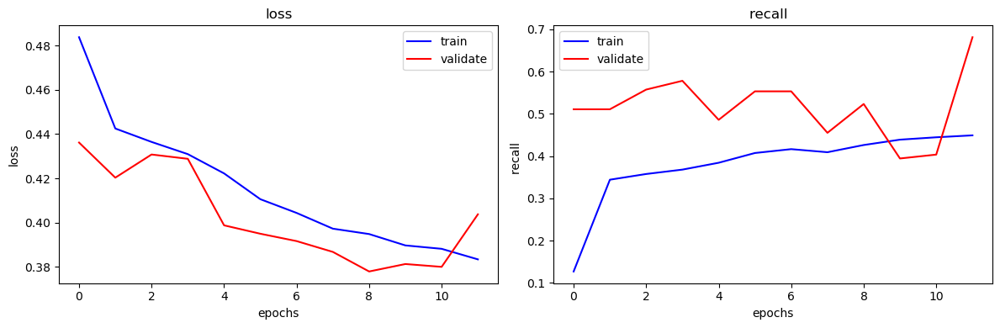

In [71]:
plot_loss_and_metrics(history)

334/334 [==============================] - 8s 24ms/step
Threshold = 0.2:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.96      0.55      0.70      4135
     Opacity       0.38      0.93      0.54      1202

    accuracy                           0.64      5337
   macro avg       0.67      0.74      0.62      5337
weighted avg       0.83      0.64      0.66      5337


 Confusion Matrix


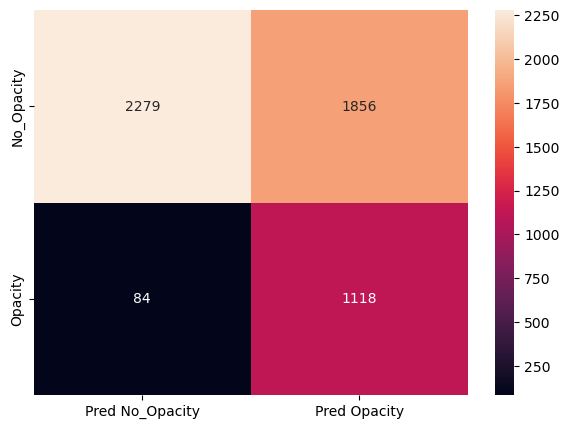

Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.90      0.85      0.87      4135
     Opacity       0.56      0.68      0.62      1202

    accuracy                           0.81      5337
   macro avg       0.73      0.76      0.75      5337
weighted avg       0.83      0.81      0.82      5337


 Confusion Matrix


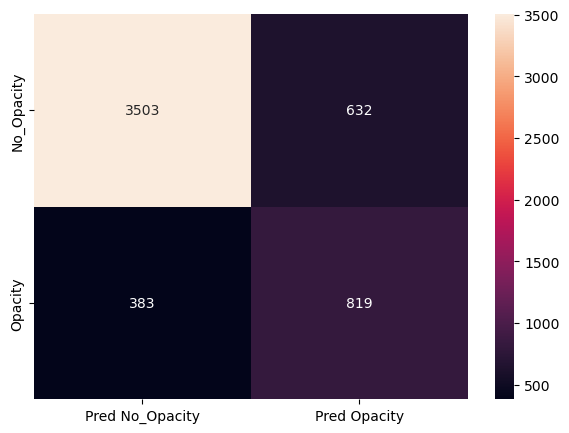

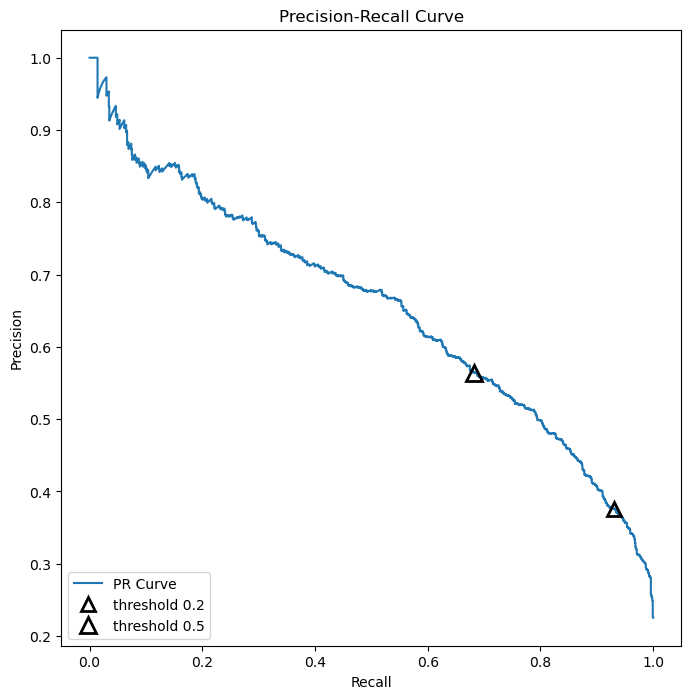

ROC_AUC score = 0.8626


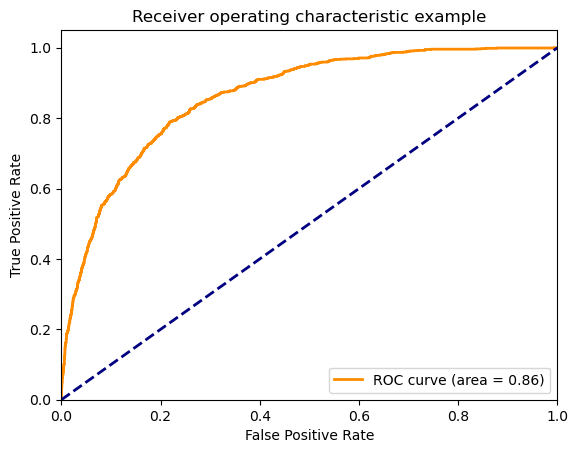

In [72]:
y_probs = model.predict(validationtest_set)
y_test = validationtest_set.classes
sub_result_df = plot_precision_recall(y_probs, y_test, [0.2, 0.5])
results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
model.save(Saved_Model)
results_df.to_csv('Results DICOM PNG.csv', index = False)

## Step  3:  Design,  train  and  test  RCNN  &  its  hybrids  based  object  detection  models  to  impose  the  bounding  box  or mask over the area of interest. [ 8 points ]

# 8. MASK R-CNN based on matterport derived implementation
### https://www.github.com/leekunhee/Mask_RCNN.git

In [101]:
# Clone Mask_RCNN- Uncomment the below code appropriately to install the package and weights

#!git clone https://www.github.com/leekunhee/Mask_RCNN.git

### Download COCO pre-trained weights
#import urllib.request

#url = "https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5"
#filename = "mask_rcnn_coco.h5"
#urllib.request.urlretrieve(url, filename)

# Installation note
# for image ugmentation
# conda install -c conda-forge imgaug 

# Notes on changes made to github code for habndling erros
# File - \anaconda3\envs\tf\Lib\site-packages\imgaug\augmenters\meta.py
# change np.bool to bool

# KE to KL in model.py in Mask_RCNN

# File - Mask_RCNN utils.py
# Change 1
# m = m.astype(float)  # convert boolean mask to float
# m = resize(m, mini_shape)  # resize mask
# m = m.round().astype(bool)  # round and convert back to boolean
# Change 2
# np.bool
# Change 3
# m = resize(m, mini_shape, order=0)  # resize mask


In [25]:
# Define constants
filename = "mask_rcnn_coco.h5"

DATA_DIR = ''

# Directory to save logs and trained model
ROOT_DIR = DATA_DIR 

MASK_RCNN_DIR = 'Mask_RCNN'

TRAIN_DIR = train_images_path
TEST_DIR = test_images_path

MODEL_DIR = ROOT_DIR

COCO_WEIGHTS_PATH = os.path.join(MASK_RCNN_DIR, filename)
COCO_MODEL_PATH = ROOT_DIR

Desc = 'Object Detection with bounding boxes- Mask R-CNN'
Saved_Model = 'mask_rcnn_pneumonia_XXXX.h5'
start_time = time()


In [26]:
import os 
import sys
import random
import math
import json
import glob
import copy
from imgaug import augmenters as iaa
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support as prf

# Import Mask RCNN
sys.path.append(os.path.join(ROOT_DIR, MASK_RCNN_DIR))  # To find local version of the library

from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

from tensorflow import keras

In [27]:
# Here we will use DICOM images for training
train_dicom_dir = os.path.join(DATA_DIR, train_images_path)
test_dicom_dir = os.path.join(DATA_DIR, test_images_path)

In [28]:
train_dicom_dir, test_dicom_dir, MODEL_DIR, COCO_WEIGHTS_PATH 

('stage_2_train_images',
 'stage_2_test_images',
 '',
 'Mask_RCNN\\mask_rcnn_coco.h5')

In [29]:
def get_dicom_fps(dicom_dir):
    # Create a glob pattern for .dcm files in the directory
    dicom_fps = glob.glob(dicom_dir+'/'+'*.dcm')
    # Return a list of file paths, removing any duplicates by converting to a set first
    return list(set(dicom_fps))

def parse_dataset(dicom_dir, anns):
    # Get a list of file paths for DICOM files in the directory
    image_fps = get_dicom_fps(dicom_dir)
    
    # Create a dictionary to hold the annotations for each image file
    # The key is the file path, and the value is an initially empty list
    image_annotations = {fp: [] for fp in image_fps}
    
    # For each annotation in the input DataFrame
    for index, row in anns.iterrows(): 
        # Create the file path for the associated image file
        fp = os.path.join(dicom_dir, row['patientId']+'.dcm')
        # Append the annotation to the list for this file path in the dictionary
        image_annotations[fp].append(row)
    
    # Return the list of file paths and the dictionary of annotations
    return image_fps, image_annotations


In [30]:
# load training labels dataset
anns = pd.read_csv(os.path.join(DATA_DIR, 'stage_2_train_labels.csv'))
anns.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [31]:
# find out unique images in the dataset
anns_Unique = anns.drop_duplicates(subset = ['patientId', 'Target'], keep = 'first')
anns_Unique.shape


(26684, 6)

In [32]:
# get image file path and corresponding annotations
image_fps, image_annotations = parse_dataset(train_dicom_dir, anns=anns)


In [33]:
# load 1 sample image for display purpose
ds = pydicom.read_file(image_fps[0]) # read dicom image from filepath 
image = ds.pixel_array # get image array

len(image_fps), len(image_annotations), len(anns)

(26684, 26684, 30227)

**Split the data into training and validation datasets that exctly macthes the dataset used for other models in the project**

In [34]:
def dataset_model(image_names, target_values):
    """
    Splits the given image names and target values into train, validation, and test sets.
    """

    # Split data into training and validation datasets
    # We use stratified sampling to ensure that the proportion of each class in both datasets is the same 
    # as in the original dataset
    image_fps_train, image_fps_val, targets_train, targets_val = train_test_split(
        image_names, 
        target_values, 
        stratify=target_values,
        shuffle=True,
        test_size=0.20, 
        random_state=42
    )

    # Further split the training dataset into training and test datasets
    image_fps_train, image_fps_test, _, _ = train_test_split(
        image_fps_train, 
        targets_train, 
        stratify=targets_train, 
        shuffle=True,
        test_size=0.20, 
        random_state=42
    )
    
    # Append the directory path to the filenames
    image_fps_train = [os.path.join(train_dicom_dir, x + '.dcm') for x in image_fps_train]
    image_fps_val = [os.path.join(train_dicom_dir, x + '.dcm') for x in image_fps_val]
    image_fps_test = [os.path.join(train_dicom_dir, x + '.dcm') for x in image_fps_test]
    
    # Print the number of images in each set
    print(len(image_fps_train), len(image_fps_val), len(image_fps_test))

    return image_fps_train, image_fps_val, image_fps_test


In [35]:
# Count the number of instances for each target value in the annotations dataframe
num_target_0 = len(anns_Unique[anns_Unique.Target==0])
num_target_1 = len(anns_Unique[anns_Unique.Target==1])

num_target_0, num_target_1


(20672, 6012)

In [36]:
# Split the dataset into training, validation, and testing sets
image_fps_train, image_fps_val, image_fps_test = dataset_model(anns_Unique['patientId'], anns_Unique['Target'])

# Print the number of instances in the training, validation, and testing sets
num_train, num_val, num_test = len(image_fps_train), len(image_fps_val), len(image_fps_test)

num_train, num_val, num_test


17077 5337 4270


(17077, 5337, 4270)

In [37]:
# Let's assume image_fps_train, image_fps_val, image_fps_test are your lists

sample_train = image_fps_train
sample_val = image_fps_val
sample_test = image_fps_test 

#random.sample(image_fps_test, 500)# used for testing
#EPOCHS_SET = 10
#num_train = 2500

In [38]:
# Define a dictionary with hyperparameters combinations for model tuning
hyper_paramters_comb = {
    'backbone': ['resnet50'],  # Backbone model to use
    'learning_rate': [0.004],  # Learning rate
    'batch_size': [batch_size],  # Batch size for training
    'epochs': [EPOCHS_SET],  # Number of epochs for training
    'det_min_conf': [0.9],  # Minimum confidence threshold for detection
    'det_nms_th': [0.6],  # Non-maximum suppression threshold for detection
    'rpn_nms_th': [0.5],  # Non-maximum suppression threshold for Region Proposal Network
    'steps_per_epoch': [num_train//batch_size],  # Number of steps per epoch
    'layers': ['heads']  # Which layers to train
}

# Convert the dictionary to a pandas DataFrame
hpc = pd.DataFrame(hyper_paramters_comb)

# Cast some columns to float32 data type for compatibility with model training
hpc['learning_rate'] = hpc['learning_rate'].astype(np.float32)
hpc['det_min_conf'] = hpc['det_min_conf'].astype(np.float32)
hpc['det_nms_th'] = hpc['det_nms_th'].astype(np.float32)
hpc['rpn_nms_th'] = hpc['rpn_nms_th'].astype(np.float32)

# Display the first few rows of the DataFrame
hpc.head()


,backbone,learning_rate,batch_size,epochs,det_min_conf,det_nms_th,rpn_nms_th,steps_per_epoch,layers
0,resnet50,0.004,16,12,0.9,0.6,0.5,1067,heads


In [39]:
from PIL import Image
class DetectorDataset(utils.Dataset):
    """Dataset class for training pneumonia detection on the RSNA pneumonia dataset.
    """

    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        # Add classes
        self.add_class('pneumonia', 1, 'Lung Opacity')
        
        # add images 
        for i, fp in enumerate(image_fps):
            annotations = image_annotations[fp]
            self.add_image('pneumonia', image_id=i, path=fp, 
                           annotations=annotations, orig_height=orig_height, orig_width=orig_width)
            
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        ds = pydicom.read_file(fp)
        image = Image.fromarray(ds.pixel_array).convert('RGB')#ds.pixel_array

        # Resize the image
        img_dims=(info['orig_height'], info['orig_height'])
        image = image.resize(img_dims)
        image = image - np.min(image)
        return image

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
        count = len(annotations)
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count), dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                if a['Target'] == 1:
                    x = int(a['x']*(info['orig_height']/ORIG_SIZE))
                    y = int(a['y']*(info['orig_height']/ORIG_SIZE))
                    w = int(a['width']*(info['orig_height']/ORIG_SIZE))
                    h = int(a['height']*(info['orig_height']/ORIG_SIZE))
                    mask_instance = mask[:, :, i].copy()
                    cv2.rectangle(mask_instance, (x, y), (x+w, y+h), 255, -1)
                    mask[:, :, i] = mask_instance
                    class_ids[i] = 1
        return mask.astype(bool), class_ids.astype(np.int32)


In [40]:
# prepare the training dataset
dataset_train = DetectorDataset(sample_train, image_annotations, 256, 256)
dataset_train.prepare()

# prepare the validation dataset
dataset_val = DetectorDataset(sample_val, image_annotations, 256, 256)
dataset_val.prepare()

**Display a random image with bounding boxes**

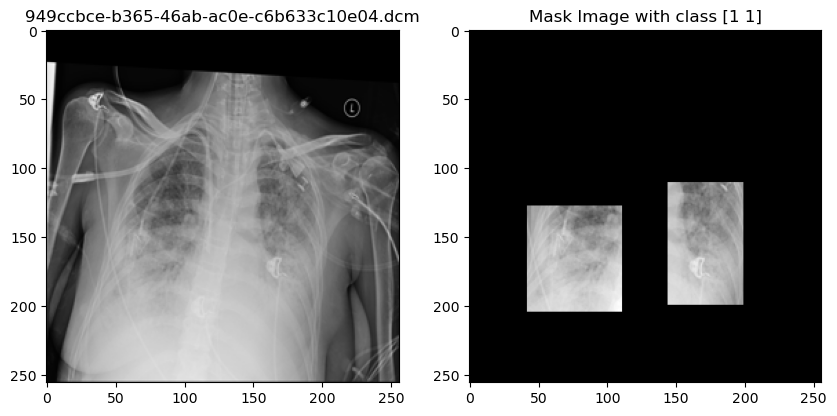

In [41]:
import cv2

# Load and display a random sample and their bounding boxes

class_ids = [0]
while class_ids[0] == 0:  ## look for a mask
    image_id = random.choice(dataset_train.image_ids)
    image_fp = dataset_train.image_reference(image_id)
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title(os.path.basename(image_fp))

plt.subplot(1, 2, 2)
masked = np.zeros(image.shape[:2])
for i in range(mask.shape[2]):
    masked += image[:, :, 0] * mask[:, :, i]
plt.imshow(masked, cmap='gray')

plt.title(f'Mask Image with class {class_ids}')
plt.show()

In [42]:
# Define image augmentation sequence
augmentation = iaa.Sequential([
    
    # One of the following geometric transformations:
    iaa.OneOf([ 
        # Affine transformation: includes scaling, translating, rotating, and shearing
        iaa.Affine(
            scale={"x": (0.98, 1.02), "y": (0.98, 1.04)},  # Scale images
            translate_percent={"x": (-0.02, 0.02), "y": (-0.04, 0.04)},  # Translate images
            rotate=(-10, 10),  # Rotate images
            shear=(-1, 1),  # Shear images
        ),
        # Piecewise affine transformation: A flexible local deformation of images
        #iaa.PiecewiseAffine(scale=(0.001, 0.025)),
    ]),
])


'''
    # One of the following brightness or contrast adjustments:
    iaa.OneOf([
        # Multiply all pixels in an image with a specific value, hence changing the brightness of the images
        iaa.Multiply((0.9, 1.1)),  
        # Change the contrast of images by normalizing their histogram
        iaa.ContrastNormalization((0.9, 1.1)),  
    ]),

    # One of the following blurring or sharpening processes:
    iaa.OneOf([
        # Gaussian blur disturbs pixel intensities which removes "high-frequency" noise 
        iaa.GaussianBlur(sigma=(0.0, 0.1)), 
        # Sharpen the images
        iaa.Sharpen(alpha=(0.0, 0.1)),  
    ]),'''



Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     16
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        3
DETECTION_MIN_CONFIDENCE       0.8999999761581421
DETECTION_NMS_THRESHOLD        0.6000000238418579
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 16
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  256
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  256
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.25, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE             

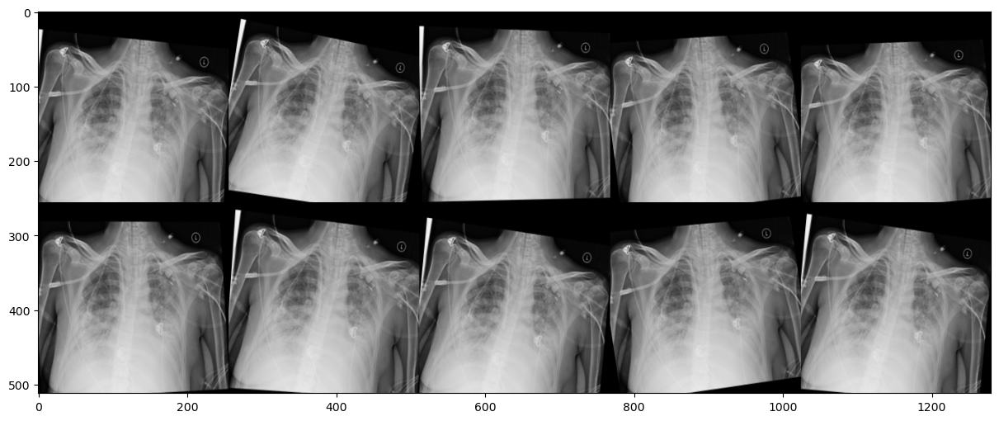

In [48]:
# Test the image augmentation on a single image.
# Draw a grid of several versions of the image with different augmentations
imggrid = augmentation.draw_grid(image[:, :, 0], cols=5, rows=2)

# Display the grid
plt.figure(figsize=(15, 6))
_ = plt.imshow(imggrid[:, :, 0], cmap='gray')

# Configuration class for pneumonia detection on the RSNA pneumonia dataset
class DetectorConfig(Config):
    """Configuration for training pneumonia detection on the RSNA pneumonia dataset.
    Overrides values in the base Config class.
    """
    
    # Give the configuration a recognizable name  
    NAME = 'pneumonia'
    
    # Set the GPU count and images per GPU for training
    GPU_COUNT = 1
    IMAGES_PER_GPU = batch_size
    
    # Set the backbone model and batch size
    BACKBONE = hpc.iloc[0]['backbone']
    BATCH_SIZE = hpc.iloc[0]['batch_size']
    
    # Set the number of classes: background + 1 pneumonia class
    NUM_CLASSES = 2  
    
    # Set whether to use mini-mask
    USE_MINI_MASK = False
    
    # Set the minimum and maximum image dimensions
    IMAGE_MIN_DIM = 256
    IMAGE_MAX_DIM = 256
    
    LOSS_WEIGHTS = {'rpn_class_loss': 1.0, 
                    'rpn_bbox_loss': 1.0, 
                    'mrcnn_class_loss': 1.25, 
                    'mrcnn_bbox_loss': 1.0, 
                    'mrcnn_mask_loss': 1.0}
    
    # Set the scales for the region proposal network (RPN) anchors
#    RPN_ANCHOR_SCALES = (32, 64, 128) #, 256
#    RPN_TRAIN_ANCHORS_PER_IMAGE = 32
    
    # Set the number of ROIs per image for training
    TRAIN_ROIS_PER_IMAGE = 8
    # Set the maximum ground truth and detection instances
    MAX_GT_INSTANCES = 4
    DETECTION_MAX_INSTANCES = 3
    
    # Minority class ratio
    ROI_POSITIVE_RATIO = 0.225
    
    # Set the minimum detection confidence
    DETECTION_MIN_CONFIDENCE = hpc.iloc[0]['det_min_conf']
    
    # Set the detection and RPN NMS threshold
    DETECTION_NMS_THRESHOLD = hpc.iloc[0]['det_nms_th']
    RPN_NMS_THRESHOLD = hpc.iloc[0]['rpn_nms_th']
    
    # Set the steps per epoch
    STEPS_PER_EPOCH = hpc.iloc[0]['steps_per_epoch']

# Create an instance of the configuration class
config = DetectorConfig()

# Display the configuration
config.display()


In [49]:
# Instantiate the MaskRCNN model in training mode using the given configurations and model directory
model = modellib.MaskRCNN(mode='training', config=config, model_dir=ROOT_DIR)

# Load the weights from the COCO dataset, excluding the last layers
# This is because the last layers require a matching number of classes
model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])


In [50]:
results_df =pd.read_csv('Results DICOM PNG.csv')

In [51]:
# Define the path where the checkpoints will be saved
checkpoint_path = os.path.join(ROOT_DIR, "mask_rcnn_{}_*epoch*.h5".format(config.NAME.lower()))

# Format the checkpoint file name to include the epoch number
checkpoint_path = checkpoint_path.replace("*epoch*", "{epoch:04d}")

# Set up a callback to save the model's weights after each epoch
callbacks = [keras.callbacks.ModelCheckpoint(checkpoint_path, verbose=1, 
                                             save_weights_only=True, save_freq='epoch')]


In [52]:
%%time

# Train the model on the dataset
model.train(dataset_train, dataset_val, 
            learning_rate=hpc.iloc[0]['learning_rate'], 
            epochs=hpc.iloc[0]['epochs'], 
            custom_callbacks=callbacks,
            layers=hpc.iloc[0]['layers'],
            augmentation=augmentation)

# Save the history of the training for future analysis
history = model.keras_model.history.history



Starting at epoch 0. LR=0.004000000189989805

Checkpoint Path: pneumonia20230730T0326\mask_rcnn_pneumonia_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeDistributed)
mrcnn_mask_deconv      (Tim

1067/1067 [==============================] - ETA: 0s - batch: 533.0000 - size: 16.0000 - loss: 1.4307 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.3919 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.4028
Epoch 11: saving model to mask_rcnn_pneumonia_0011.h5
1067/1067 [==============================] - 1084s 1s/step - batch: 533.0000 - size: 16.0000 - loss: 1.4307 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.3919 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.4277 - mrcnn_mask_loss: 0.4028 - val_loss: 1.5415 - val_rpn_class_loss: 0.0488 - val_rpn_bbox_loss: 0.4449 - val_mrcnn_class_loss: 0.1728 - val_mrcnn_bbox_loss: 0.4748 - val_mrcnn_mask_loss: 0.4003
Epoch 12/12
1067/1067 [==============================] - ETA: 0s - batch: 533.0000 - size: 16.0000 - loss: 1.4196 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.3864 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.4236 - mrcnn_mask_loss: 0.3995
Epoch 12: saving model to mask_rcnn_pneumonia_0012.h5
1067/1067 [======

In [53]:
# Define the range of epochs combining history over all runs
epochs = range(1, len(next(iter(history.values())))+1)

# Create a pandas DataFrame from the history dictionary
Results_MaskRCNN = pd.DataFrame(history, index=epochs)
Results_MaskRCNN

,loss,rpn_class_loss,rpn_bbox_loss,mrcnn_class_loss,mrcnn_bbox_loss,mrcnn_mask_loss,val_loss,val_rpn_class_loss,val_rpn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_bbox_loss,val_mrcnn_mask_loss
1,2.163973,0.089802,0.630541,0.269921,0.692802,0.480907,1.859143,0.092488,0.507191,0.261142,0.597751,0.400570
2,1.716790,0.062483,0.449295,0.220121,0.546375,0.438516,1.661175,0.059979,0.457907,0.191595,0.543698,0.407996
3,1.590891,0.056026,0.422739,0.198175,0.486516,0.427436,1.622680,0.064337,0.481100,0.179657,0.517197,0.380389
4,1.551704,0.054076,0.418414,0.190186,0.467800,0.421229,1.554842,0.051831,0.448617,0.179242,0.490333,0.384820
5,1.544423,0.054894,0.420934,0.183441,0.466310,0.418845,1.609771,0.057631,0.488763,0.176077,0.502846,0.384454
6,1.490315,0.051377,0.409387,0.171702,0.445750,0.412099,1.542837,0.051433,0.447244,0.165891,0.472731,0.405537
7,1.480336,0.050328,0.407394,0.170309,0.440914,0.411390,1.796122,0.067321,0.689499,0.168526,0.486463,0.384313
8,1.470508,0.049875,0.403510,0.169666,0.439495,0.407962,1.592363,0.057538,0.462251,0.158030,0.491213,0.423331
9,1.462488,0.049638,0.401283,0.168468,0.436484,0.406615,1.481858,0.062966,0.469181,0.112723,0.451856,0.385133
10,1.435226,0.048205,0.393768,0.160772,0.430036,0.402445,1.411709,0.048679,0.399495,0.160526,0.439216,0.363792


In [54]:
Results_MaskRCNN.to_csv('Results_MaskRCNN.csv', index = False)

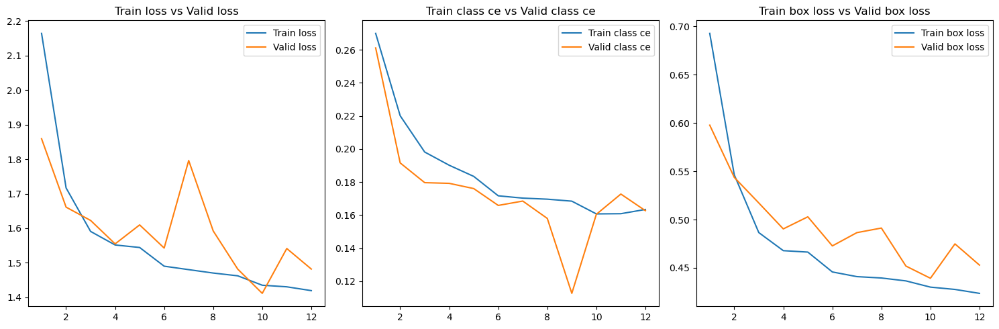

In [55]:
# Create a subplot with 1 row and 3 columns with a given size
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot Train loss and Valid loss
axs[0].plot(epochs, history["loss"], label="Train loss")
axs[0].plot(epochs, history["val_loss"], label="Valid loss")
axs[0].set_title('Train loss vs Valid loss')
axs[0].legend()

# Plot Train class ce and Valid class ce
axs[1].plot(epochs, history["mrcnn_class_loss"], label="Train class ce")
axs[1].plot(epochs, history["val_mrcnn_class_loss"], label="Valid class ce")
axs[1].set_title('Train class ce vs Valid class ce')
axs[1].legend()

# Plot Train box loss and Valid box loss
axs[2].plot(epochs, history["mrcnn_bbox_loss"], label="Train box loss")
axs[2].plot(epochs, history["val_mrcnn_bbox_loss"], label="Valid box loss")
axs[2].set_title('Train box loss vs Valid box loss')
axs[2].legend()

plt.tight_layout()
plt.show()


In [56]:
# Get the epoch number where the validation loss was minimal
best_epoch = np.argmin(history["val_loss"])

# Print the epoch number (plus one as counting starts from 0) and the validation loss of that epoch
print("Best Epoch:", best_epoch + 1, history["val_loss"][best_epoch])


Best Epoch: 10 1.4117087483406068


In [57]:
# Use Python's filter function to filter out the file that starts with 'mask_rcnn_pneumonia' 
# and contains the string of best_epoch in its name from the list of files in the current directory
x = filter(lambda f: (f.startswith('mask_rcnn_pneumonia') and ((4 - len(str(best_epoch + 1))) * str(0) 
                                                               + str(best_epoch + 1)) in f), 
                                                                 os.listdir(os.path.join(os.getcwd(), '')))

# Convert the filtered object to a list and get the first item
model_path = list(x)[0]

# Print the found model path
print('Found model at {}'.format(model_path))


Found model at mask_rcnn_pneumonia_0010.h5


In [58]:
#Load_model_path = 'mask_rcnn_pneumonia_0002.h5'
#model_path = Load_model_path


In [59]:
# Create an inference configuration class that inherits from the DetectorConfig
class InferenceConfig(DetectorConfig):
    # Set the GPU count to 1
    GPU_COUNT = 1
    # Set the number of images per GPU to 1
    IMAGES_PER_GPU = 1

# Instantiate the InferenceConfig
inference_config = InferenceConfig()


In [60]:
# Import necessary modules
from keras.backend import manual_variable_initialization 
import tensorflow.compat.v1 as tf

# Set manual variable initialization to True
manual_variable_initialization(True)

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          model_dir='.', 
                          config=inference_config)

# Ensure that the model path is not empty
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)

# Load the trained weights into the model
tf.keras.Model.load_weights(model.keras_model, model_path, by_name=True)


Loading weights from  mask_rcnn_pneumonia_0010.h5


In [61]:
# Function to set color for classes
def get_colors_for_class_ids(class_ids):
    # Initialize an empty list for colors
    colors = []
    
    # Iterate over class IDs
    for class_id in class_ids:
        # Check if class ID equals 1
        if class_id == 1:
            # If true, append a specific color (in RGB format) to the colors list
            colors.append((.941, .204, .204))
    
    # Return the list of colors
    return colors


**How does the predicted box compared to the expected value? Let's use the validation dataset to check.**


In [62]:
# Prepare the test dataset
dataset_test = DetectorDataset(sample_test, image_annotations, 256, 256)
dataset_test.prepare()

# Subset the dataset to the first 1000 images
images = dataset_test.image_ids

# Initialize empty lists for true and predicted bounding boxes
ytrue = []
ypred = []

# Iterate over the images
for i in range(len(images)):
    # Load the image along with its ground truth bounding boxes and masks
    original_image, _, _, gt_bbox, gt_mask = modellib.load_image_gt(dataset_test, inference_config, images[i])
    
    # Append the ground truth bounding boxes to the true list
    ytrue.append(gt_bbox)
    
    # Detect objects in the image and get the predicted bounding boxes
    results = model.detect([original_image])
    
    # Append the predicted bounding boxes to the prediction list
    ypred.append(results[0]['rois'])



*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 


*** No instances to display *** 



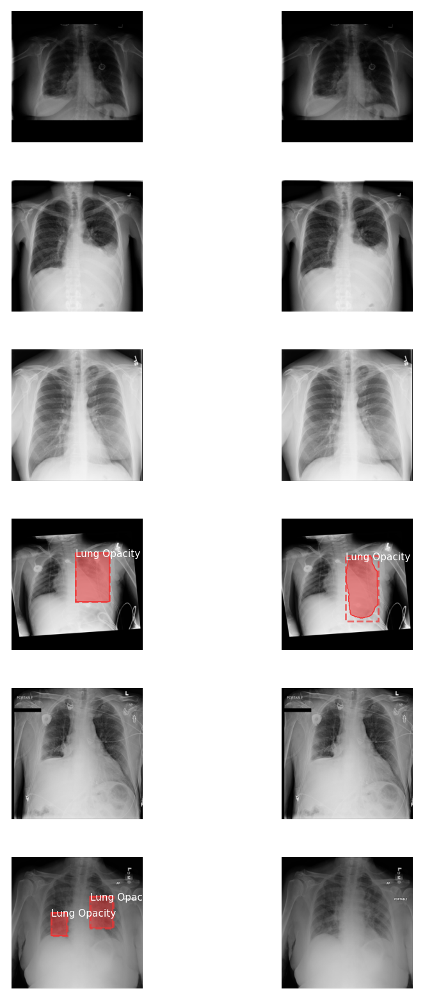

In [65]:
# Import required libraries
import matplotlib.pyplot as plt
from skimage.transform import resize

# Set the dataset to be the test dataset
dataset = dataset_test

# Create a new figure
fig = plt.figure(figsize=(10, 20))

# Loop through the images
for i in range(6):

    # Select a random image id
    image_id = random.choice(dataset.image_ids)

    # Load the original image along with its metadata, class id, bounding boxes, and masks
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, inference_config, image_id)

    # Plot the original image with bounding boxes and masks
    plt.subplot(6, 2, 2*i + 1)
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id,
                                dataset.class_names,
                                colors=get_colors_for_class_ids(gt_class_id), ax=fig.axes[-1])
    
    # Detect objects in the image
    plt.subplot(6, 2, 2*i + 2)
    results = model.detect([original_image]) 
    r = results[0]

    # Plot the image with detected objects
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'],
                                dataset.class_names, r['scores'],
                                colors=get_colors_for_class_ids(r['class_ids']), ax=fig.axes[-1])


### Observations
Images Ground truth (Left side Images above) Predicted (Right side images) indicate that in 5 out of 6 cases the model correctly predicted the ground truth. Errors are expected as large number of X-rays are for **not normal** cases which have features similar to **opacity / pneumonia** cases. Tuning efforts has resulted in improvement of recall

In [66]:
def loadmasks(bboxes_list):
    """
    Function to load masks for given bounding boxes.
    
    Args:
    bboxes_list : List of bounding boxes for images.
    
    Returns:
    masks : List of masks for given bounding boxes.
    """
    
    # Initialize empty list to hold masks
    masks = []
    
    # Iterate through list of bounding boxes
    for bboxes in bboxes_list:
        # Initialize mask as 2D array filled with zeros
        mask = np.zeros((ORIG_SIZE, ORIG_SIZE))
        
        # If bounding boxes list is empty, append mask and continue to next iteration
        if bboxes.size == 0:  # empty array, no bounding boxes
            masks.append(mask)
            continue
            
        # Iterate through bounding boxes
        for bbox in bboxes:
            # Get dimensions of bounding box
            x, y, w, h = bbox
            
            # Calculate the integer coordinates for bounding box
            x1 = math.floor(x)
            y1 = math.floor(y)
            x2 = math.ceil(x+w)
            y2 = math.ceil(y+h)
            
            # Add bounding box to mask
            mask[y1:y2, x1:x2] = 1
        
        # Append mask to list of masks
        masks.append(mask)
        
    # Return list of masks
    return masks


In [67]:
def npmean_iou(bbox1_list, bbox2_list):
    """
    Function to calculate mean Intersection over Union (IoU) for given lists of bounding boxes.
    
    Args:
    bbox1_list : List of bounding boxes for the first set of images.
    bbox2_list : List of bounding boxes for the second set of images.
    
    Returns:
    iou : Mean IoU for the given bounding boxes.
    """
    
    # Load masks for the bounding boxes
    mask1_list = loadmasks(bbox1_list)
    mask2_list = loadmasks(bbox2_list)
    
    # Calculate union of the masks
    union = np.array([np.count_nonzero(mask1) + np.count_nonzero(mask2) \
                      for mask1, mask2 in zip(mask1_list, mask2_list)]).astype(np.float32)
    
    # Calculate intersection of the masks
    intersection = np.array([np.count_nonzero(np.logical_and(mask1, mask2)) \
                             for mask1, mask2 in zip(mask1_list, mask2_list)]).astype(np.float32)
    
    # Initialize smoothing factor to avoid division by zero
    smooth = np.ones(intersection.shape)
    
    # Calculate mean IoU
    iou = np.mean((intersection + smooth) / (union - intersection + smooth))
    
    # Return mean IoU
    return iou


In [68]:
# Calculate the Mean Intersection over Union (IoU)
iou = npmean_iou(ytrue, ypred)

# Convert ytrue and ypred to binary format
ytrue_binary = [1 if np.sum(x) > 1 else 0 for x in ytrue]
ypred_binary = [1 if np.sum(x) > 1 else 0 for x in ypred]

# Calculate precision, recall and F1 score
prec, rec, f1s, _ = prf(ytrue_binary, ypred_binary, average='binary')

# Print the performance parameters
print(f'Precision = {prec:.2f}, Recall = {rec:.2f}, F1 Score = {f1s:.2f}, Mean IOU = {iou:.2f}')

end_time = time()

Precision = 0.30, Recall = 0.49, F1 Score = 0.37, Mean IOU = 0.57


Threshold = 0.5:
Classification Report
              precision    recall  f1-score   support

  No_Opacity       0.82      0.66      0.73      3308
     Opacity       0.30      0.49      0.37       962

    accuracy                           0.62      4270
   macro avg       0.56      0.58      0.55      4270
weighted avg       0.70      0.62      0.65      4270


 Confusion Matrix


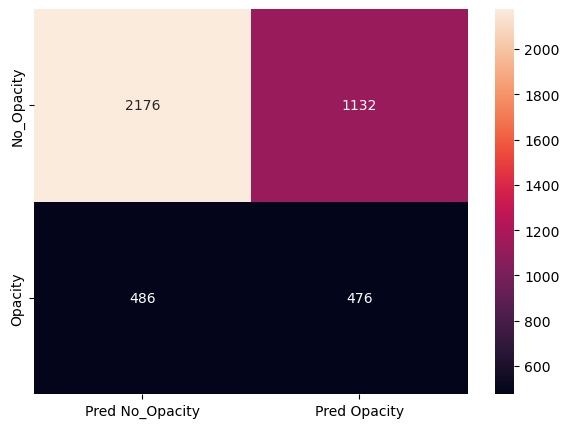

In [69]:
sub_result_df = plot_precision_recall(ypred_binary, ytrue_binary, [0.5], mode='bin')

results_df = update_results(sub_result_df, Desc, Saved_Model, end_time-start_time)
results_df.to_csv('Results DICOM PNG.csv', index = False)

### Observations
1. Mean IOU is 0.57, which is above 0.5 indicating the improved predictive power of the model.
2. Recall, precision, IOU have further scope of improve with advanced hyperparameter tuning. This requires further research on advanced techniques, reuires more time and processing resources.

### Final steps - Create the submission file

In [70]:
# Get filenames of test dataset DICOM images
test_image_fps = get_dicom_fps(test_dicom_dir)

In [84]:
def predict(image_fps, filepath='submission.csv', min_conf=0.9):
    """
    Make predictions on test images and write out a submission file
    
    Parameters:
    image_fps: A list of filepaths for the images
    filepath: The path for the submission file
    min_conf: The minimum confidence for a detection to be considered
    """
    # Resize factor for image
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]

    # Open the submission file in write mode
    with open(filepath, 'w') as file:
        file.write("patientId,PredictionString\n")

        # For each image
        for image_id in tqdm(image_fps):
            # Read the image
            ds = pydicom.read_file(image_id)
            # If grayscale. Convert to RGB for consistency.
            image = Image.fromarray(ds.pixel_array).convert('RGB')#ds.pixel_array
    
            # Convert the PIL image to a NumPy array
            image = np.array(image)

            # Resize the image
            image, window, scale, padding, crop = utils.resize_image(
                image,
                min_dim=config.IMAGE_MIN_DIM,
                min_scale=config.IMAGE_MIN_SCALE,
                max_dim=config.IMAGE_MAX_DIM,
                mode=config.IMAGE_RESIZE_MODE)
            
            image = image - np.min(image)

            # Get patient id from image filepath
            patient_id = os.path.splitext(os.path.basename(image_id))[0]

            # Predict on the image
            results = model.detect([image])
            r = results[0]

            # Initialize the output string
            out_str = ""
            out_str += patient_id
            out_str += ","

            # If no instances are found, pass
            if len(r['rois']) == 0:
                pass
            else:
                # For each instance
                for i in range(len(r['rois'])):
                    # If the score is greater than minimum confidence
                    if r['scores'][i] > min_conf:
                        out_str += ' '
                        out_str += str(round(r['scores'][i], 2))
                        out_str += ' '

                        # Get bounding box coordinates and dimensions
                        x1 = r['rois'][i][1]
                        y1 = r['rois'][i][0]
                        width = r['rois'][i][3] - x1
                        height = r['rois'][i][2] - y1

                        # Append to output string
                        bboxes_str = "{} {} {} {}".format(x1*resize_factor, y1*resize_factor, \
                                                           width*resize_factor, height*resize_factor)
                        out_str += bboxes_str

            # Write to the file
            file.write(out_str+"\n")


In [85]:
# Set the submission file path
submission_fp = os.path.join(ROOT_DIR, 'submission.csv')

# Run predictions on the test images and create a submission file
predict(test_image_fps, filepath=submission_fp)


100%|██████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:17<00:00, 21.75it/s]


In [86]:
# cross check the submission
output = pd.read_csv(submission_fp)
output.head(8)

,patientId,PredictionString
0,03f9e13f-1239-4d82-802d-3ea20731e1db,NaN
1,c127904f-d321-4d79-b02d-599b73b0a734,NaN
2,1b4e5de2-dfbc-48ca-91cd-90bc723d1d3f,0.93 584.0 436.0 228.0 292.0
3,1c36091c-041b-4a57-b833-046c6eec605c,0.95 544.0 220.0 296.0 612.0 0.94 556.0 328.0...
4,0d2860d1-9550-42e8-be36-036fb4927bec,NaN
5,138ff8b1-a35f-4187-a76b-3eaa01407591,NaN
6,107cde4d-12de-42ce-ab5b-abd6a2c55c2b,NaN
7,2c392528-045f-4ff7-a10a-1a71487f3f17,0.93 184.0 576.0 260.0 236.0


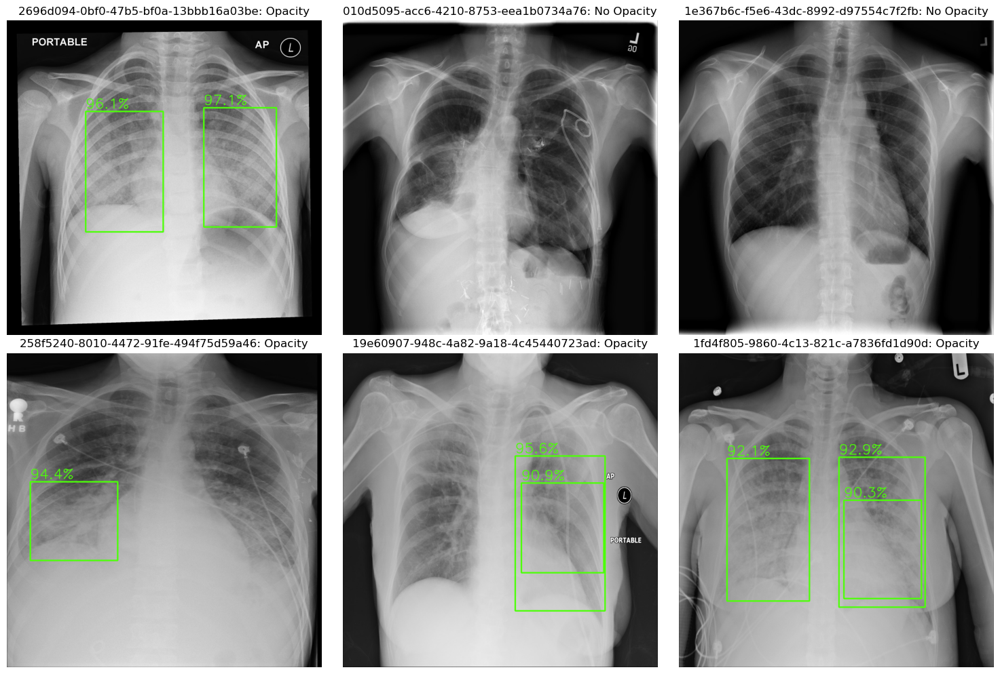

In [87]:
def visualize_results(image_id, ax): 
    ds = pydicom.read_file(image_id)
    
    # original image 
    # If grayscale. Convert to RGB for consistency.
    image = Image.fromarray(ds.pixel_array).convert('RGB')
    
    # Convert the PIL image to a NumPy array
    image = np.array(image)
    
    # assume square image 
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]
    # Resize the image    
    resized_image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)
    
    resized_image = resized_image - np.min(resized_image)
    patient_id = os.path.splitext(os.path.basename(image_id))[0]

    results = model.detect([resized_image])
    r = results[0]
    
    for i, bbox in enumerate(r['rois']): 
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2] * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (77, 255, 9), 3, 1)
        
        # Draw the confidence score above the bounding box
        score = r['scores'][i]
        confidence_text = f"{score*100:.1f}%"
        cv2.putText(image, confidence_text, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (77, 255, 9), 2)
    
    # Display image with title
    title = f'{patient_id}: {"Opacity" if len(r["rois"]) > 0 else "No Opacity"}'
    ax.set_title(title)
    ax.imshow(image, cmap=plt.cm.gist_gray)
    ax.axis('off')  # Hide axis

def display_test_images(n_img, n_col):
    # calculate the number of rows needed
    n_rows = math.ceil(n_img / n_col)
    
    fig, axes = plt.subplots(n_rows, n_col, figsize=(n_col * 5, n_rows * 5))
    axes = axes.ravel()  # flatten axes for easier iteration
    
    for i in range(n_img):
        image_id = random.choice(test_image_fps)
        visualize_results(image_id, axes[i])
    
    # Remove unused subplots
    if n_img % n_col != 0:
        for i in range(n_img, n_rows * n_col):
            fig.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()

# Show 10 images in a grid
display_test_images(6, 3)

## Step 4: Pickle the model for future prediction [ 3 Points]

In [89]:
# Pickle the best Mask R-CNN model 
import pickle

pickle_fn = 'Best MRCNN.pkl'

pickle.dump(model, open(pickle_fn, 'wb'))

## Comparison of Performance parameters

In [98]:
results_df

,Description,Threshold,Accuracy,Precision,Recall,F1 Score,Model,Execution Time
0,CNN for classification - with recall,0.2,0.766429,0.480086,0.722853,0.576973,CNN- DICOM 224r.h5,560.580348
1,CNN for classification - with recall,0.5,0.811786,0.680000,0.275527,0.392157,CNN- DICOM 224r.h5,560.580348
2,CNN for classification - with recall & accuracy,0.2,0.530357,0.305246,0.886548,0.454130,CNN- DICOM 224-ra.h5,495.309162
3,CNN for classification - with recall & accuracy,0.5,0.798929,0.629808,0.212318,0.317576,CNN- DICOM 224-ra.h5,495.309162
4,VGG16 with recall & accuracy,0.2,0.756786,0.470205,0.818476,0.597280,VGG16- DICOM 224 ra.h5,524.290136
5,VGG16 with recall & accuracy,0.5,0.831071,0.673913,0.452188,0.541222,VGG16- DICOM 224 ra.h5,524.290136
6,VGG16 with recall,0.2,0.815357,0.564767,0.706645,0.627790,VGG16- DICOM 224 r.h5,521.236001
7,VGG16 with recall,0.5,0.842500,0.727979,0.455429,0.560319,VGG16- DICOM 224 r.h5,521.236001
8,Object Detection- Mask R-CNN,0.2,0.811429,0.561043,0.662885,0.607727,Mask R-CNN- DICOM 224.h5,541.458546
9,Object Detection- Mask R-CNN,0.5,0.818929,0.586751,0.602917,0.594724,Mask R-CNN- DICOM 224.h5,541.458546


# Comparison of Results

The table presents the results from several machine learning models. These models have been trained and tested on different tasks (classification or object detection), using different architectures (CNN, VGG16, Mask R-CNN), and different image types (DICOM, PNG).

Performance metrics include accuracy, precision, recall, F1 score, and execution time. The threshold column likely refers to a decision threshold for classifying an instance to a particular class. Different thresholds yield different trade-offs between precision (how many selected items are relevant?) and recall (how many relevant items are selected?).

In general, increasing the threshold appears to result in a higher precision but lower recall. For example, consider the CNN for classification - with recall model. The precision increases from 0.48 to 0.68 as the threshold increases from 0.2 to 0.5, but the recall decreases from 0.72 to 0.28.

Interestingly, the performance of the same architecture can vary significantly depending on the input image type. Compare VGG16- Improvements using PNG and VGG16 with recall & accuracy. The accuracy is similar for both models, but the model trained on PNG images has a much lower execution time, which could be a critical factor in a real-time application.

Finally, the Mask R-CNN models show a significant increase in execution time, likely due to the more complex task of object detection (compared to image classification). The last row is especially interesting because even though the precision is low (0.219659), the recall is perfect (1.000000), implying the model identifies all relevant instances but also includes many irrelevant ones.

# Discusion on Results

In medical diagnostics, especially in areas like pneumonia detection where a false negative can have serious health implications, achieving a high recall is often a primary goal. A high recall rate in the 'Opacity' class means that the model can successfully identify a high proportion of actual pneumonia cases.

Case 1:
In this scenario, the recall for detecting 'Opacity', which indicates possible pneumonia, is relatively low at 0.30. This means that 70% of actual pneumonia cases were not identified by the model (false negatives), which could have serious health implications for those patients. The precision for detecting 'Opacity' is also relatively low (0.62), indicating that when the model predicts an 'Opacity' case, it is correct 62% of the time.

Case 2:
In the second scenario, the model performance has improved. The recall for 'Opacity' is 0.50, which means the model is now correctly identifying half of the pneumonia cases. However, this also means that half of the pneumonia cases are still missed, leading to a significant number of false negatives. The precision for 'Opacity' is the same as in Case 1 (0.62).

In both cases, the models have better performance for the 'Normal'/'No_Opacity' class. This could be due to class imbalance in the dataset (if there are significantly more 'Normal' images than 'Opacity' images), or it could be that the models have a harder time identifying the features that indicate 'Opacity' in the images.

In conclusion, while the models demonstrate reasonable performance in classifying 'Normal'/'No_Opacity' images, they struggle with accurately identifying 'Opacity' images, indicative of potential pneumonia. The low recall in both cases suggests that these models could miss a substantial number of pneumonia cases, which is a significant issue from a healthcare perspective. Further work should focus on improving the recall rate for 'Opacity' images, potentially by gathering more labeled 'Opacity' data, implementing data augmentation techniques, experimenting with different model architectures or using techniques to address class imbalance such as oversampling the minority class or undersampling the majority class.

# Conclusion

### 1. Comparison of Results

- **Threshold Impact**: The table clearly shows that varying thresholds have significant impacts on the performance metrics. Lower thresholds tend to favor higher recall at the expense of other metrics, while higher thresholds might balance accuracy and precision but reduce recall.
- **Model Complexity**: The CNN models generally have a shorter execution time compared to more complex models like VGG16 and Mask R-CNN.
- **Dataset Influence**: Using all images converted to PNG generally seems to affect performance differently across models. Some models improved, while others did not.
- **Object Detection vs Classification**: Mask R-CNN for object detection exhibits unique behaviors in terms of precision and recall, reflecting the different nature of the task compared to pure classification models.

### 2. Discussion on the Results

- **Trade-offs between Recall and Other Metrics**: Higher recall might be critical in medical applications to reduce false negatives. However, the increase in recall often comes at the cost of accuracy and precision, indicating a need for careful threshold management.
- **Effect of Architecture and Training Strategies**: The results show that different architectures and training metrics (e.g., training with Recall or with Recall & Accuracy) lead to different behaviors. This emphasizes the importance of model selection and hyperparameter tuning.
- **Execution Time Considerations**: The execution time for different models varies significantly. For real-world applications, this aspect must be considered, especially when the dataset size is large.
- **Improvements with Image Conversion**: The conversion of images to PNG has shown mixed results, indicating that image preprocessing needs to be adapted specifically for each model and task.

### 3. Important notes and Future improvements

The results obtained from various models, thresholds, and image processing methods demonstrate the complexity and multifaceted nature of the problem. Key insights include:

- The critical role of threshold management in balancing recall with other performance parameters.
- The need to carefully select and tune model architectures based on the specific requirements of the task.
- The importance of considering execution time, especially for large-scale applications.
- A nuanced understanding of image preprocessing and its effect on different models.

The study offers valuable directions for future work, especially in fine-tuning models, selecting appropriate thresholds, and developing preprocessing techniques tailored to specific tasks. Combining different models or using ensemble methods might also provide a path to further improvements. Overall, the comprehensive exploration carried out sets a strong foundation for advancing the state-of-the-art in medical image analysis for pneumonia detection.


# Milestone 3: 

## Process: 
### Code for deploying the model using flask is below. Complete model deployment code along with demo video is in final_deployment folder

```python
from flask import Flask, render_template, request, send_file
import os
import pydicom
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pf
import tensorflow as tf
from tensorflow.keras.models import load_model
from flask import Flask, render_template, request
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224

app = Flask(__name__)

def iou_loss(y_true, y_pred):
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)  # Ensure predictions are binary (0 or 1)
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2])
    union = tf.reduce_sum(y_true + y_pred, axis=[1, 2]) - intersection
    iou = (intersection + tf.keras.backend.epsilon()) / (union + tf.keras.backend.epsilon())
    return tf.reduce_mean(iou)

custom_objects = {"iou_bce_loss": iou_bce_loss,
                  "mean_iou": mean_iou
}

model = load_model("C:/Users/Admin/Downloads/Capstone_Project/Deployment/final_deployment/maskrcnn_model_dcm_21k.h5",custom_objects=custom_objects)

ORG_INPUT_FOLDER = "original/png_images"
PNG_OUTPUT_FOLDER = "static/png_images"
os.makedirs(PNG_OUTPUT_FOLDER, exist_ok=True)
os.makedirs(ORG_INPUT_FOLDER, exist_ok=True)

def preprocess(dicom_path): 
    im = pydicom.dcmread(dicom_path)
    im = im.pixel_array
    im = cv2.resize(im, (224, 224))
    return im   

def convert_to_png(pixel_array, output_path):
    pixel_array = (pixel_array - pixel_array.min()) * (255 / (pixel_array.max() - pixel_array.min()))
    pixel_array = pixel_array.astype(np.uint8)
    if len(pixel_array.shape) == 2:
         pixel_array = cv2.cvtColor(pixel_array, cv2.COLOR_GRAY2RGB)
    image = Image.fromarray(pixel_array)
    image.save(output_path)

@app.route("/", methods=["GET", "POST"])
def upload_dicom():
    if request.method == "POST":
        dicom_file = request.files["file"]
        if dicom_file:            
            dicom_path = os.path.join(PNG_OUTPUT_FOLDER, "uploaded.dcm")
            dicom_file.save(dicom_path)
            im = pydicom.dcmread(dicom_path)
            im = im.pixel_array
            im = cv2.resize(im, (IMAGE_HEIGHT, IMAGE_WIDTH))
            im = np.stack((im,) * 3, -1)
            output_path = os.path.join(PNG_OUTPUT_FOLDER, "input.png")
            convert_to_png(im, output_path)
            im = im / 255.0  # Normalize the image to [0, 1]
            image = np.expand_dims(im, axis=0)
            predictions = model.predict(image)
            threshold_value = 0.10
            binary_mask = (predictions >= threshold_value).astype(np.uint8)
            contours, _ = cv2.findContours(binary_mask[0], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            bounding_boxes = []
            for contour in contours:
                x, y, width, height = cv2.boundingRect(contour)
                bounding_boxes.append((x, y, width, height))
            if len(bounding_boxes) == 0.0:
                Pneumonia = "The patient having No Opacity"
                output_path = os.path.join(PNG_OUTPUT_FOLDER, "uploaded.png")
                convert_to_png(im, output_path)
            else:
                Pneumonia = "The patient having Opacity"
                image_1 = preprocess(dicom_path)
                for box in bounding_boxes:
                    x, y, width, height = box
                    x1, y1 = int(x), int(y)
                    x2, y2 = int(x + width), int(y + height)
                    color = (0,255, 0)  # red color for the bounding boxes
                    thickness = 2
                    text = "Opacity"
                    imag_bb = cv2.rectangle(image_1, (x1, y1), (x2, y2), color, thickness)
                    cv2.putText(imag_bb, text, (x1, y1 - 5), cv2.FONT_ITALIC, 0.3,color, 2)
                output_path = os.path.join(PNG_OUTPUT_FOLDER, "uploaded.png")
                convert_to_png(imag_bb, output_path)
            
            return render_template("upload.html",
                                   Pneumonia=Pneumonia,
                                   image_path1="static


## Step 1: Design a clickable UI based interface 
which can allow the user to browse & input the image, output the class and the bounding box or mask [ highlight area of interest ] of the input image

### Clickable Interface

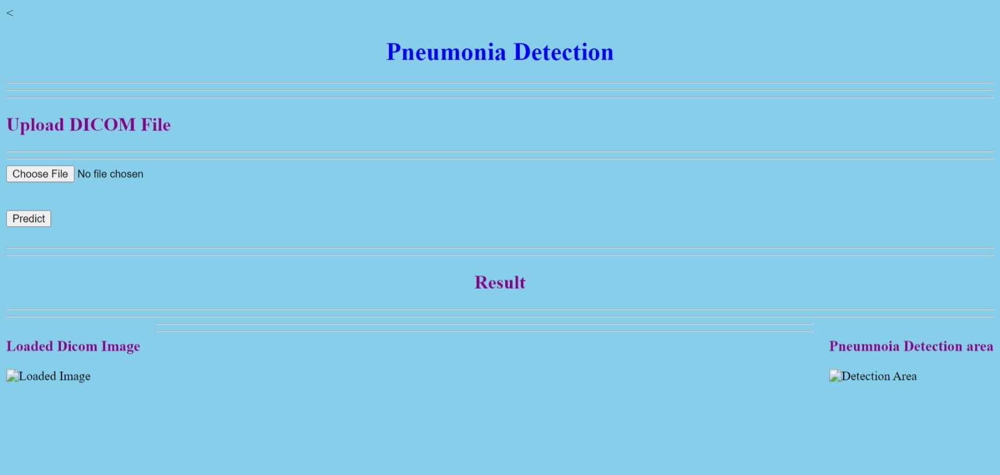

### Opacity case

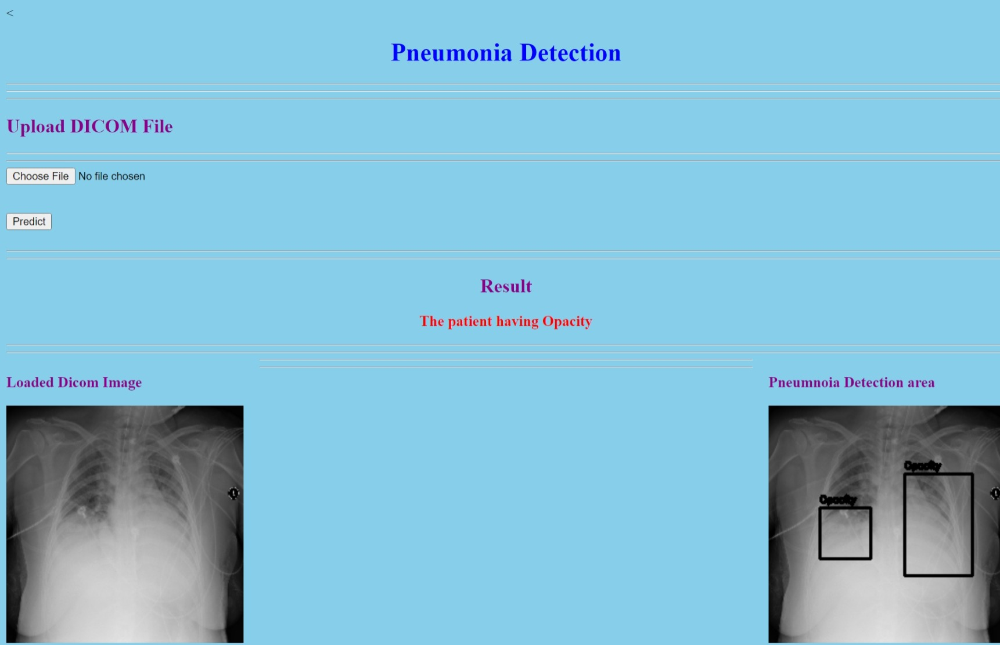

### No Opacity case

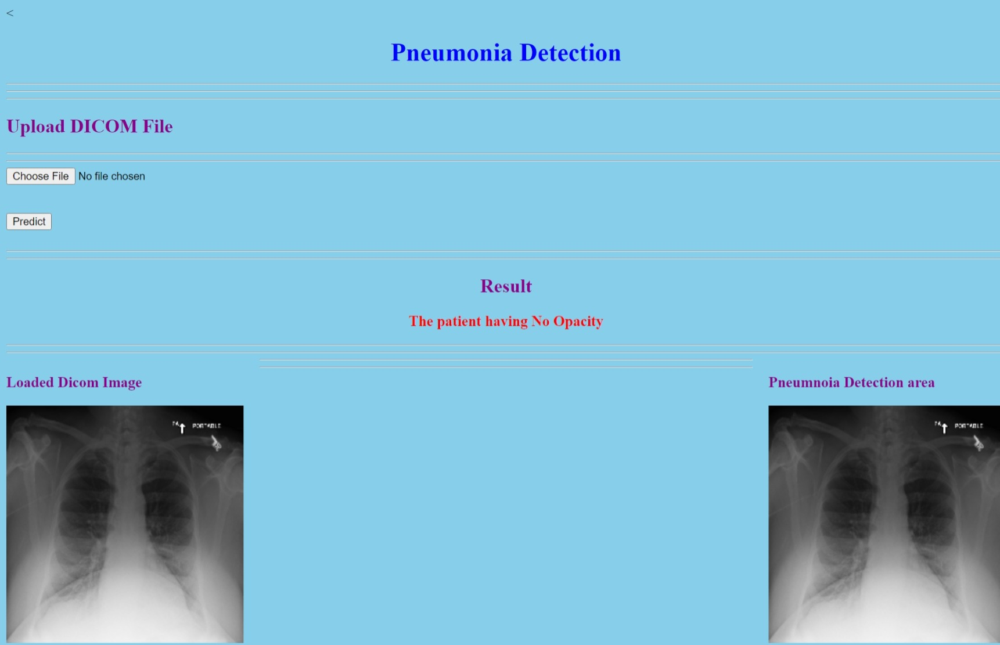

##  Submission: 
### 1. Final report, 
### 2. Jupyter Notebook in .ipynb and .html format 
### 3. with the addition of clickable UI based interface (zip file of folder with code and demo images and video)

In [ ]:
# END OF THE PROJECT _ _ _ _ _ _